# Region3 - All 479
## Xiaonan Wang
## 22Aug2026

### Setup and paths

In [1]:
suppressPackageStartupMessages({
  library(Seurat)
  library(SeuratObject)
  library(dplyr)
  library(tidyr)
  library(tibble)
  library(Matrix)
  library(ggplot2)
})

set.seed(1234)

In [2]:
PROJECT_ROOT <- "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Lab_members/Yanan_Hu/YNH_Xenium"
PIPELINE_REPO <- file.path(PROJECT_ROOT, "adipose_analysis", "YNH_Xenium_scWAT")
RUN_LABEL <- "full_notebook_qc_v2"
QC_RUN_ROOT <- file.path(
  PROJECT_ROOT,
  "adipose_analysis",
  "scwat_qc_outputs",
  RUN_LABEL
)
DOWNSTREAM_ROOT <- file.path(
  PROJECT_ROOT,
  "adipose_analysis",
  "scwat_downstream_outputs",
  RUN_LABEL
)
ANCHOR_ROOT <- file.path(
  DOWNSTREAM_ROOT,
  "03_region3_Primary479"
)
INPUT_ROOT <- file.path(PROJECT_ROOT, "adipose_data")

In [3]:
source(file.path(PIPELINE_REPO, "R", "source.R"))

In [4]:
assert_path_within(PROJECT_ROOT, QC_RUN_ROOT)
assert_path_within(PROJECT_ROOT, DOWNSTREAM_ROOT)
dir.create(DOWNSTREAM_ROOT, recursive = TRUE, showWarnings = FALSE)
assert_path_within(PROJECT_ROOT, ANCHOR_ROOT)
dir.create(ANCHOR_ROOT, recursive = TRUE, showWarnings = FALSE)

In [5]:
REGION_ID = "Region_3"

In [6]:
theme_cell <- function(base_size = 12) {
  theme_classic(base_size = base_size) +
    theme(
      panel.border = element_rect(
        colour = "black",
        fill = NA,
        linewidth = 0.8
      ),
      axis.line = element_line(colour = "black", linewidth = 0.6),
      axis.text = element_text(colour = "black"),
      axis.title = element_text(colour = "black"),
      strip.background = element_rect(
        fill = "white",
        colour = "black",
        linewidth = 0.8
      ),
      strip.text = element_text(face = "bold"),
      legend.title = element_text(face = "bold"),
      plot.title = element_text(face = "bold"),
      plot.subtitle = element_text(colour = "black")
    )
}

### Create Seurat Obj

In [118]:
region_data <- readRDS(
  file.path(
    PROJECT_ROOT,
    "adipose_analysis",
    "scwat_qc_outputs",
    RUN_LABEL,
    "downstream_inputs",
    paste0(REGION_ID, ".downstream_input.rds")
  )
)

In [7]:
names(region_data)

[1] "schema_version"       "region_id"            "section_status"      
 [4] "counts"               "features"             "cell_metadata"       
 [7] "gene_sets"            "raw_counts_preserved" "downstream_contract" 
[10] "mapping_requirements" "provenance"

In [8]:
colnames(region_data$cell_metadata)

[1] "cell_id"                                  
 [2] "x_centroid"                               
 [3] "y_centroid"                               
 [4] "transcript_counts"                        
 [5] "control_probe_counts"                     
 [6] "genomic_control_counts"                   
 [7] "control_codeword_counts"                  
 [8] "unassigned_codeword_counts"               
 [9] "deprecated_codeword_counts"               
[10] "total_counts"                             
[11] "cell_area"                                
[12] "nucleus_area"                             
[13] "nucleus_count"                            
[14] "segmentation_method"                      
[15] "region_id"                                
[16] "nCount_Xenium"                            
[17] "nFeature_Xenium"                          
[18] "control_fraction_cell"                    
[19] "nucleus_missing_flag"                     
[20] "multiple_nuclei_flag"                     
[21] "cell_area_outlier_flag"                   
[22] "high_control_flag"                        
[23] "segmentation_multiplet_flag"              
[24] "qc_core_pass"                             
[25] "qc_review_flag"                           
[26] "mouse_id"                                 
[27] "section_id"                               
[28] "biological_replicate_id"                  
[29] "genotype"                                 
[30] "treatment"                                
[31] "condition"                                
[32] "age_weeks"                                
[33] "metadata_status"                          
[34] "do_not_interpret"                         
[35] "grid_x"                                   
[36] "grid_y"                                   
[37] "grid_id"                                  
[38] "edge_proxy"                               
[39] "grid_size_um"                             
[40] "local_density"                            
[41] "dense_aggregate"                          
[42] "primary_include"                          
[43] "strict_include"                           
[44] "hotspot_review_cell"                      
[45] "hotspot_sensitivity_include"              
[46] "section_status"                           
[47] "mask_rule_primary"                        
[48] "mask_rule_strict"                         
[49] "mask_rule_hotspot_sensitivity"            
[50] "provenance"                               
[51] "run_label"                                
[52] "execution_mode"                           
[53] "generated_utc"                            
[54] "source_artifact"                          
[55] "section_input_cells"                      
[56] "section_primary_include_cells"            
[57] "section_strict_include_cells"             
[58] "section_hotspot_sensitivity_include_cells"
[59] "qc_threshold_source"

In [116]:
# EOS features
EOS_GENE_SET_PATH <- file.path(
  PIPELINE_REPO,
  "config",
  "eos_gene_sets.tsv"
)

eos_gene_sets <- read.delim(
  EOS_GENE_SET_PATH,
  stringsAsFactors = FALSE
)

In [119]:
# Identity-transfer panel:
# complete 479-gene panel minus short-/long-lived Eos state genes.
# This retains the original 379 mMulti genes plus the 7 common Eos identity genes.

eos_state_genes <- unique(
  eos_gene_sets$gene[
    eos_gene_sets$gene_set %in% c("short_lived", "long_lived")
  ]
)

raw_panel_genes <- region_data$gene_sets$raw_complete_panel

identity_panel_genes <- setdiff(
  raw_panel_genes,
  eos_state_genes
)

cat("Raw panel genes:", length(raw_panel_genes), "\n")
cat("Eos state genes excluded:", length(intersect(raw_panel_genes, eos_state_genes)), "\n")
cat("Identity panel genes:", length(identity_panel_genes), "\n")

stopifnot(length(raw_panel_genes) == 479L)


Raw panel genes: 479 
Eos state genes excluded: 93 
Identity panel genes: 386 


In [11]:
FIX_GENESET = raw_panel_genes

In [12]:
region_info <- discover_one_section(
  input_root = INPUT_ROOT,
  region_id = REGION_ID
)
REGION_XENIUM_DIR <- region_info$region_dir

In [13]:
region_info

region_id,region_number,region_dir
<chr>,<int>,<chr>
Region_3,3,/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Lab_members/Yanan_Hu/YNH_Xenium/adipose_data/output-XETG00205__0104985__Region_3__20260805__124712


In [14]:
list.files(
  REGION_XENIUM_DIR,
  recursive = FALSE
)

[1] "analysis"                     "analysis_summary.html"       
 [3] "analysis.zarr.zip"            "aux_outputs"                 
 [5] "cell_boundaries.csv.gz"       "cell_boundaries.parquet"     
 [7] "cell_feature_matrix"          "cell_feature_matrix.h5"      
 [9] "cell_feature_matrix.zarr.zip" "cells.csv.gz"                
[11] "cells.parquet"                "cells.zarr.zip"              
[13] "experiment.xenium"            "gene_panel.json"             
[15] "metrics_summary.csv"          "morphology_focus"            
[17] "morphology.ome.tif"           "nucleus_boundaries.csv.gz"   
[19] "nucleus_boundaries.parquet"   "transcripts.parquet"         
[21] "transcripts.zarr.zip"

In [15]:
region_spatial <- region_bundle_to_spatial_seurat(
  region_data = region_data,
  xenium_dir = REGION_XENIUM_DIR,
  mask = NULL,
  genes = "raw_complete_panel",
  project = "Region_3",
  assay = "Xenium",
  fov = "fov",
  include_cell_segmentation = TRUE,
  include_nucleus_segmentation = TRUE
)

Creating compact cell segmentation from 1,896,500 vertices across 75,957 cells.

Creating compact nucleus segmentation from 1,854,684 vertices across 74,284 cells.

Created spatial Seurat object: Region_3

  Cells: 75,957

  Genes: 479

  FOV: fov

  Boundaries: centroids, segmentation, nucleus_segmentation

  Native Xenium segmentations loaded: segmentation, nucleus_segmentation



In [16]:
region_spatial <- subset(
  region_spatial,
  subset = primary_include == TRUE
)

Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


In [17]:
region_spatial

An object of class Seurat 
479 features across 74364 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 1 layer present: counts
 1 spatial field of view present: fov

In [18]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [19]:
# Normalisation - better use lognormlize rather than SCTransform
DefaultAssay(region_spatial) <- "Xenium"

region_spatial <- NormalizeData(
  region_spatial,
  assay = "Xenium",
  normalization.method = "LogNormalize",
  scale.factor = 10000,
  verbose = FALSE
)

In [20]:
region_spatial

An object of class Seurat 
479 features across 74364 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 2 layers present: counts, data
 1 spatial field of view present: fov

In [21]:
# only use the cell type genes for PCA as key features
region_spatial <- ScaleData(
  region_spatial,
  assay = "Xenium",
  features = FIX_GENESET,
  verbose = FALSE
)

region_spatial <- RunPCA(
  region_spatial,
  assay = "Xenium",
  features = FIX_GENESET,
  npcs = 30,
  seed.use = 1234,
  verbose = FALSE
)

In [22]:
region_spatial

An object of class Seurat 
479 features across 74364 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 3 layers present: counts, data, scale.data
 1 dimensional reduction calculated: pca
 1 spatial field of view present: fov

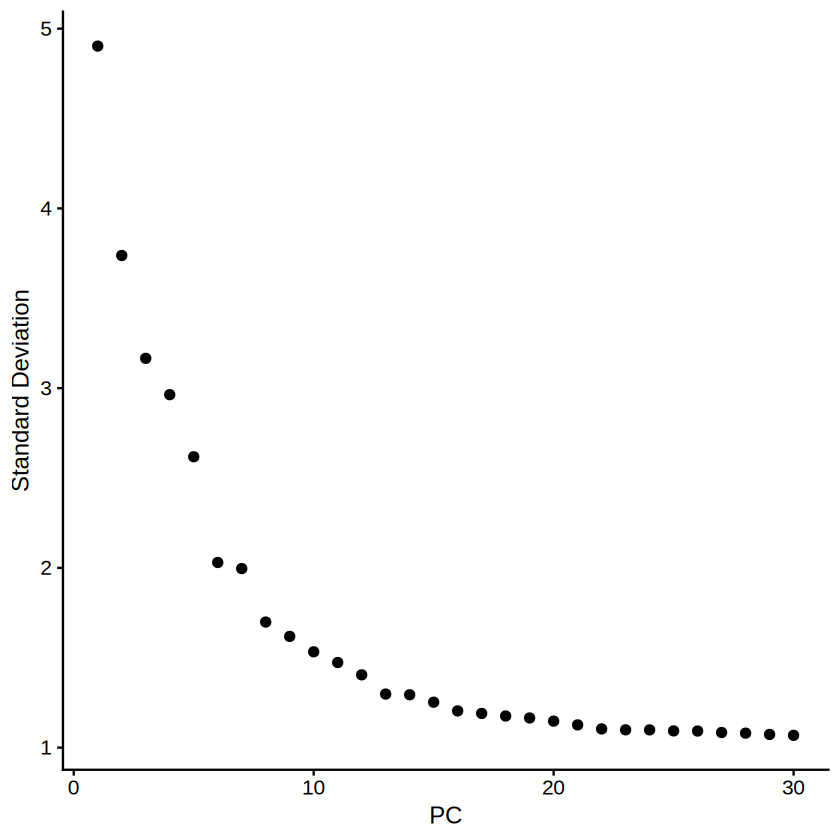

In [23]:
ElbowPlot(
  region_spatial,
  ndims = 30
)

In [24]:
options(repr.plot.width=12, repr.plot.height=12)

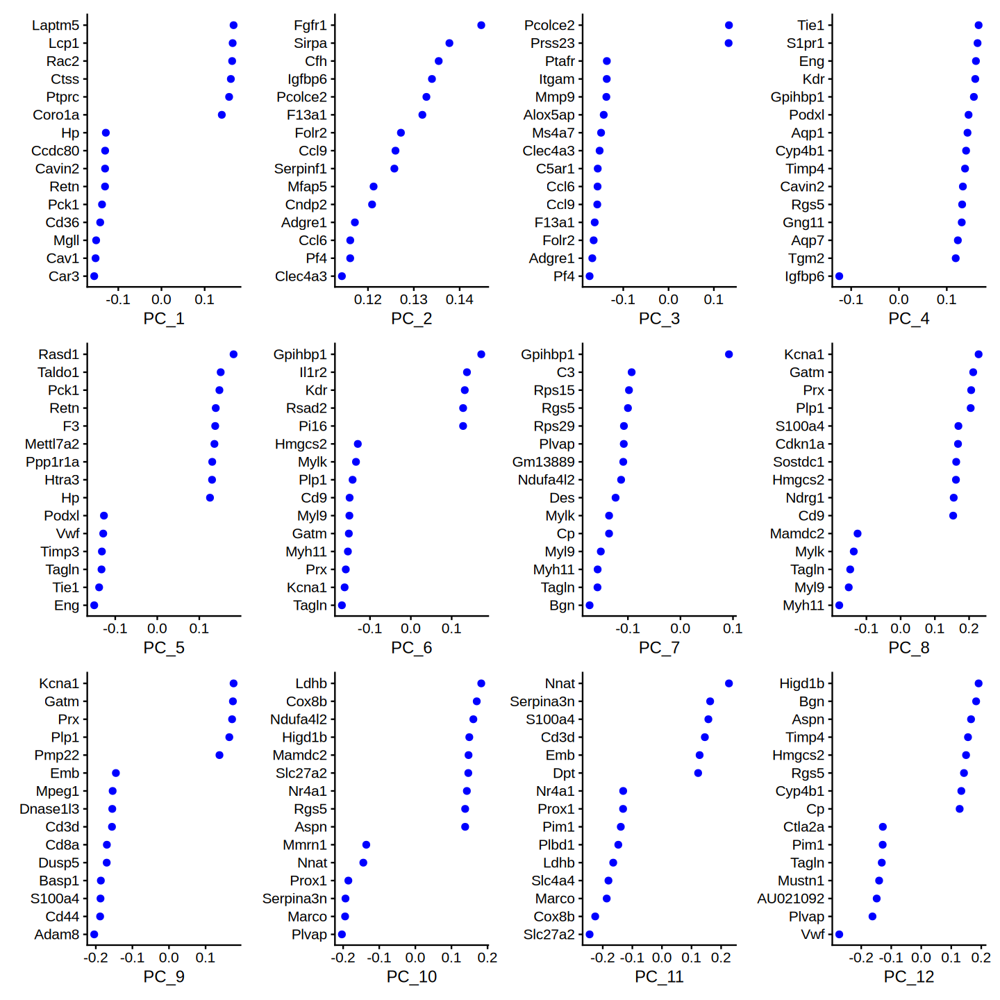

In [25]:
VizDimLoadings(
  region_spatial,
  dims = 1:12,
  reduction = "pca",
  nfeatures = 15
)

- PC1: Laptm5, Ctss, Rac2 versus Dpt, Aqp7, Retn, Cavin2, Cd36, Cav1 — broadly immune versus adipose/stromal structure.
- PC3: Mfap5, Igfbp6, Pcolce2 versus Itgam, Alox5ap, Ms4a7, C5ar1, Folr2, Pf4 — stromal versus myeloid.
- PC4: Eng, Tie1, Podxl, Plvap, Gng11, Kdr with Tagln, Myh11, Myl9 — vascular/endothelial–mural structure.
- PC5: lymphoid/immune genes such as Satb1, Rac2, Cd8a contrasted with macrophage-associated C5ar1, Folr2, Retnla, Pf4.
- PC6/8: very clearly vascular/mural structure, with Kdr, Tie1, Gpihbp1 versus Myh11, Tagln, Myl9.
- PC7: contains Plp1, Prx, Kcna1, which may indicate a peripheral nerve/Schwann-like axis; this will be worth checking spatially.
- PC9/10: appear to represent additional endothelial/lymphatic/immune-stromal distinctions.

In [26]:
pcs <- Embeddings(
  region_spatial,
  reduction = "pca"
)

qc_vars <- c(
  "nCount_Xenium",
  "nFeature_Xenium",
  "cell_area"
)

qc_vars <- qc_vars[
  qc_vars %in% colnames(region_spatial@meta.data)
]

In [27]:
pc_qc_cor <- sapply(
  qc_vars,
  function(v) {
    apply(
      pcs,
      2,
      function(pc) {
        cor(
          pc,
          region_spatial@meta.data[[v]],
          method = "spearman",
          use = "pairwise.complete.obs"
        )
      }
    )
  }
)

round(pc_qc_cor, 3)

,nCount_Xenium,nFeature_Xenium,cell_area
PC_1,0.018,-0.087,-0.528
PC_2,0.614,0.812,0.387
PC_3,0.152,0.120,-0.196
PC_4,0.454,0.520,0.191
PC_5,0.410,0.207,0.297
PC_6,0.038,-0.018,0.020
PC_7,-0.155,-0.037,-0.220
PC_8,0.123,0.099,0.140
PC_9,0.133,0.053,-0.008
PC_10,0.002,0.028,0.024


PC2 could reflect nCount/nFeature, but may be biologically relevant

In [28]:
dims_use <- 1:12

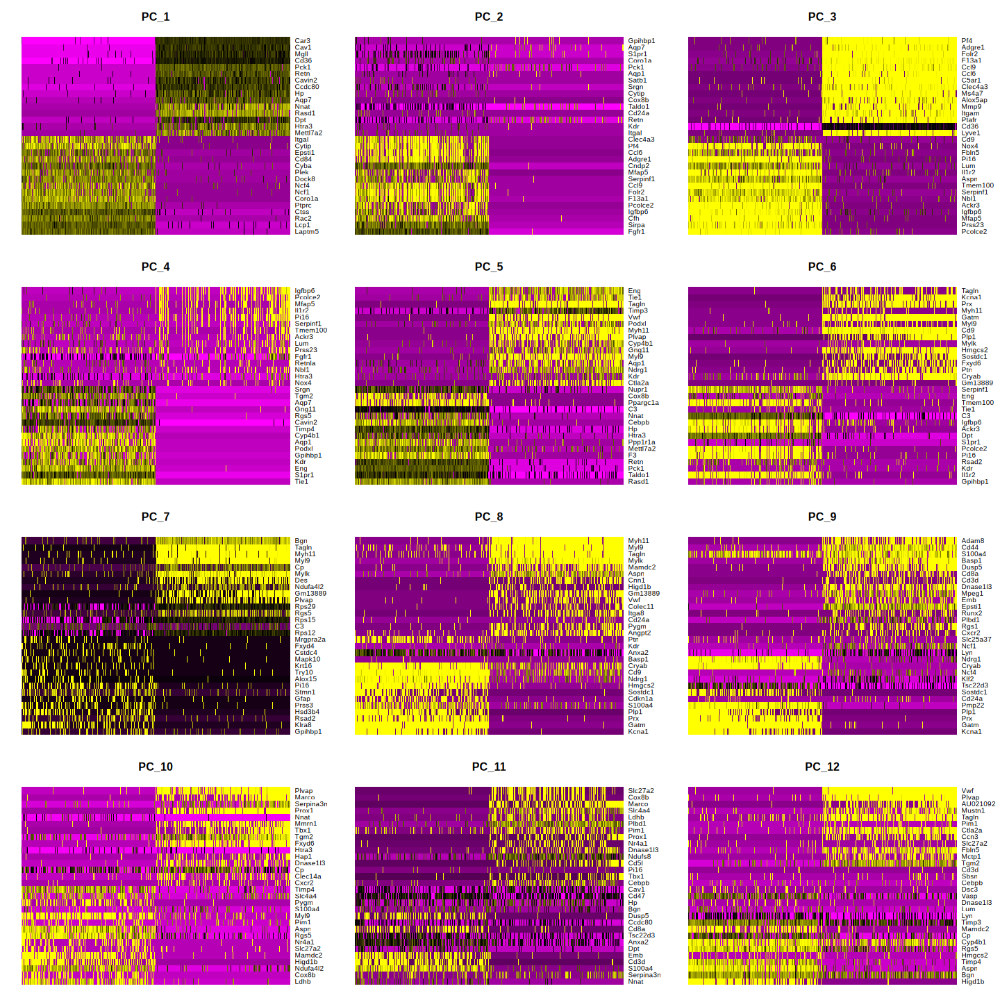

In [29]:
DimHeatmap(
  region_spatial,
  dims = 1:12,
  cells = 1000,
  balanced = TRUE
)

PC1–PC12 are carrying structured, coherent biological programs rather than diffuse noise!

In [30]:
region_spatial <- FindNeighbors(
  region_spatial,
  reduction = "pca",
  dims = dims_use,
  k.param = 20,
  graph.name = c(
    "Xenium_nn_PC12",
    "Xenium_snn_PC12"
  ),
  verbose = FALSE
)

In [31]:
region_spatial <- RunUMAP(
  region_spatial,
  reduction = "pca",
  dims = dims_use,
  reduction.name = "umap_PC12",
  seed.use = 1234,
  verbose = FALSE
)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


In [32]:
resolutions <- c(
  0.7,
  0.8,
  1.0,
  1.2
)

for (res in resolutions) {
  print(res)
  region_spatial <- FindClusters(
    region_spatial,
    graph.name = "Xenium_snn_PC12",
    algorithm = 4,
    resolution = res,
    cluster.name = paste0(
      "cluster_res_",
      gsub("\\.", "_", res)
    ),
    random.seed = 1234,
    verbose = FALSE
  )
}

[1] 0.7
[1] 0.8
[1] 1
[1] 1.2


In [33]:
options(repr.plot.width=12, repr.plot.height=8)

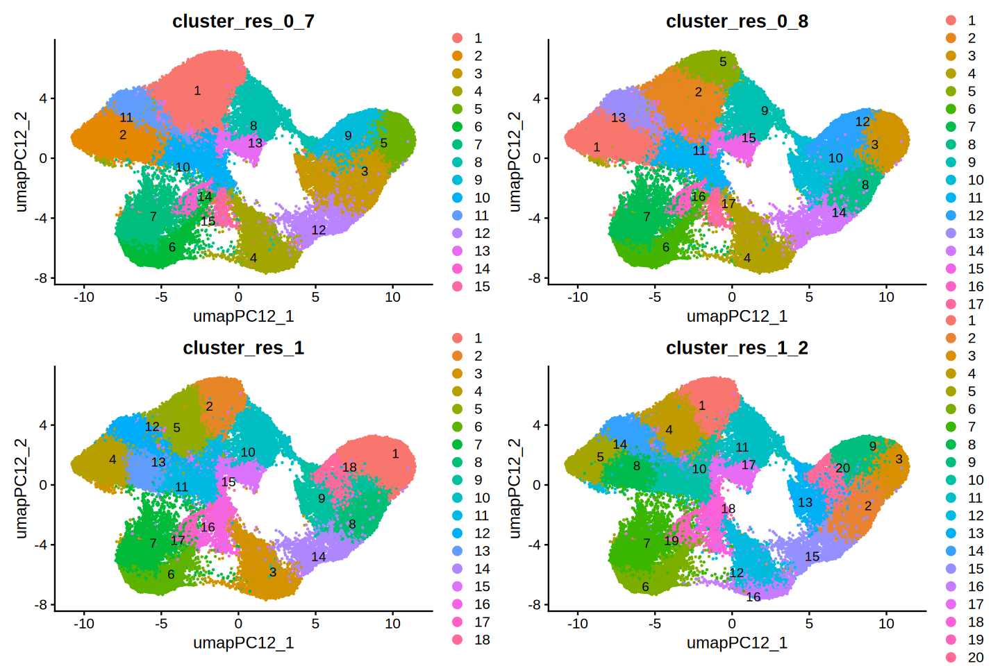

In [34]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = c(
    "cluster_res_0_7",
    "cluster_res_0_8",
    "cluster_res_1",
    "cluster_res_1_2"
  ),
  label = TRUE,
  repel = TRUE,
  ncol = 2
)

In [35]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

### Cell Type Annotataion M1 - By clustering scores

Try resolution 1.2

In [36]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [37]:
marker_df <- tibble::tribble(
  ~Gene_Symbol, ~CellType_main, ~CellType_subtype,

  "Gpihbp1", "Endothelial", "Capillary_EC",
  "Kdr",     "Endothelial", "Capillary_EC",

  "Vwf",     "Endothelial", "Venous_EC",
  "Plvap",   "Endothelial", "Venous_EC",

  "Mmrn1",   "Endothelial", "Lymphatic_EC",
  "Prox1",   "Endothelial", "Lymphatic_EC",
  "Lyve1",   "Endothelial", "Lymphatic_EC",

  "Pck1",    "Adipocyte", "Adipocyte",
  "Retn",    "Adipocyte", "Adipocyte",
  "Aqp7",    "Adipocyte", "Adipocyte",
  "Ppargc1a","Adipocyte", "Adipocyte",
  "Car3",    "Adipocyte", "Adipocyte",
  "Cd36",    "Adipocyte", "Adipocyte",

  "Pi16",    "Stromal_Fibroblast", "ASC",
  "Pcolce2", "Stromal_Fibroblast", "ASC",
  "Mfap5",   "Stromal_Fibroblast", "ASC",

  "Lum",     "Stromal_Fibroblast", "Fibroblast",
  "Serpinf1","Stromal_Fibroblast", "Fibroblast",
  "Bgn",     "Stromal_Fibroblast", "Fibroblast",
  "Dpt",     "Stromal_Fibroblast", "Fibroblast",
  "Aspn",    "Stromal_Fibroblast", "Fibroblast",
  "Ccdc80",  "Stromal_Fibroblast", "Fibroblast",

  "Tagln",   "Mural", "VSMC",
  "Myh11",   "Mural", "VSMC",
  "Cnn1",    "Mural", "VSMC",
  "Itga8",   "Mural", "VSMC",
  "Myl9",    "Mural", "VSMC",
  "Mylk",    "Mural", "VSMC",

  "Rgs5",    "Mural", "Pericyte",
  "Higd1b",  "Mural", "Pericyte",
  "Ndufa4l2","Mural", "Pericyte",
  "Myl9",    "Mural", "Pericyte",
  "Des",     "Mural", "Pericyte",
  "Timp3",   "Mural", "Pericyte",

  "Plp1",    "Neural", "Schwann",
  "Prx",     "Neural", "Schwann",
  "Pmp22",   "Neural", "Schwann",
  "Kcna1",   "Neural", "Schwann",
  "Chl1",    "Neural", "Schwann",

  "Pf4",     "Macrophage", "LYVE_macrophage",
  "Folr2",   "Macrophage", "LYVE_macrophage",
  "F13a1",   "Macrophage", "LYVE_macrophage",
  "C5ar1",   "Macrophage", "LYVE_macrophage",
  "Adgre1",  "Macrophage", "LYVE_macrophage",
  "Retnla",  "Macrophage", "LYVE_macrophage",
  "Lyve1",   "Macrophage", "LYVE_macrophage",
  "Ms4a7",   "Macrophage", "LYVE_macrophage",
  "Ccl6",    "Macrophage", "LYVE_macrophage",

  "Marco",   "Macrophage", "Scavenging_macrophage",
  "Mpeg1",   "Macrophage", "Scavenging_macrophage",
  "Cd5l",    "Macrophage", "Scavenging_macrophage",
  "Ms4a6c",  "Macrophage", "Scavenging_macrophage",
  "Lst1",    "Macrophage", "Scavenging_macrophage",

  "Cebpb",   "Monocyte", "Monocyte",
  "Ctss",    "Monocyte", "Monocyte",
  "Cd300a",  "Monocyte", "Monocyte",
  "Cybb",    "Monocyte", "Monocyte",

  "Csf3r",   "Neutrophil", "Neutrophil",
  "Cxcr2",   "Neutrophil", "Neutrophil",
  "Mmp9",    "Neutrophil", "Neutrophil",
  "Ctsg",    "Neutrophil", "Neutrophil",

  "Mrgpra2a",    "Mast cell", "MC",
  "Il1rl1",  "Mast cell", "MC",
  "Stfa2l1",  "Mast cell", "MC",
  "Cstdc4",  "Mast cell", "MC",
  "Asprv1",  "Mast cell", "MC",

  "Alox15",  "Eosinophil", "Eosinophil",
  "Siglecf", "Eosinophil", "Eosinophil",
  "Ccr3",    "Eosinophil", "Eosinophil",
  "Il5ra",   "Eosinophil", "Eosinophil",
  "Prg2",    "Eosinophil", "Eosinophil",
  "Ear1",    "Eosinophil", "Eosinophil",
  "Ear2",    "Eosinophil", "Eosinophil",

  "Cd3d",    "T cell", "T cell",
  "Cd8a",    "T cell", "T cell",
  "Ctla4",   "T cell", "T cell",
  "Epsti1",  "T cell", "T cell",

  "Itgal",   "NK", "NK",
  "Klra8",   "NK", "NK",

  "Basp1",   "DC", "DC",
  "Cytip",   "DC", "DC",
  "Adam8",   "DC", "DC",
  "Rab8b",   "DC", "DC",
  "Runx2",   "DC", "DC",

  "Plbd1",   "DC", "cDC",
  "Cd24a",   "DC", "cDC",
  "Psmb8",   "DC", "cDC",

    # leave B out as they are not good canonical markers 
  # "Slc25a37", "B cell", "B cell",
  # "Slc4a1", "B cell", "B cell",
  # "Cpa3", "B cell", "B cell",
 
  "Krt19",   "Mesothelial", "Mesothelial",
  "Cav1",    "Mesothelial", "Mesothelial",
  "Igfbp6",  "Mesothelial", "Mesothelial"
)
    
marker_df_use <- marker_df %>%
  filter(Gene_Symbol %in% rownames(region_spatial)) %>%
  distinct(Gene_Symbol, CellType_main, CellType_subtype)

In [38]:
table(marker_df_use$CellType_main)


         Adipocyte                 DC        Endothelial         Eosinophil 
                 6                  8                  7                  7 
        Macrophage          Mast cell        Mesothelial           Monocyte 
                14                  5                  3                  4 
             Mural             Neural         Neutrophil                 NK 
                12                  5                  4                  2 
Stromal_Fibroblast             T cell 
                 9                  4 

In [39]:
marker_coverage <- marker_df %>%
  mutate(Present = Gene_Symbol %in% rownames(region_spatial)) %>%
  group_by(CellType_main, CellType_subtype) %>%
  summarise(
    n_markers = n(),
    n_present = sum(Present),
    coverage = n_present / n_markers,
    genes_present = paste(Gene_Symbol[Present], collapse = ", "),
    .groups = "drop"
  ) %>%
  arrange(CellType_main, CellType_subtype)

marker_coverage

CellType_main,CellType_subtype,n_markers,n_present,coverage,genes_present
<chr>,<chr>,<int>,<int>,<dbl>,<chr>
Adipocyte,Adipocyte,6,6,1,"Pck1, Retn, Aqp7, Ppargc1a, Car3, Cd36"
DC,DC,5,5,1,"Basp1, Cytip, Adam8, Rab8b, Runx2"
DC,cDC,3,3,1,"Plbd1, Cd24a, Psmb8"
Endothelial,Capillary_EC,2,2,1,"Gpihbp1, Kdr"
Endothelial,Lymphatic_EC,3,3,1,"Mmrn1, Prox1, Lyve1"
Endothelial,Venous_EC,2,2,1,"Vwf, Plvap"
Eosinophil,Eosinophil,7,7,1,"Alox15, Siglecf, Ccr3, Il5ra, Prg2, Ear1, Ear2"
Macrophage,LYVE_macrophage,9,9,1,"Pf4, Folr2, F13a1, C5ar1, Adgre1, Retnla, Lyve1, Ms4a7, Ccl6"
Macrophage,Scavenging_macrophage,5,5,1,"Marco, Mpeg1, Cd5l, Ms4a6c, Lst1"


In [40]:
main_result <- score_marker_groups_by_cluster(
  object = region_spatial,
  marker_df = marker_df_use,
  group_col = "CellType_main",
  cluster_col = "cluster_res_1_2",
  assay = "Xenium",
  layer = "data",
  score_prefix = "MainScore",
  detect_prefix = "MainDetect",
  label_prefix = "Main"
)

region_spatial <- main_result$object

subtype_result <- score_marker_groups_by_cluster(
  object = region_spatial,
  marker_df = marker_df_use,
  group_col = "CellType_subtype",
  cluster_col = "cluster_res_1_2",
  assay = "Xenium",
  layer = "data",
  score_prefix = "SubtypeScore",
  detect_prefix = "SubtypeDetect",
  label_prefix = "Subtype"
)

region_spatial <- subtype_result$object

main_result$annotation
subtype_result$annotation

cluster_res_1_2,Main_label,Main_score,Main_second,Main_second_score,Main_margin
<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
1,Adipocyte,0.61976638,Endothelial,0.518197260,0.101569121
2,T.cell,0.74370991,NK,0.569923593,0.173786320
3,NK,0.50301311,Monocyte,0.323886894,0.179126215
4,Adipocyte,0.80005135,Endothelial,0.243584192,0.556467153
5,Adipocyte,1.05124154,Mesothelial,0.239925967,0.811315573
6,Stromal_Fibroblast,1.60443074,Mesothelial,0.548087621,1.056343120
7,Stromal_Fibroblast,1.23053544,Mesothelial,0.659798143,0.570737300
8,Adipocyte,0.89122801,Mesothelial,0.188915872,0.702312137
9,Monocyte,0.14729264,NK,0.141498465,0.005794173


cluster_res_1_2,Subtype_label,Subtype_score,Subtype_second,Subtype_second_score,Subtype_margin
<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
1,Capillary_EC,1.775801605,Adipocyte,0.619766381,1.15603522
2,T.cell,0.743709913,DC,0.670789131,0.07292078
3,cDC,0.621402490,NK,0.503013108,0.11838938
4,Capillary_EC,1.150425632,Adipocyte,0.800051345,0.35037429
5,Adipocyte,1.051241540,Mesothelial,0.239925967,0.81131557
6,ASC,2.497809081,Fibroblast,1.157741571,1.34006751
7,Fibroblast,1.450003820,ASC,0.791598687,0.65840513
8,Adipocyte,0.891228009,Mesothelial,0.188915872,0.70231214
9,cDC,0.200531217,Monocyte,0.147292638,0.05323858


In [41]:
subtype_to_main <- marker_df_use %>%
  transmute(
    CellType_subtype = as.character(CellType_subtype),
    CellType_main = as.character(CellType_main),
    subtype_key = make.names(CellType_subtype)
  ) %>%
  distinct()

xenium_cluster_annotation <- subtype_result$annotation %>%
  mutate(
    subtype_key = make.names(as.character(Subtype_label))
  ) %>%
  rename(
    Xenium_cluster_subtype_score = Subtype_score,
    Xenium_cluster_subtype_second = Subtype_second,
    Xenium_cluster_subtype_second_score = Subtype_second_score,
    Xenium_cluster_subtype_margin = Subtype_margin
  ) %>%
  left_join(
    subtype_to_main,
    by = "subtype_key"
  ) %>%
  mutate(
    Xenium_cluster_subtype = CellType_subtype
  ) %>%
  select(
    -subtype_key,
    -CellType_subtype,
    -Subtype_label
  ) %>%
  rename(
    Xenium_cluster_main = CellType_main
  ) %>%
  left_join(
    main_result$annotation %>%
      transmute(
        cluster_res_1_2,
        Xenium_main_score_label = as.character(Main_label),
        Xenium_main_score = Main_score,
        Xenium_main_second = as.character(Main_second),
        Xenium_main_second_score = Main_second_score,
        Xenium_main_margin = Main_margin
      ),
    by = "cluster_res_1_2"
  )

In [42]:
xenium_cluster_annotation

cluster_res_1_2,Xenium_cluster_subtype_score,Xenium_cluster_subtype_second,Xenium_cluster_subtype_second_score,Xenium_cluster_subtype_margin,Xenium_cluster_main,Xenium_cluster_subtype,Xenium_main_score_label,Xenium_main_score,Xenium_main_second,Xenium_main_second_score,Xenium_main_margin
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>
1,1.775801605,Adipocyte,0.619766381,1.15603522,Endothelial,Capillary_EC,Adipocyte,0.61976638,Endothelial,0.518197260,0.101569121
2,0.743709913,DC,0.670789131,0.07292078,T cell,T cell,T.cell,0.74370991,NK,0.569923593,0.173786320
3,0.621402490,NK,0.503013108,0.11838938,DC,cDC,NK,0.50301311,Monocyte,0.323886894,0.179126215
4,1.150425632,Adipocyte,0.800051345,0.35037429,Endothelial,Capillary_EC,Adipocyte,0.80005135,Endothelial,0.243584192,0.556467153
5,1.051241540,Mesothelial,0.239925967,0.81131557,Adipocyte,Adipocyte,Adipocyte,1.05124154,Mesothelial,0.239925967,0.811315573
6,2.497809081,Fibroblast,1.157741571,1.34006751,Stromal_Fibroblast,ASC,Stromal_Fibroblast,1.60443074,Mesothelial,0.548087621,1.056343120
7,1.450003820,ASC,0.791598687,0.65840513,Stromal_Fibroblast,Fibroblast,Stromal_Fibroblast,1.23053544,Mesothelial,0.659798143,0.570737300
8,0.891228009,Mesothelial,0.188915872,0.70231214,Adipocyte,Adipocyte,Adipocyte,0.89122801,Mesothelial,0.188915872,0.702312137
9,0.200531217,Monocyte,0.147292638,0.05323858,DC,cDC,Monocyte,0.14729264,NK,0.141498465,0.005794173


In [43]:
# Safely attach cluster-level Xenium evidence to every cell.
# Remove prior versions of these columns before joining.

xenium_cols <- setdiff(
  colnames(xenium_cluster_annotation),
  "cluster_res_1_2"
)

region_spatial@meta.data <- region_spatial@meta.data %>%
  select(-any_of(xenium_cols))

meta_tmp <- region_spatial@meta.data %>%
  rownames_to_column("seurat_cell") %>%
  mutate(cluster_res_1_2 = as.character(cluster_res_1_2)) %>%
  left_join(
    xenium_cluster_annotation %>%
      mutate(cluster_res_1_2 = as.character(cluster_res_1_2)),
    by = "cluster_res_1_2"
  ) %>%
  column_to_rownames("seurat_cell")

stopifnot(
  identical(rownames(meta_tmp), colnames(region_spatial))
)

region_spatial@meta.data <- meta_tmp

In [44]:
colnames(region_spatial@meta.data )

[1] "orig.ident"                               
  [2] "nCount_Xenium"                            
  [3] "nFeature_Xenium"                          
  [4] "cell_id"                                  
  [5] "x_centroid"                               
  [6] "y_centroid"                               
  [7] "transcript_counts"                        
  [8] "control_probe_counts"                     
  [9] "genomic_control_counts"                   
 [10] "control_codeword_counts"                  
 [11] "unassigned_codeword_counts"               
 [12] "deprecated_codeword_counts"               
 [13] "total_counts"                             
 [14] "cell_area"                                
 [15] "nucleus_area"                             
 [16] "nucleus_count"                            
 [17] "segmentation_method"                      
 [18] "region_id"                                
 [19] "control_fraction_cell"                    
 [20] "nucleus_missing_flag"                     
 [21] "multiple_nuclei_flag"                     
 [22] "cell_area_outlier_flag"                   
 [23] "high_control_flag"                        
 [24] "segmentation_multiplet_flag"              
 [25] "qc_core_pass"                             
 [26] "qc_review_flag"                           
 [27] "mouse_id"                                 
 [28] "section_id"                               
 [29] "biological_replicate_id"                  
 [30] "genotype"                                 
 [31] "treatment"                                
 [32] "condition"                                
 [33] "age_weeks"                                
 [34] "metadata_status"                          
 [35] "do_not_interpret"                         
 [36] "grid_x"                                   
 [37] "grid_y"                                   
 [38] "grid_id"                                  
 [39] "edge_proxy"                               
 [40] "grid_size_um"                             
 [41] "local_density"                            
 [42] "dense_aggregate"                          
 [43] "primary_include"                          
 [44] "strict_include"                           
 [45] "hotspot_review_cell"                      
 [46] "hotspot_sensitivity_include"              
 [47] "section_status"                           
 [48] "mask_rule_primary"                        
 [49] "mask_rule_strict"                         
 [50] "mask_rule_hotspot_sensitivity"            
 [51] "provenance"                               
 [52] "run_label"                                
 [53] "execution_mode"                           
 [54] "generated_utc"                            
 [55] "source_artifact"                          
 [56] "section_input_cells"                      
 [57] "section_primary_include_cells"            
 [58] "section_strict_include_cells"             
 [59] "section_hotspot_sensitivity_include_cells"
 [60] "qc_threshold_source"                      
 [61] "cluster_res_0_7"                          
 [62] "seurat_clusters"                          
 [63] "cluster_res_0_8"                          
 [64] "cluster_res_1"                            
 [65] "cluster_res_1_2"                          
 [66] "MainScore_Endothelial"                    
 [67] "MainScore_Adipocyte"                      
 [68] "MainScore_Stromal_Fibroblast"             
 [69] "MainScore_Mural"                          
 [70] "MainScore_Neural"                         
 [71] "MainScore_Macrophage"                     
 [72] "MainScore_Monocyte"                       
 [73] "MainScore_Neutrophil"                     
 [74] "MainScore_Mast.cell"                      
 [75] "MainScore_Eosinophil"                     
 [76] "MainScore_T.cell"                         
 [77] "MainScore_NK"                             
 [78] "MainScore_DC"                             
 [79] "MainScore_Mesothelial"                    
 [80] "MainDetect_Endothelial"                   
 [

In [45]:
options(repr.plot.width=16, repr.plot.height=6)

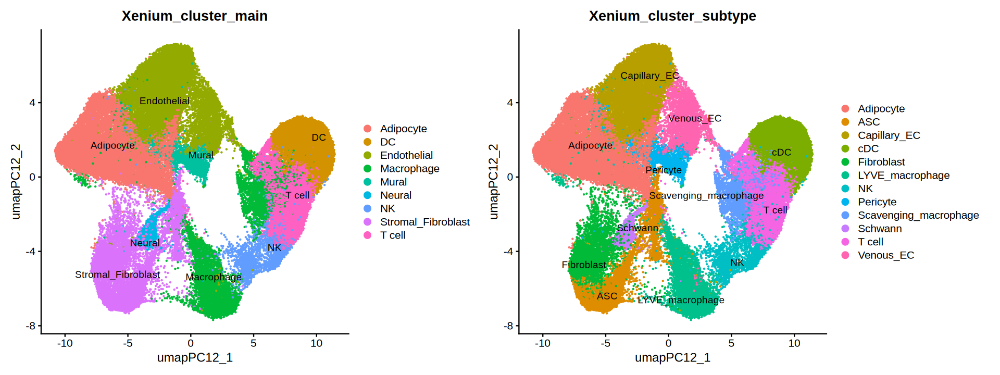

In [46]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = c("Xenium_cluster_main", "Xenium_cluster_subtype"),
  label = TRUE,
  repel = TRUE
)

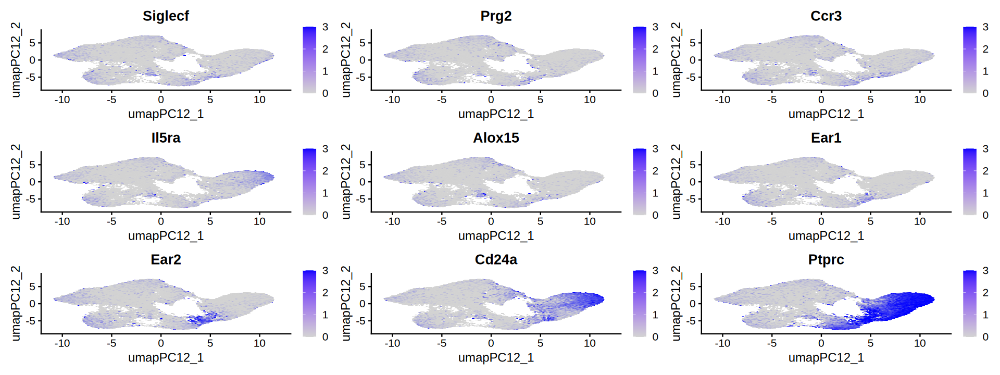

In [47]:
FeaturePlot(
    region_spatial,
    features = c(
        "Siglecf", "Prg2", "Ccr3",
        "Il5ra", "Alox15",
        "Ear1", "Ear2", "Cd24a", "Ptprc"
    ),
    reduction = "umap_PC12",
    raster = TRUE, 
    pt.size = 3, 
    max.cutoff = 3
)

In [48]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

### Cell Type Annotation M2 - By Reference

In [49]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [50]:
WANG_REFERENCE_PATH <- file.path(
  "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Data/External_Data",
  "Wang_Science2025_mouse_human",
  "analysis_mouse",
  "Wang_Science2025_cleaned_seurat.rds"
)

In [52]:
scwat_ref <- readRDS(WANG_REFERENCE_PATH)
DefaultAssay(scwat_ref) <- "RNA"

cat("Reference conditions:\n")
print(table(scwat_ref$Condition))

Reference conditions:

2.5 months  12 months 
     19252      21686 


In [53]:
scwat_ref$Wang_subtype_original <- as.character(
  scwat_ref$CellType_subtype
)

sort(unique(scwat_ref$Wang_subtype_original))

[1] "Arterial_EC"                "ASC"                       
 [3] "B"                          "Capillary_EC"              
 [5] "CCR2_inflammatory_Monocyte" "CCR7_migratory_DC"         
 [7] "cDC1"                       "cDC2"                      
 [9] "CP-1"                       "CP-2"                      
[11] "CP-A"                       "CX3CR1_Monocyte"           
[13] "Eosinophil"                 "Epithelial"                
[15] "IAP"                        "ILC2"                      
[17] "Inflammatory_Mac"           "LYVE1_resident_Mac"        
[19] "Mast cell"                  "MatureAdip"                
[21] "Mesothelial"                "Neutrophil"                
[23] "NK"                         "Pericyte"                  
[25] "Plasma"                     "RegFibro"                  
[27] "T"                          "TREM2_LAM"                 
[29] "γδ T"

In [54]:
# Explicit Wang subtype harmonization.
# Detailed immune labels are preserved.
# Closely related non-immune states are harmonized only for broad-lineage transfer.

wang_subtype_harmonization <- c(
  "ASC" = "ASC",
  "IAP" = "APC",
  "CP-1" = "APC",
  "CP-A" = "APC",
  "CP-2" = "APC",
  "RegFibro" = "APC",
  "MatureAdip" = "Adipocyte",
  "Pericyte" = "Mural",
  "Arterial_EC" = "Endothelial",
  "Capillary_EC" = "Endothelial",
  "Epithelial" = "Epithelial",
  "Mesothelial" = "Mesothelial",
  "T" = "T",
  "γδ T" = "γδ T",
  "NK" = "NK",
  "ILC2" = "ILC2",
  "B" = "B",
  "Plasma" = "Plasma",
  "CCR2_inflammatory_Monocyte" = "CCR2_inflammatory_Monocyte",
  "CX3CR1_Monocyte" = "CX3CR1_Monocyte",
  "Inflammatory_Mac" = "Inflammatory_Mac",
  "LYVE1_resident_Mac" = "LYVE1_resident_Mac",
  "TREM2_LAM" = "TREM2_LAM",
  "IFN_response_myeloid" = "IFN_response_myeloid",
  "cDC1" = "cDC1",
  "cDC2" = "cDC2",
  "CCR7_migratory_DC" = "CCR7_migratory_DC",
  "Neutrophil" = "Neutrophil",
  "Eosinophil" = "Eosinophil",
  "Mast cell" = "Mast cell"
)

unexpected_wang_labels <- setdiff(
  unique(scwat_ref$Wang_subtype_original),
  names(wang_subtype_harmonization)
)

if (length(unexpected_wang_labels)) {
  stop(
    "Unexpected Wang subtype labels. Review before proceeding: ",
    paste(unexpected_wang_labels, collapse = ", ")
  )
}

scwat_ref$Wang_subtype_harmonized <- unname(
  wang_subtype_harmonization[
    scwat_ref$Wang_subtype_original
  ]
)


In [55]:
scwat_ref$Wang_main <- case_when(
  scwat_ref$Wang_subtype_harmonized %in% c("ASC", "APC") ~ "Stromal_Fibroblast",
  scwat_ref$Wang_subtype_harmonized == "Mural" ~ "Mural",
  scwat_ref$Wang_subtype_harmonized == "Adipocyte" ~ "Adipocyte",
  scwat_ref$Wang_subtype_harmonized == "Endothelial" ~ "Endothelial",
  scwat_ref$Wang_subtype_harmonized == "Epithelial" ~ "Epithelial",
  scwat_ref$Wang_subtype_harmonized == "Mesothelial" ~ "Mesothelial",

  scwat_ref$Wang_subtype_harmonized %in% c("T", "γδ T") ~ "T cell",
  scwat_ref$Wang_subtype_harmonized == "NK" ~ "NK",
  scwat_ref$Wang_subtype_harmonized == "ILC2" ~ "ILC",
  scwat_ref$Wang_subtype_harmonized == "B" ~ "B cell",
  scwat_ref$Wang_subtype_harmonized == "Plasma" ~ "Plasma",

  scwat_ref$Wang_subtype_harmonized %in%
    c("CCR2_inflammatory_Monocyte", "CX3CR1_Monocyte") ~ "Monocyte",

  scwat_ref$Wang_subtype_harmonized %in%
    c("Inflammatory_Mac", "LYVE1_resident_Mac", "TREM2_LAM") ~ "Macrophage",

  scwat_ref$Wang_subtype_harmonized == "IFN_response_myeloid" ~ "Myeloid",

  scwat_ref$Wang_subtype_harmonized %in%
    c("cDC1", "cDC2", "CCR7_migratory_DC") ~ "DC",

  scwat_ref$Wang_subtype_harmonized == "Neutrophil" ~ "Neutrophil",
  scwat_ref$Wang_subtype_harmonized == "Eosinophil" ~ "Eosinophil",
  scwat_ref$Wang_subtype_harmonized == "Mast cell" ~ "Mast cell",

  TRUE ~ NA_character_
)

if (anyNA(scwat_ref$Wang_main)) {
  stop("Some Wang cells could not be mapped to the broad ontology.")
}

table(
  scwat_ref$Wang_main,
  scwat_ref$Wang_subtype_harmonized
)


                    
                     Adipocyte   APC   ASC     B CCR2_inflammatory_Monocyte
  Adipocyte                 40     0     0     0                          0
  B cell                     0     0     0  1241                          0
  DC                         0     0     0     0                          0
  Endothelial                0     0     0     0                          0
  Eosinophil                 0     0     0     0                          0
  Epithelial                 0     0     0     0                          0
  ILC                        0     0     0     0                          0
  Macrophage                 0     0     0     0                          0
  Mast cell                  0     0     0     0                          0
  Mesothelial                0     0     0     0                          0
  Monocyte                   0     0     0     0                       1256
  Mural                      0     0     0     0                   

In [56]:
# saveRDS(scwat_ref,WANG_REFERENCE_PATH)

In [57]:
annotation_genes <- Reduce(
  intersect,
  list(
    FIX_GENESET,
    rownames(scwat_ref),
    rownames(region_spatial)
  )
)

cat("Annotation features:", length(annotation_genes), "\n")

if (length(annotation_genes) < 100) {
  stop("Too few shared identity genes for reliable transfer; review gene symbols/panel.")
}

# # Confirm short-/long-lived Eos state genes are excluded.
# stopifnot(
#   length(intersect(annotation_genes, eos_state_genes)) == 0
# )

Annotation features: 467 


In [58]:
run_wang_transfer <- function(
  reference,
  query,
  annotation_genes,
  main_col = "Wang_main",
  subtype_col = "Wang_subtype_harmonized",
  prefix
) {

  DefaultAssay(reference) <- "RNA"

  # Restrict features to genes present in BOTH objects
  features_use <- Reduce(
    intersect,
    list(
      annotation_genes,
      rownames(reference),
      rownames(query)
    )
  )

  message(
    prefix,
    ": using ",
    length(features_use),
    " shared annotation genes"
  )

  reference <- NormalizeData(
    reference,
    assay = "RNA",
    verbose = FALSE
  )

  reference <- ScaleData(
    reference,
    assay = "RNA",
    features = features_use,
    verbose = FALSE
  )

  reference <- RunPCA(
    reference,
    assay = "RNA",
    features = features_use,
    npcs = 30,
    seed.use = 1234,
    verbose = FALSE
  )

  anchors <- FindTransferAnchors(
    reference = reference,
    query = query,
    reference.assay = "RNA",
    query.assay = "Xenium",
    normalization.method = "LogNormalize",
    reduction = "pcaproject",
    features = features_use,
    dims = 1:30,
    verbose = FALSE
  )

  pred_main <- TransferData(
    anchorset = anchors,
    refdata = reference[[main_col]][, 1],
    dims = 1:30,
    verbose = FALSE
  )

  pred_subtype <- TransferData(
    anchorset = anchors,
    refdata = reference[[subtype_col]][, 1],
    dims = 1:30,
    verbose = FALSE
  )

  # Rename output columns so 2.5m / 12m / all can coexist
  colnames(pred_main) <- paste0(
    prefix,
    "_main_",
    colnames(pred_main)
  )

  colnames(pred_subtype) <- paste0(
    prefix,
    "_subtype_",
    colnames(pred_subtype)
  )

  list(
    main = pred_main,
    subtype = pred_subtype,
    anchors = anchors,
    features = features_use
  )
}

In [59]:
ref_2p5 <- subset(
  scwat_ref,
  subset = Condition == "2.5 months"
)

ref_12 <- subset(
  scwat_ref,
  subset = Condition == "12 months"
)

ref_all <- scwat_ref

In [60]:
table(
  ref_2p5$Wang_subtype_harmonized
)

table(
  ref_12$Wang_subtype_harmonized
)

table(
  ref_all$Wang_subtype_harmonized
)


                 Adipocyte                        APC 
                        31                       6125 
                       ASC                          B 
                      1524                        715 
CCR2_inflammatory_Monocyte          CCR7_migratory_DC 
                       653                         39 
                      cDC1                       cDC2 
                       465                        158 
           CX3CR1_Monocyte                Endothelial 
                       181                        917 
                Eosinophil                 Epithelial 
                        19                        413 
                      ILC2           Inflammatory_Mac 
                       473                        357 
        LYVE1_resident_Mac                  Mast cell 
                      3200                         28 
               Mesothelial                      Mural 
                       550                        827 
         


                 Adipocyte                        APC 
                         9                       8115 
                       ASC                          B 
                      4525                        526 
CCR2_inflammatory_Monocyte          CCR7_migratory_DC 
                       603                         74 
                      cDC1                       cDC2 
                       380                         89 
           CX3CR1_Monocyte                Endothelial 
                       389                        402 
                Eosinophil                 Epithelial 
                       161                        212 
                      ILC2           Inflammatory_Mac 
                       278                        271 
        LYVE1_resident_Mac                  Mast cell 
                      1892                         24 
               Mesothelial                      Mural 
                      1306                        801 
         


                 Adipocyte                        APC 
                        40                      14240 
                       ASC                          B 
                      6049                       1241 
CCR2_inflammatory_Monocyte          CCR7_migratory_DC 
                      1256                        113 
                      cDC1                       cDC2 
                       845                        247 
           CX3CR1_Monocyte                Endothelial 
                       570                       1319 
                Eosinophil                 Epithelial 
                       180                        625 
                      ILC2           Inflammatory_Mac 
                       751                        628 
        LYVE1_resident_Mac                  Mast cell 
                      5092                         52 
               Mesothelial                      Mural 
                      1856                       1628 
         

In [61]:
length(annotation_genes)

[1] 467

In [62]:
transfer_2p5 <- run_wang_transfer(
  reference = ref_2p5,
  query = region_spatial,
  annotation_genes = annotation_genes,
  prefix = "Ref2p5"
)

transfer_12 <- run_wang_transfer(
  reference = ref_12,
  query = region_spatial,
  annotation_genes = annotation_genes,
  prefix = "Ref12"
)

transfer_all <- run_wang_transfer(
  reference = ref_all,
  query = region_spatial,
  annotation_genes = annotation_genes,
  prefix = "RefAll"
)

Ref2p5: using 467 shared annotation genes

Warning message:
“Number of dimensions changing from 50 to 30”
Ref12: using 467 shared annotation genes

Warning message:
“Number of dimensions changing from 50 to 30”
RefAll: using 467 shared annotation genes

Warning message:
“Number of dimensions changing from 50 to 30”


In [63]:
region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_2p5$main
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_2p5$subtype
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_12$main
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_12$subtype
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_all$main
)

region_spatial <- AddMetaData(
  region_spatial,
  metadata = transfer_all$subtype
)

In [64]:
table(
  region_spatial$RefAll_subtype_predicted.id
)


                 Adipocyte                        APC 
                     14315                       8461 
                       ASC                          B 
                      3562                      10326 
CCR2_inflammatory_Monocyte          CCR7_migratory_DC 
                       722                        524 
                      cDC1                       cDC2 
                      1251                       2699 
           CX3CR1_Monocyte                Endothelial 
                       939                      14928 
                Eosinophil                 Epithelial 
                        58                        331 
                      ILC2           Inflammatory_Mac 
                        70                        122 
        LYVE1_resident_Mac                  Mast cell 
                      6244                         66 
               Mesothelial                      Mural 
                      1086                       3508 
         

In [65]:
options(repr.plot.width=15, repr.plot.height=15)

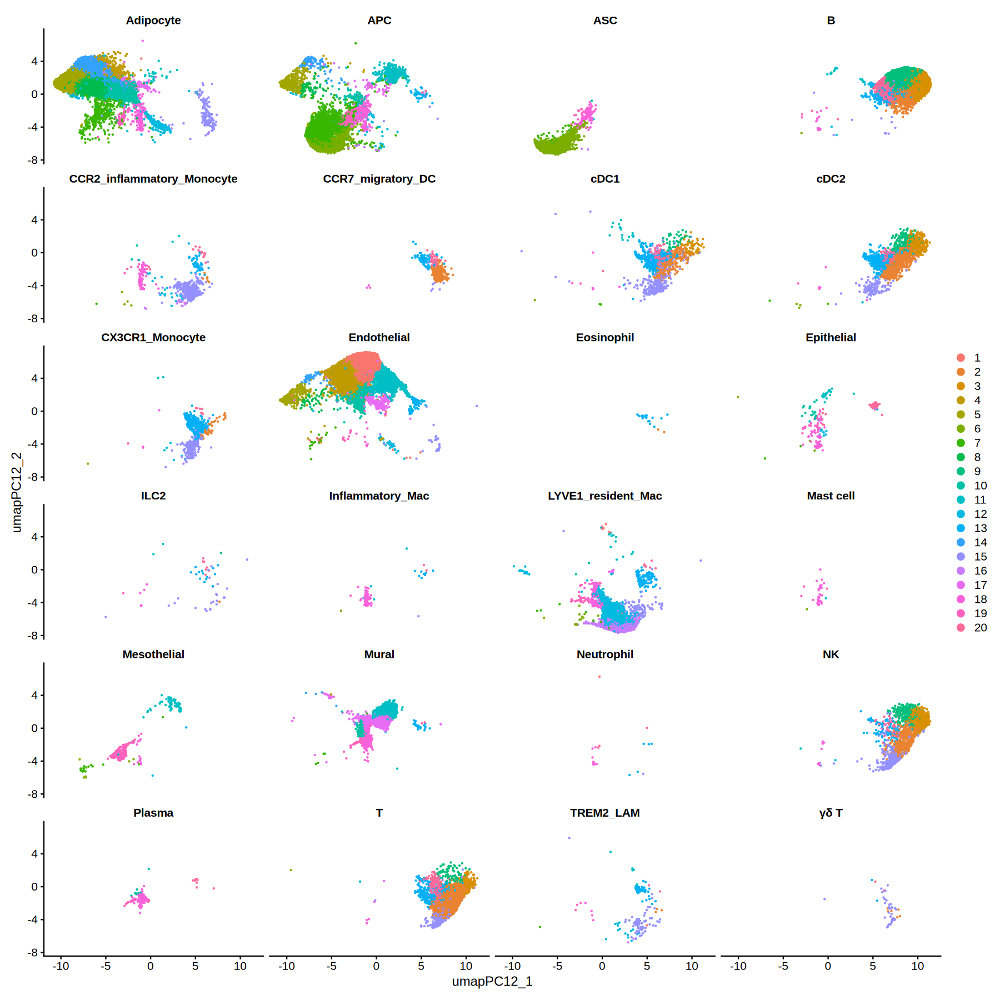

In [66]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  split.by = "Ref2p5_subtype_predicted.id",
  ncol=4
)

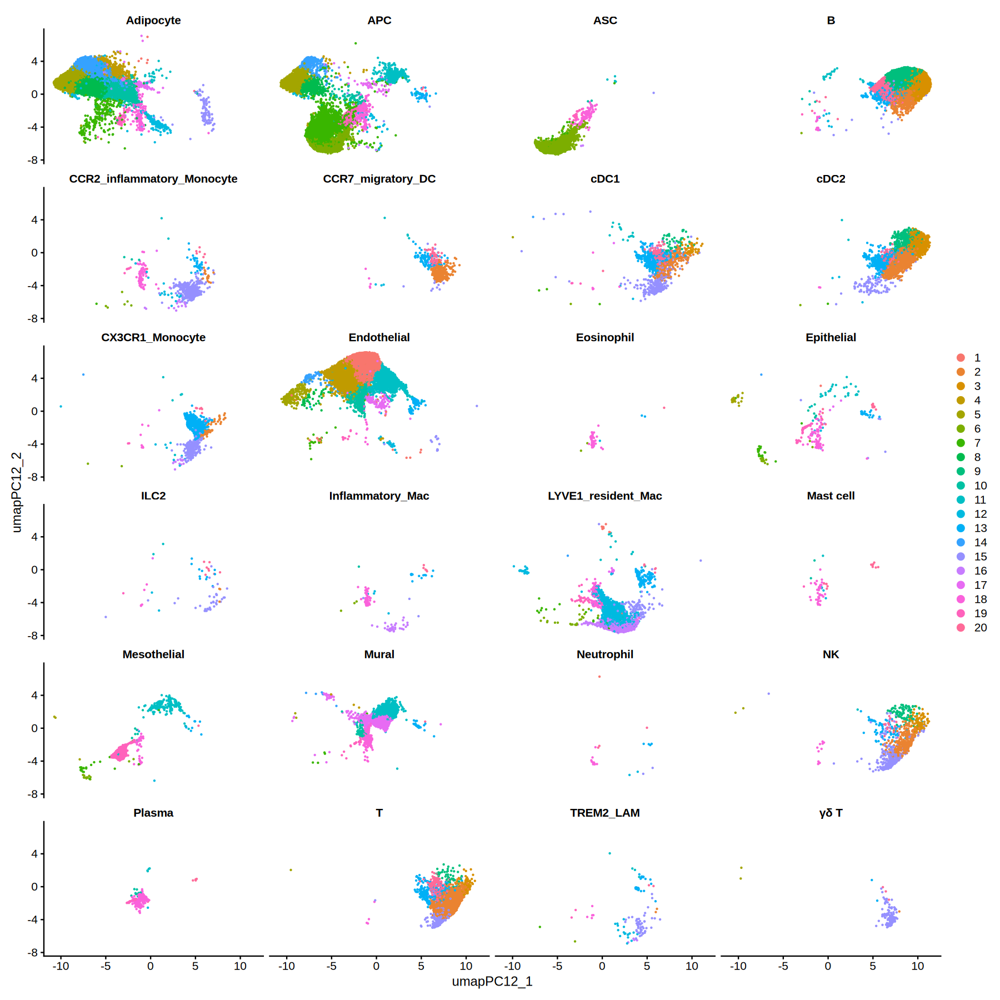

In [67]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  split.by = "RefAll_subtype_predicted.id",
  ncol=4
)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


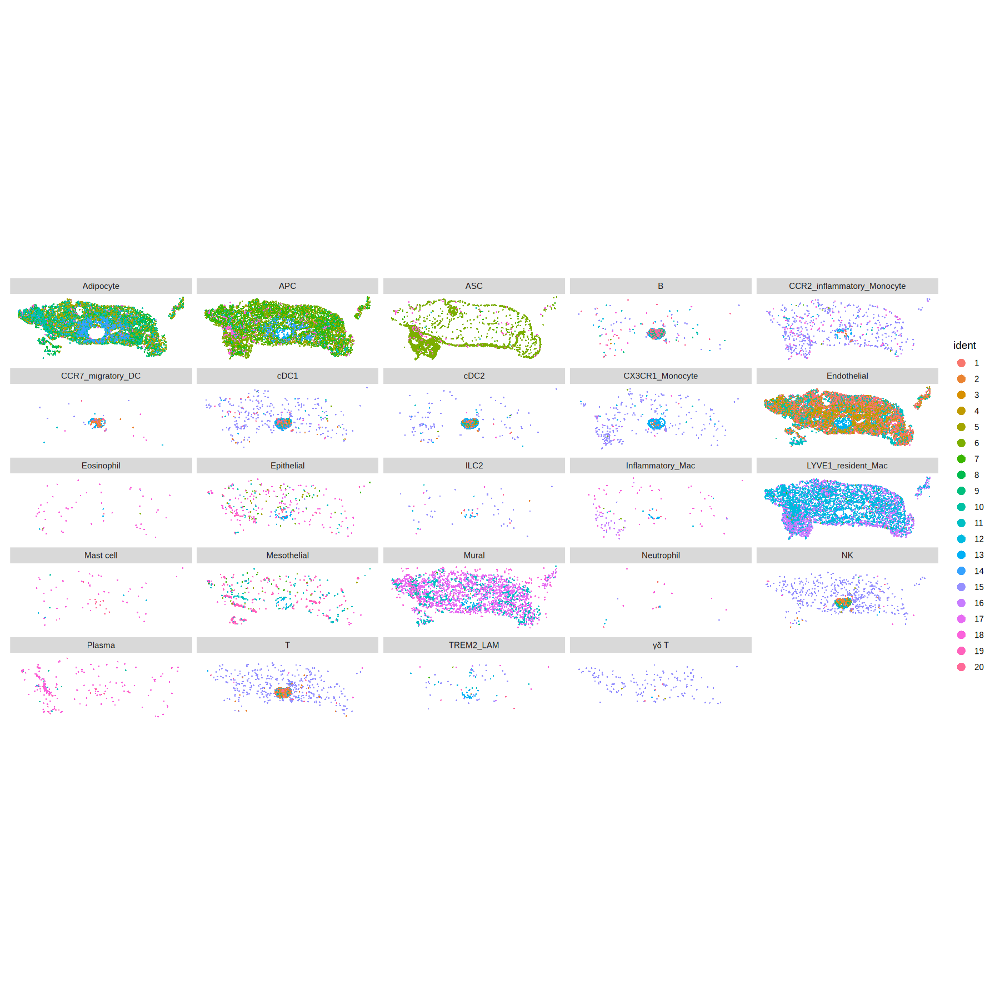

In [68]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
  split.by = "RefAll_subtype_predicted.id",
  flip_xy = FALSE,
  dark.background = FALSE
)

In [69]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [76]:
options(repr.plot.width=15, repr.plot.height=10)

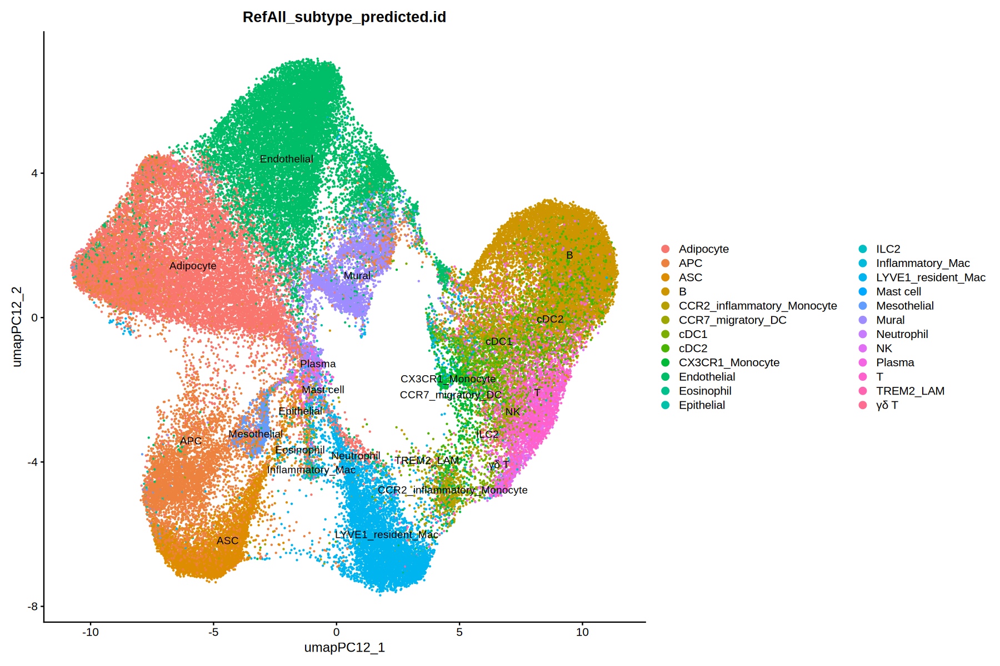

In [77]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = c("RefAll_subtype_predicted.id"),
  label = TRUE,
  repel = TRUE
)

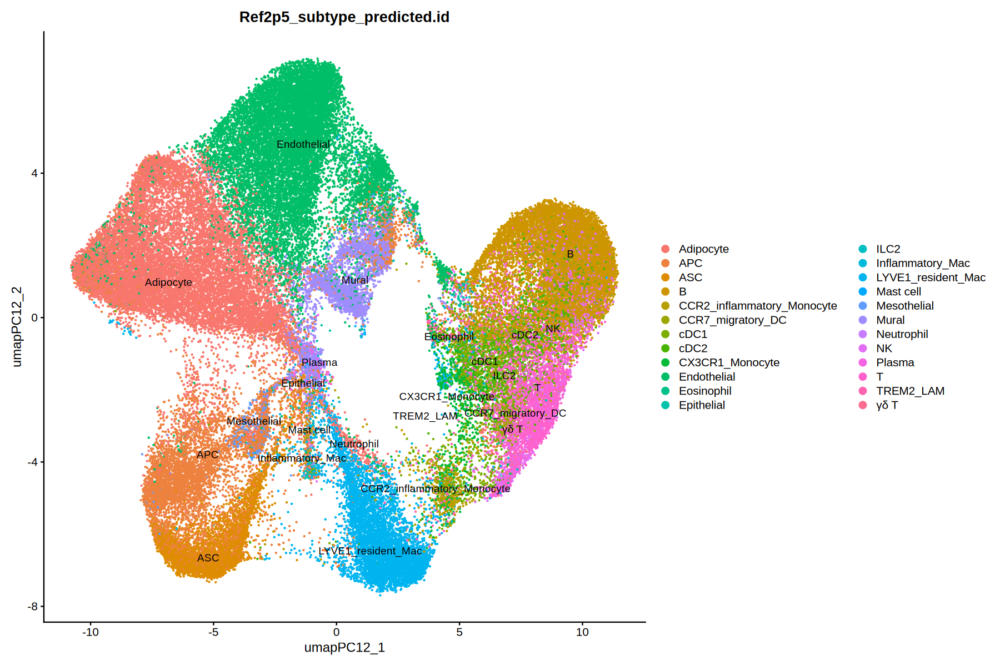

In [78]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = c("Ref2p5_subtype_predicted.id"),
  label = TRUE,
  repel = TRUE
)

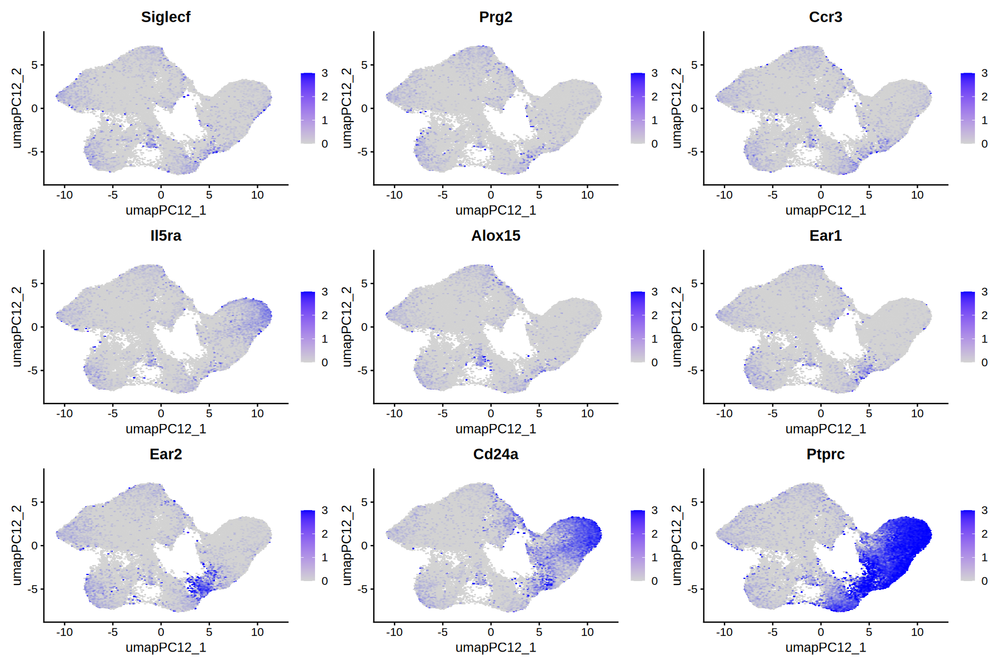

In [79]:
FeaturePlot(
    region_spatial,
    features = c(
        "Siglecf", "Prg2", "Ccr3",
        "Il5ra", "Alox15",
        "Ear1", "Ear2", "Cd24a", "Ptprc"
    ),
    reduction = "umap_PC12",
    raster = TRUE, 
    pt.size = 3, 
    max.cutoff = 3
)

### Refine cell types

In [82]:
annotation_result <- refine_xenium_celltypes(
  object = region_spatial,
  reduction = "pca",
  dims = 1:12,
  k = 15,
  self_weight = 0.70
)

region_spatial <- annotation_result$object

Building transcriptomic kNN: k = 15, reduction = pca, dims = 1:12

Annotation complete.

Review cells: 21074 / 74364 (28.34%)

Schwann ontology-gap rescue: 1077

Lymphatic EC ontology-gap rescue: 0



In [83]:
annotation_result$summary[annotation_result$summary$Final_CellType_subtype=='Eosinophil',]

,Final_CellType_main,Final_CellType_subtype,Final_annotation_source,Final_annotation_confidence,Final_review_flag,n_cells
,<chr>,<chr>,<chr>,<chr>,<lgl>,<int>
19,Eosinophil,Eosinophil,Wang_RefAll_immune,REFERENCE_PRIMARY,FALSE,27
20,Eosinophil,Eosinophil,Wang_RefAll_immune,HIGH_CONCORDANT,FALSE,11
21,Eosinophil,Eosinophil,Wang_RefAll_immune,REVIEW,TRUE,1


In [84]:
table(
  region_spatial$Final_CellType_main[region_spatial$Final_annotation_confidence=="REVIEW"],
  useNA = "ifany"
)

table(
  region_spatial$Final_CellType_subtype[region_spatial$Final_annotation_confidence=="REVIEW"],
  useNA = "ifany"
)

table(
  region_spatial$Final_annotation_confidence
)

table(
  region_spatial$Final_review_flag
)


         Adipocyte             B cell                 DC        Endothelial 
              1638                238                177              11558 
        Eosinophil         Epithelial                ILC         Macrophage 
                 1                198                  1                138 
         Mast cell        Mesothelial           Monocyte              Mural 
                 2                293                 58                772 
                NK             Plasma Stromal_Fibroblast             T cell 
                 5                 12               5944                 39 


                 Adipocyte                        APC 
                      1638                       5747 
                       ASC                          B 
                       197                        238 
              Capillary_EC CCR2_inflammatory_Monocyte 
                     10175                         13 
         CCR7_migratory_DC                       cDC1 
                        18                         83 
                      cDC2            CX3CR1_Monocyte 
                        76                         45 
                Eosinophil                 Epithelial 
                         1                        198 
                      ILC2           Inflammatory_Mac 
                         1                         10 
              Lymphatic_EC         LYVE1_resident_Mac 
                       388                        109 
                 Mast cell                Mesothelial 
                         2                        293 
         


       HIGH_CONCORDANT ONTOLOGY_GAP_SUPPORTED      REFERENCE_PRIMARY 
                 34735                   1077                  17478 
                REVIEW 
                 21074 


FALSE  TRUE 
53290 21074 

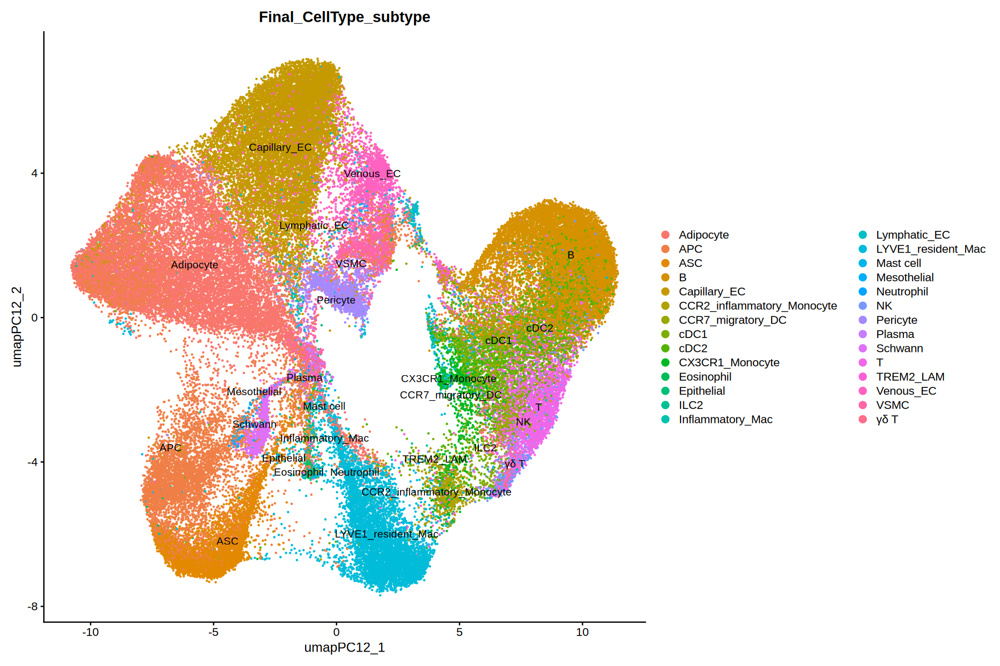

In [85]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = c("Final_CellType_subtype"),
  label = TRUE,
  repel = TRUE
)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


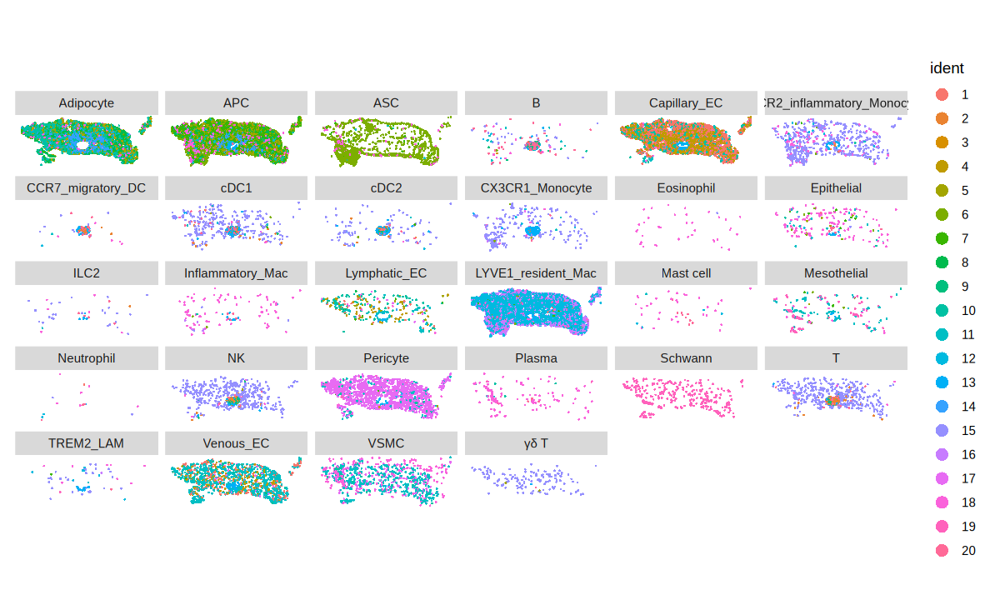

In [102]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
  split.by = "Final_CellType_subtype",
  flip_xy = FALSE,
  dark.background = FALSE
)

In [18]:
options(repr.plot.width=23, repr.plot.height=5)

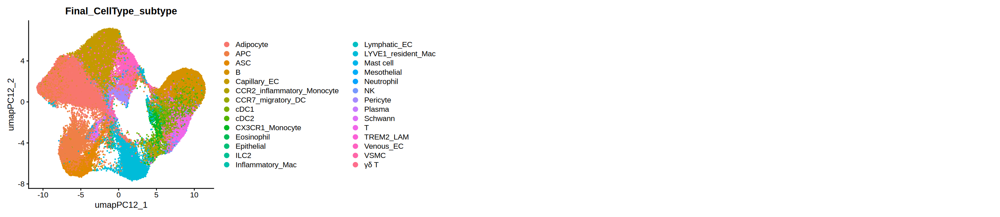

In [19]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = "Final_CellType_subtype",
  ncol=4
)

In [32]:
options(repr.plot.width=20, repr.plot.height=20)

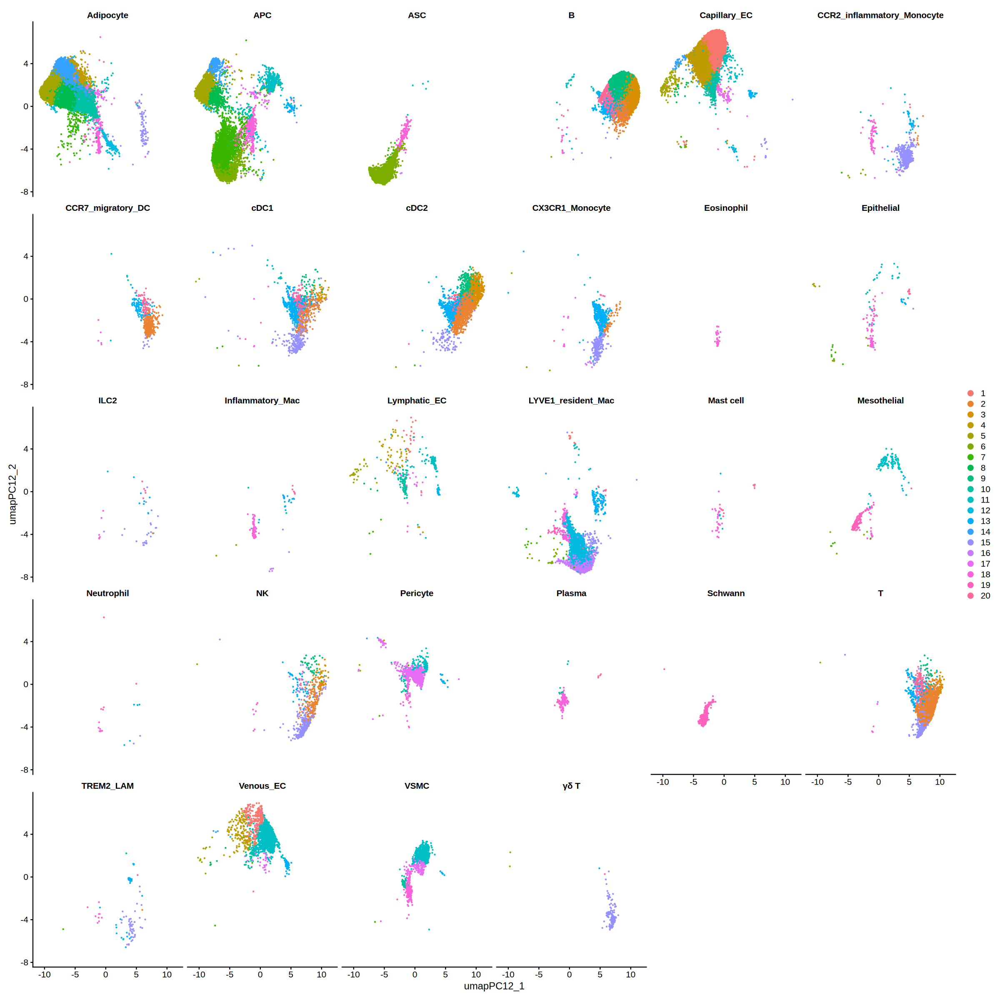

In [33]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  split.by = "Final_CellType_subtype",
  ncol=6
)

In [88]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [6]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [98]:
length(rownames(region_spatial@meta.data)[region_spatial@meta.data$Final_CellType_subtype == "Eosinophil"])

[1] 39

In [34]:
dim(region_spatial)

[1]   479 74364

In [35]:
74364*0.119

[1] 8849.316

In [38]:
WANG_REFERENCE_PATH <- file.path(
  "/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Data/External_Data",
  "Wang_Science2025_mouse_human",
  "analysis_mouse",
  "Wang_Science2025_cleaned_seurat.rds"
)

In [39]:
scwat_ref <- readRDS(WANG_REFERENCE_PATH)

In [40]:
eos_result <- score_eosinophil_likeness(
  reference = scwat_ref,
  query = region_spatial,
  reference_group_col = "Wang_subtype_harmonized"
)

region_spatial <- eos_result$object

Tier 1 core markers: Siglecf, Ccr3

Tier 2 support markers: Il5ra, Alox15

Tier 3 marker: Itgam

Tier 4 additional markers: Ear1, Ear2

Reference Eosinophils: 180

Reference other immune cells: 15001

Tier hierarchy:

  Tier1 = Siglecf + Ccr3

  Tier2 = core + Il5ra/Alox15

  Tier3 = core + Itgam

  Tier4 = any remaining >=2-marker combination

  Rest  = all remaining cells

Core weights (ranking only): Siglecf=0.386; Ccr3=0.614

Tier assignment complete.



In [41]:
table(
  region_spatial$EosRef_tier,
  useNA = "ifany"
)


Conf Tier1 Conf Tier2 Conf Tier3 Conf Tier4       Rest 
       206        618       1078       2890      69572 

In [42]:
names(eos_result)

[1] "object"                      "marker_stats"               
 [3] "pair_stats"                  "rule_performance"           
 [5] "calibration"                 "reference_scores"           
 [7] "reference_tier_distribution" "candidate_table"            
 [9] "summary"                     "tier_summary"               
[11] "parameters"

In [43]:
eos_result$marker_stats

Gene,Marker_role,n_Eos,Eos_positive,Eos_pct,Other_macro_pct,Max_other_pct,Max_other_celltype,log2_detection_OR_macro,core_anchor_valid,core_weight
<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>,<dbl>
Siglecf,Tier1_core,180,30,16.666667,1.2873214,5.809859,TREM2_LAM,3.7778262,TRUE,0.385808
Ccr3,Tier1_core,180,94,52.222222,1.4949066,6.161972,TREM2_LAM,6.0141590,TRUE,0.614192
Il5ra,Tier2_support,180,14,7.777778,5.2963671,40.000000,Plasma,0.5963723,FALSE,0.000000
Alox15,Tier2_support,180,67,37.222222,5.6362454,79.299363,Inflammatory_Mac,3.2720157,FALSE,0.000000
Itgam,Tier3_support,180,92,51.111111,41.1478146,96.496815,Inflammatory_Mac,0.5755878,FALSE,0.000000
Ear1,Tier4_context,180,0,0.000000,0.3448246,1.923077,Mast cell,-0.9009362,FALSE,0.000000
Ear2,Tier4_context,180,3,1.666667,14.7833889,62.631579,CX3CR1_Monocyte,-3.1534228,FALSE,0.000000


In [44]:
eos_result$pair_stats

Tier_rule,Core_marker,Partner_marker,Pair,n_Eos,Eos_positive,Eos_pct,Other_macro_pct,Max_other_pct,Max_other_celltype,log2_detection_OR_macro,reference_supported
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>
Tier2,Siglecf,Il5ra,Siglecf + Il5ra,180,4,2.222222,0.00000000,0.000000,Mast cell,3.882979,TRUE
Tier2,Ccr3,Il5ra,Ccr3 + Il5ra,180,9,5.000000,0.28568619,1.923077,Mast cell,3.598426,TRUE
Tier2,Siglecf,Alox15,Siglecf + Alox15,180,14,7.777778,0.06360807,0.000000,Mast cell,5.202433,TRUE
Tier2,Ccr3,Alox15,Ccr3 + Alox15,180,44,24.444444,0.06210968,0.000000,Mast cell,7.115579,TRUE
Tier3,Siglecf,Itgam,Siglecf + Itgam,180,21,11.666667,0.96507512,5.633803,TREM2_LAM,3.554359,TRUE
Tier3,Ccr3,Itgam,Ccr3 + Itgam,180,51,28.333333,0.69867045,5.633803,TREM2_LAM,5.502629,TRUE


In [47]:
eos_result$summary

EosRef_call,n_cells,fraction
<chr>,<int>,<dbl>
OUTSIDE_IMMUNE,46268,0.622182777
REF_EOS_REST,25267,0.339774622
REF_EOS_TIER1,101,0.001358184
REF_EOS_TIER2,303,0.004074552
REF_EOS_TIER3,790,0.010623420
REF_EOS_TIER4,1635,0.021986445


In [48]:
eos_result$tier_summary

EosRef_tier,n_cells,fraction
<chr>,<int>,<dbl>
Conf Tier1,206,0.002770158
Conf Tier2,618,0.008310473
Conf Tier3,1078,0.014496262
Conf Tier4,2890,0.038862891
Rest,69572,0.935560217


In [49]:
table(
  region_spatial$EosRef_tier,
  region_spatial$EosRef_call
)

            
             OUTSIDE_IMMUNE REF_EOS_REST REF_EOS_TIER1 REF_EOS_TIER2
  Conf Tier1            105            0           101             0
  Conf Tier2            315            0             0           303
  Conf Tier3            288            0             0             0
  Conf Tier4           1255            0             0             0
  Rest                44305        25267             0             0
            
             REF_EOS_TIER3 REF_EOS_TIER4
  Conf Tier1             0             0
  Conf Tier2             0             0
  Conf Tier3           790             0
  Conf Tier4             0          1635
  Rest                   0             0

In [51]:
table(region_spatial$EosRef_call, region_spatial$Final_CellType_subtype)

                
                 Adipocyte   APC   ASC     B Capillary_EC
  OUTSIDE_IMMUNE     13775  8840  3697     0        12182
  REF_EOS_REST           0     0     0 10287            0
  REF_EOS_TIER1          0     0     0    10            0
  REF_EOS_TIER2          0     0     0   118            0
  REF_EOS_TIER3          0     0     0    18            0
  REF_EOS_TIER4          0     0     0   196            0
                
                 CCR2_inflammatory_Monocyte CCR7_migratory_DC  cDC1  cDC2
  OUTSIDE_IMMUNE                          0                 0     0     0
  REF_EOS_REST                          244               578  1209  2622
  REF_EOS_TIER1                           5                 0     6     7
  REF_EOS_TIER2                          14                 1    10     4
  REF_EOS_TIER3                          75                 4    15    24
  REF_EOS_TIER4                         366                 9    45    47
                
                 CX3CR1_M

In [52]:
library(dplyr)
library(tidyr)
library(ggplot2)
library(scales)

# ============================================================
# 1. Order and macaron colours
# ============================================================

call_order <- c(
  "REF_EOS_TIER1",
  "REF_EOS_TIER2",
  "REF_EOS_TIER3",
  "REF_EOS_TIER4",
  "REF_EOS_REST",
  "REVIEW_NONIMMUNE_EOS_RESCUE",
  "OUTSIDE_IMMUNE"
)

call_cols <- c(
  "REF_EOS_TIER1"                 = "#E89A8F",
  "REF_EOS_TIER2"                 = "#F4C6C3",
  "REF_EOS_TIER3"                 = "#F4D6A0",
  "REF_EOS_TIER4"                 = "#BFDCC8",
  "REF_EOS_REST"                  = "#D9E5DF",
  "REVIEW_NONIMMUNE_EOS_RESCUE"   = "#B9B3D7",
  "OUTSIDE_IMMUNE"                = "#E8E8E8"
)

call_labels <- c(
  "REF_EOS_TIER1"               = "Tier 1",
  "REF_EOS_TIER2"               = "Tier 2",
  "REF_EOS_TIER3"               = "Tier 3",
  "REF_EOS_TIER4"               = "Tier 4",
  "REF_EOS_REST"                = "Rest",
  "REVIEW_NONIMMUNE_EOS_RESCUE" = "Non-immune review",
  "OUTSIDE_IMMUNE"              = "Outside immune"
)

In [53]:
# ============================================================
# 2. Summarise Eos calls within each subtype
# ============================================================

plot_df <- region_spatial@meta.data %>%
  dplyr::filter(
    !is.na(Final_CellType_subtype),
    !is.na(EosRef_call)
  ) %>%
  dplyr::mutate(
    EosRef_call = factor(
      EosRef_call,
      levels = call_order
    )
  ) %>%
  dplyr::count(
    Final_CellType_subtype,
    EosRef_call,
    name = "n"
  ) %>%
  tidyr::complete(
    Final_CellType_subtype,
    EosRef_call,
    fill = list(n = 0)
  ) %>%
  dplyr::group_by(
    Final_CellType_subtype
  ) %>%
  dplyr::mutate(
    n_total = sum(n),
    fraction = n / n_total,
    percent = 100 * fraction
  ) %>%
  dplyr::ungroup()

In [54]:
# ============================================================
# 3. Order subtypes by cumulative Tier 1-4 evidence
# ============================================================

subtype_order <- plot_df %>%
  dplyr::group_by(
    Final_CellType_subtype
  ) %>%
  dplyr::summarise(
    eos_evidence_pct = sum(
      percent[
        EosRef_call %in%
          c(
            "REF_EOS_TIER1",
            "REF_EOS_TIER2",
            "REF_EOS_TIER3",
            "REF_EOS_TIER4"
          )
      ]
    ),
    .groups = "drop"
  ) %>%
  dplyr::arrange(
    dplyr::desc(eos_evidence_pct)
  ) %>%
  dplyr::pull(
    Final_CellType_subtype
  )

plot_df <- plot_df %>%
  dplyr::mutate(
    Final_CellType_subtype = factor(
      Final_CellType_subtype,
      levels = rev(subtype_order)
    )
  )

In [55]:
# ============================================================
# 4. Cell number in subtype label
# ============================================================

subtype_labels <- plot_df %>%
  dplyr::distinct(
    Final_CellType_subtype,
    n_total
  ) %>%
  dplyr::mutate(
    label = paste0(
      as.character(Final_CellType_subtype),
      "  (n=",
      scales::comma(n_total),
      ")"
    )
  )

subtype_label_vec <- setNames(
  subtype_labels$label,
  as.character(subtype_labels$Final_CellType_subtype)
)

In [62]:
# ============================================================
# Order:
#   1. Eosinophil always on top
#   2. Remaining subtypes by Tier 1-4 evidence
# ============================================================

subtype_order <- plot_df %>%
  dplyr::group_by(
    Final_CellType_subtype
  ) %>%
  dplyr::summarise(
    eos_evidence_pct = sum(
      percent[
        EosRef_call %in% c(
          "REF_EOS_TIER1",
          "REF_EOS_TIER2",
          "REF_EOS_TIER3",
          "REF_EOS_TIER4"
        )
      ],
      na.rm = TRUE
    ),
    .groups = "drop"
  ) %>%
  dplyr::mutate(
    eos_first = ifelse(
      Final_CellType_subtype == "Eosinophil",
      0,
      1
    )
  ) %>%
  dplyr::arrange(
    eos_first,
    dplyr::desc(eos_evidence_pct)
  ) %>%
  dplyr::pull(
    Final_CellType_subtype
  )


# coord_flip() puts the LAST factor level at the top,
# so reverse the desired top-to-bottom order.
plot_df <- plot_df %>%
  dplyr::mutate(
    Final_CellType_subtype = factor(
      Final_CellType_subtype,
      levels = rev(subtype_order)
    )
  )

In [59]:
options(repr.plot.width=12, repr.plot.height=7)

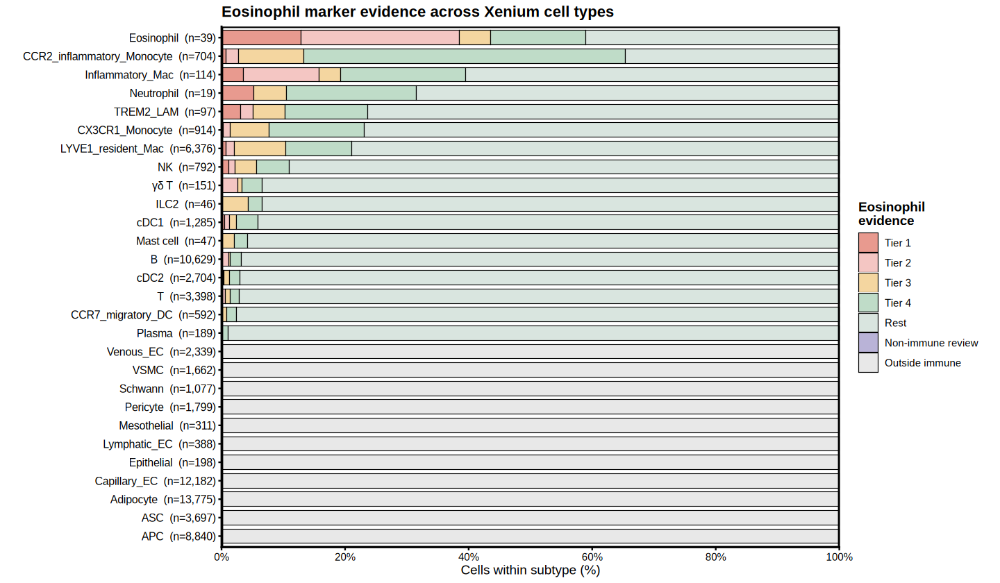

In [63]:
# ============================================================
# 5. Cell-style stacked barplot
# ============================================================

p_eos_call <- ggplot(
  plot_df,
  aes(
    x = Final_CellType_subtype,
    y = fraction,
    fill = EosRef_call
  )
) +

  geom_col(
    position = position_stack(reverse = TRUE),
    width = 0.78,
    colour = "black",
    linewidth = 0.25
  ) +

  coord_flip() +

  scale_fill_manual(
    values = call_cols,
    breaks = call_order,
    labels = call_labels,
    drop = FALSE
  ) +

  scale_x_discrete(
    labels = subtype_label_vec
  ) +

  scale_y_continuous(
    labels = scales::percent_format(
      accuracy = 1
    ),
    breaks = seq(
      0,
      1,
      by = 0.2
    ),
    expand = c(0, 0)
  ) +

  labs(
    title = "Eosinophil marker evidence across Xenium cell types",
    # subtitle = "Hierarchical Eosinophil marker-confidence tiers",
    x = NULL,
    y = "Cells within subtype (%)",
    fill = "Eosinophil\nevidence"
  ) +

  theme_cell(
    base_size = 11
  ) +

  theme(
    legend.position = "right",
    axis.text.y = element_text(
      size = 9,
      colour = "black"
    ),
    plot.title = element_text(
      face = "bold",
      size = 13
    ),
    plot.subtitle = element_text(
      size = 10,
      colour = "black"
    )
  )

p_eos_call

In [69]:
options(repr.plot.width=18, repr.plot.height=8)

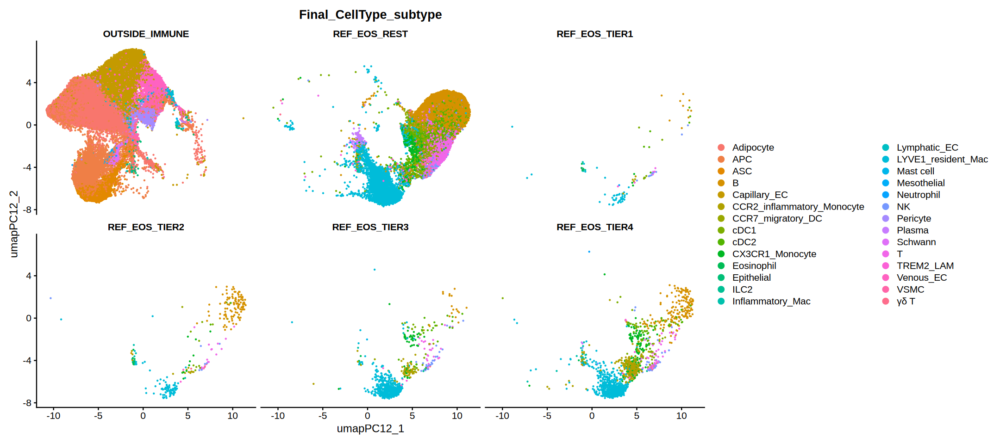

In [70]:
DimPlot(
  region_spatial,
  reduction = "umap_PC12",
  group.by = 'Final_CellType_subtype',
  split.by = "EosRef_call",
  ncol=3
)

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


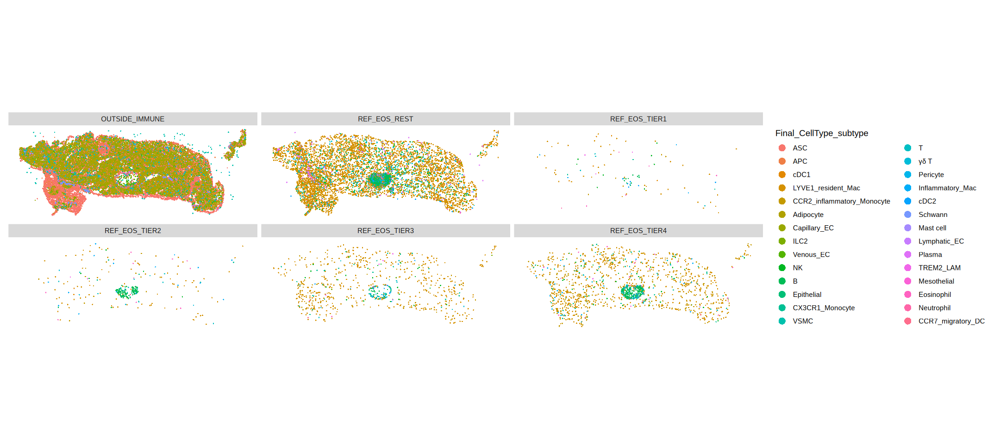

In [71]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
    group.by = 'Final_CellType_subtype',
  split.by = "EosRef_call",
  flip_xy = FALSE,
  dark.background = FALSE
)

In [73]:
md <- region_spatial@meta.data

existing_eos <- (
  as.character(md$Final_CellType_subtype) ==
    "Eosinophil"
)

tier12 <- (
  md$EosRef_call %in%
    c(
      "REF_EOS_TIER1",
      "REF_EOS_TIER2"
    )
)

region_spatial$Final_Eos_status <- dplyr::case_when(

  existing_eos & tier12 ~
    "FINAL_EOS",

  existing_eos & !tier12 ~
    "REVIEW_EXISTING_EOS",

  !existing_eos & tier12 ~
    "REVIEW_TIER12_NON_EOS",

  TRUE ~
    "NON_EOS"
)

In [74]:
table(
  region_spatial$Final_Eos_status
)


            FINAL_EOS               NON_EOS   REVIEW_EXISTING_EOS 
                   15                 73936                    24 
REVIEW_TIER12_NON_EOS 
                  389 

In [76]:
region_spatial$Final_CellType_subtype_refined <-
  as.character(
    region_spatial$Final_CellType_subtype
  )

In [77]:
region_spatial$Final_CellType_subtype_refined[
  existing_eos | tier12
] <- "Eosinophil"

In [78]:
sum(region_spatial$Final_CellType_subtype_refined == "Eosinophil")

[1] 428

In [79]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [7]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [25]:
options(repr.plot.width=12, repr.plot.height=8)

Warning message:
“Removed 74364 rows containing missing values or values outside the scale range
(`geom_point()`).”


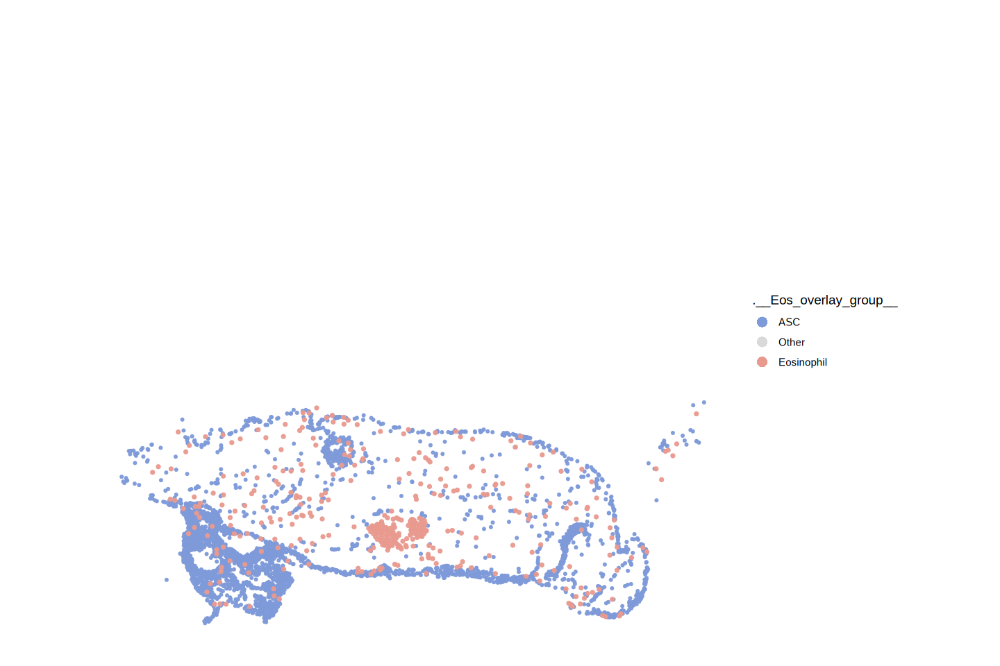

In [26]:
plot_eos_with_celltypes(
  region_spatial,
  celltypes = "ASC",
    flip_xy = TRUE
)

In [15]:
unique(region_spatial$Final_CellType_subtype_refined)

[1] "ASC"                        "APC"                       
 [3] "cDC1"                       "LYVE1_resident_Mac"        
 [5] "Eosinophil"                 "CCR2_inflammatory_Monocyte"
 [7] "Adipocyte"                  "Capillary_EC"              
 [9] "ILC2"                       "Venous_EC"                 
[11] "NK"                         "B"                         
[13] "Epithelial"                 "CX3CR1_Monocyte"           
[15] "VSMC"                       "T"                         
[17] "γδ T"                       "Pericyte"                  
[19] "Inflammatory_Mac"           "cDC2"                      
[21] "Schwann"                    "Mast cell"                 
[23] "Lymphatic_EC"               "Plasma"                    
[25] "TREM2_LAM"                  "Mesothelial"               
[27] "Neutrophil"                 "CCR7_migratory_DC"

Warning message:
“Removed 74364 rows containing missing values or values outside the scale range
(`geom_point()`).”


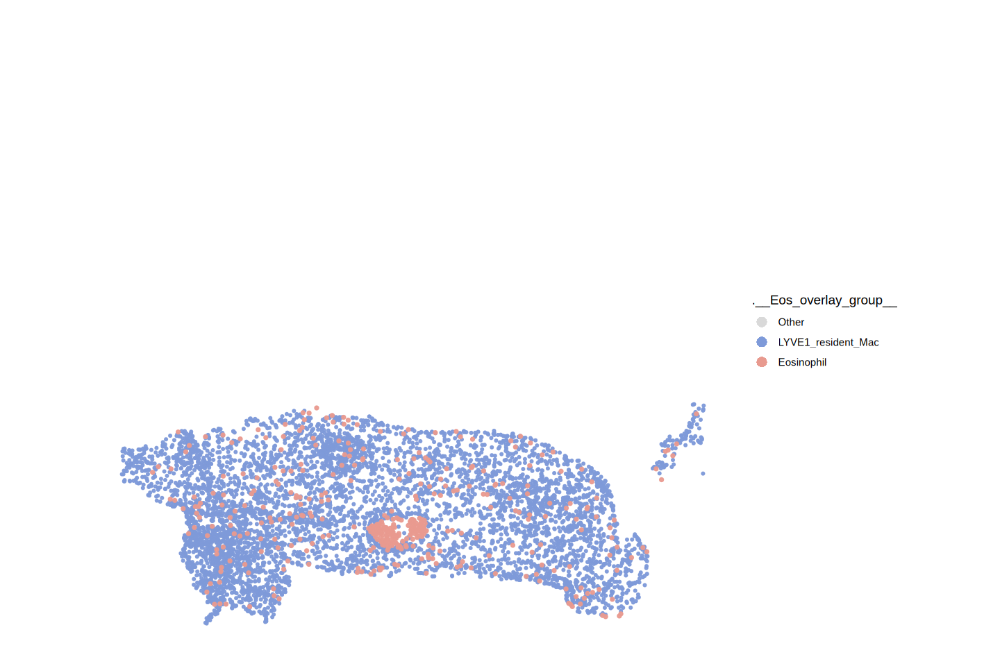

In [33]:
plot_eos_with_celltypes(
  region_spatial,
  celltypes = "LYVE1_resident_Mac",
    flip_xy = TRUE
)

Warning message:
“Removed 74364 rows containing missing values or values outside the scale range
(`geom_point()`).”


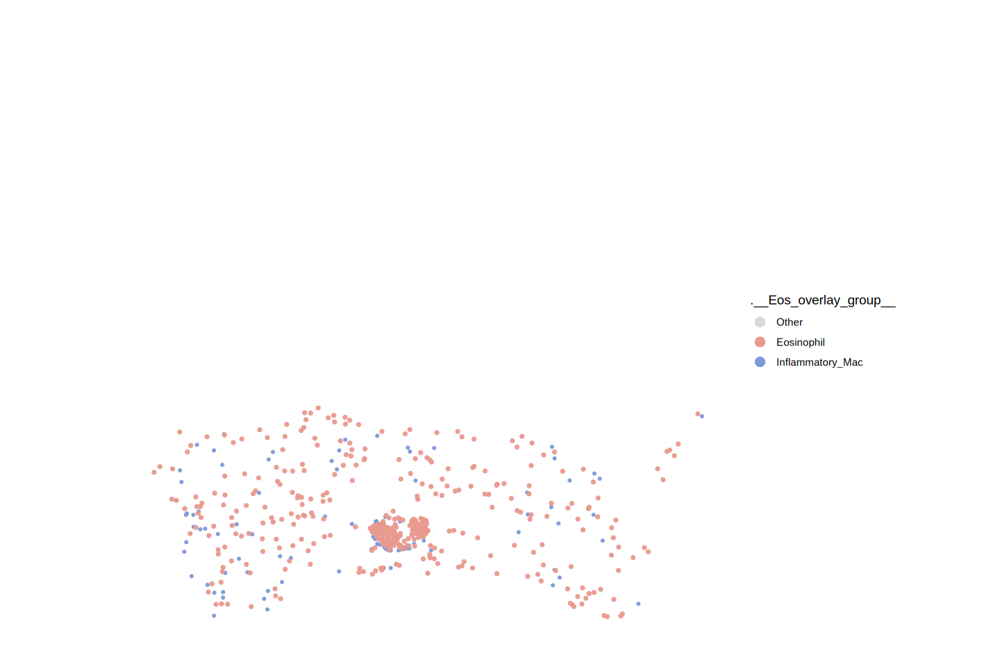

In [32]:
plot_eos_with_celltypes(
  region_spatial,
  celltypes = "Inflammatory_Mac",
    flip_xy = TRUE
)

Warning message:
“Removed 74364 rows containing missing values or values outside the scale range
(`geom_point()`).”


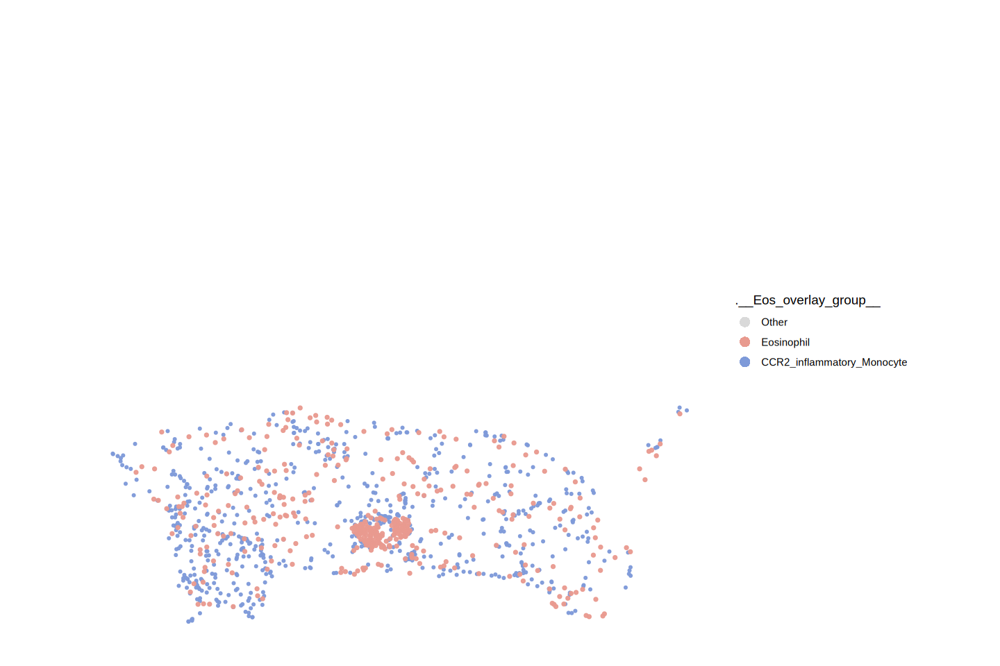

In [31]:
plot_eos_with_celltypes(
  region_spatial,
  celltypes = "CCR2_inflammatory_Monocyte",
    flip_xy = TRUE
)

Warning message:
“Removed 74364 rows containing missing values or values outside the scale range
(`geom_point()`).”


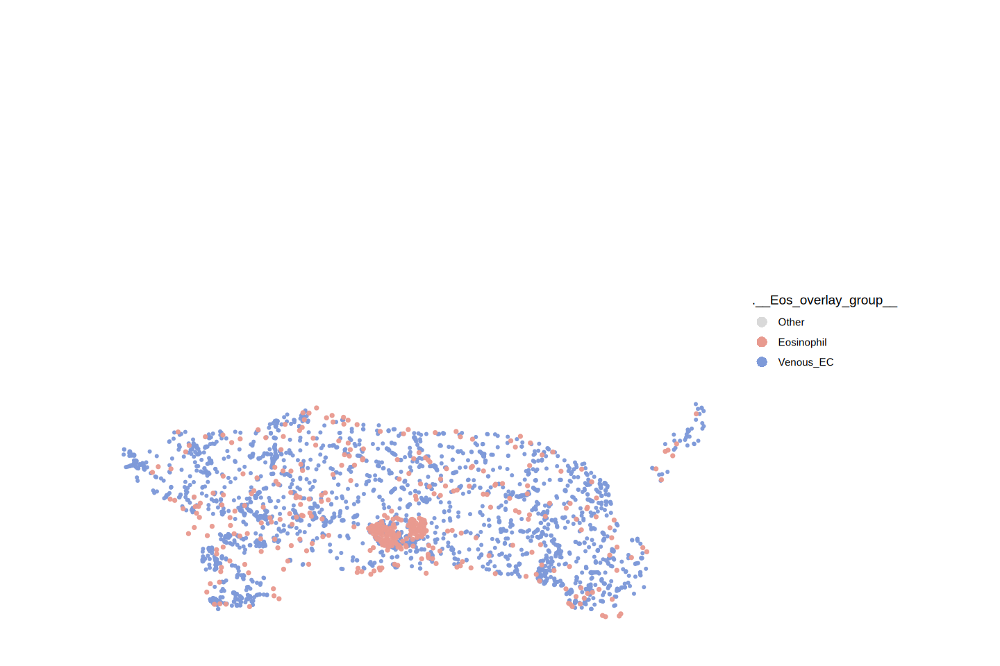

In [30]:
plot_eos_with_celltypes(
  region_spatial,
  celltypes = "Venous_EC",
    flip_xy = TRUE
)

Warning message:
“Removed 74364 rows containing missing values or values outside the scale range
(`geom_point()`).”


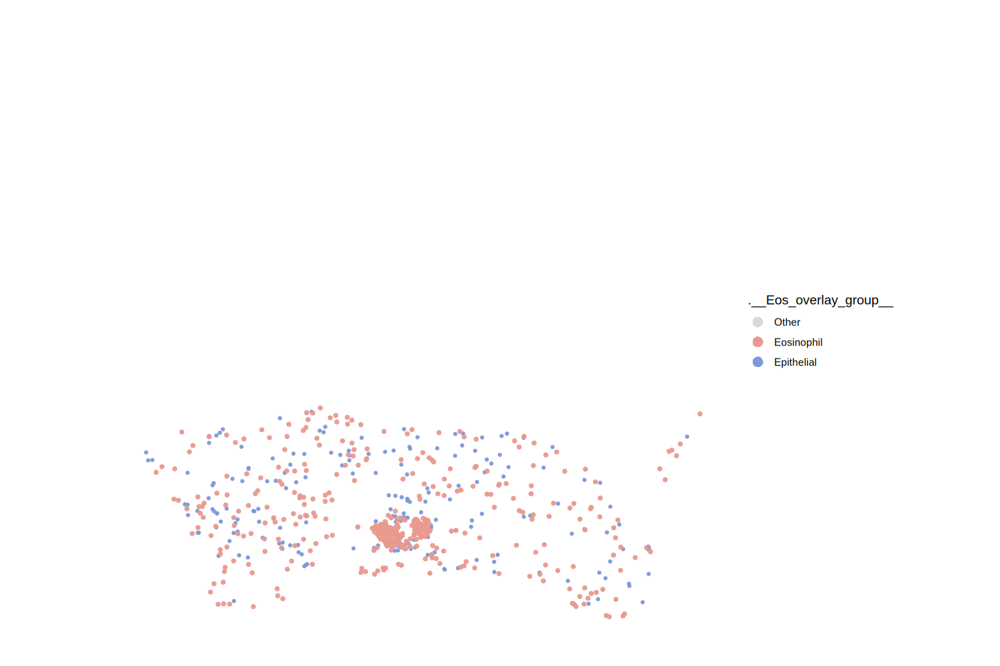

In [28]:
plot_eos_with_celltypes(
  region_spatial,
  celltypes = "Epithelial",
    flip_xy = TRUE
)

### Define Eos subtype

In [7]:
region_spatial = readRDS(file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))

In [8]:
table(region_spatial$EosRef_call)


OUTSIDE_IMMUNE   REF_EOS_REST  REF_EOS_TIER1  REF_EOS_TIER2  REF_EOS_TIER3 
         46268          25267            101            303            790 
 REF_EOS_TIER4 
          1635 

In [9]:
eos_cells <- rownames(region_spatial@meta.data)[
  region_spatial$Final_CellType_subtype_refined == "Eosinophil"
]

length(eos_cells)

[1] 428

In [10]:
eos_obj <- subset(
  region_spatial,
  cells = eos_cells
)

DefaultAssay(eos_obj) <- "Xenium"

Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


In [11]:
EOS_GENE_SET_PATH <- file.path(
  PIPELINE_REPO,
  "config",
  "eos_gene_sets.tsv"
)

eos_gene_sets <- read.delim(
  EOS_GENE_SET_PATH,
  stringsAsFactors = FALSE
)

In [12]:
short_genes <- eos_gene_sets$gene[
  eos_gene_sets$gene_set == "short_lived"
]

long_genes <- eos_gene_sets$gene[
  eos_gene_sets$gene_set == "long_lived"
]

length(short_genes)
# 47

length(long_genes)
# 46

[1] 47

[1] 46

In [13]:
short_use <- intersect(
  short_genes,
  rownames(eos_obj)
)

long_use <- intersect(
  long_genes,
  rownames(eos_obj)
)

cat(
  "Short-lived:",
  length(short_use),
  "/",
  length(short_genes),
  "\n"
)

cat(
  "Long-lived:",
  length(long_use),
  "/",
  length(long_genes),
  "\n"
)

Short-lived: 47 / 47 
Long-lived: 46 / 46 


In [16]:
short_use

[1] "Itgal"   "Nfkbia"  "Dusp5"   "Pim1"    "Fau"     "Birc3"   "Rps27a" 
 [8] "Ncf1"    "Rps3a1"  "Rpl18a"  "Mxd1"    "Tgm2"    "Thbs1"   "Rpl35a" 
[15] "Ypel3"   "Rps16"   "Coro1a"  "Stk19"   "Cyba"    "Cxcl2"   "Cd9"    
[22] "Taldo1"  "Vasp"    "Rpl37a"  "Rpl17"   "Slc16a3" "Rps15"   "Srgn"   
[29] "Rps13"   "Rps23"   "Rps12"   "Cdk2ap2" "Sirpa"   "Dazap2"  "Ccl6"   
[36] "Rpl5"    "Nr4a1"   "Rps29"   "Gsr"     "Rpl32"   "Rps5"    "Rps8"   
[43] "Rps26"   "Lcp1"    "Ptafr"   "Cebpb"   "Kdm6b"

In [17]:
long_use

[1] "Lmna"     "Fgfr1"    "Cd300a"   "Cd44"     "Cd24a"    "Ptprc"   
 [7] "Klf2"     "Rgs1"     "Camk1d"   "Fer"      "F5"       "Csf2rb"  
[13] "Kctd12"   "Cytip"    "Cd80"     "Mctp1"    "Cdkn1a"   "Coro2a"  
[19] "Adam8"    "Slc2a3"   "Il1rl1"   "Elmo1"    "Mbnl1"    "Lyn"     
[25] "Trerf1"   "Adgre1"   "Plek"     "Atp2b1"   "Dnaja1"   "Basp1"   
[31] "Srpk2"    "Prrc2c"   "Slk"      "Rab8b"    "Rbm39"    "Arhgap18"
[37] "Tsc22d3"  "Rbms1"    "Hsp90aa1" "Rsrp1"    "Cd47"     "Srsf2"   
[43] "Dock8"    "Calm1"    "S1pr1"    "Cd84"

In [14]:
short_ribosomal <- grep(
  "^Rp[ls]",
  short_use,
  value = TRUE
)

short_nonrib <- setdiff(
  short_use,
  short_ribosomal
)

cat(
  "Short full:", length(short_use), "\n",
  "Short ribosomal:", length(short_ribosomal), "\n",
  "Short non-ribosomal:", length(short_nonrib), "\n"
)

Short full: 47 
 Short ribosomal: 17 
 Short non-ribosomal: 30 


In [18]:
state_genes <- unique(
  c(
    short_use,
    long_use
  )
)

eos_obj <- ScaleData(
  eos_obj,
  features = state_genes,
  assay = "Xenium",
  verbose = FALSE
)

Warning message:
“Different features in new layer data than already exists for scale.data”


In [19]:
state_scaled <- GetAssayData(
  eos_obj,
  assay = "Xenium",
  layer = "scale.data"
)

state_scaled <- state_scaled[
  state_genes,
  ,
  drop = FALSE
]

In [20]:
short_score_full <- colMeans(
  state_scaled[
    short_use,
    ,
    drop = FALSE
  ],
  na.rm = TRUE
)

short_score_nonrib <- colMeans(
  state_scaled[
    short_nonrib,
    ,
    drop = FALSE
  ],
  na.rm = TRUE
)

long_score <- colMeans(
  state_scaled[
    long_use,
    ,
    drop = FALSE
  ],
  na.rm = TRUE
)

In [21]:
eos_obj$EosShort_score_full <-
  short_score_full[colnames(eos_obj)]

eos_obj$EosShort_score_nonrib <-
  short_score_nonrib[colnames(eos_obj)]

eos_obj$EosLong_score <-
  long_score[colnames(eos_obj)]

In [22]:
eos_obj$EosState_score <-
  eos_obj$EosLong_score -
  eos_obj$EosShort_score_nonrib

In [23]:
eos_obj$EosState_score_full <-
  eos_obj$EosLong_score -
  eos_obj$EosShort_score_full

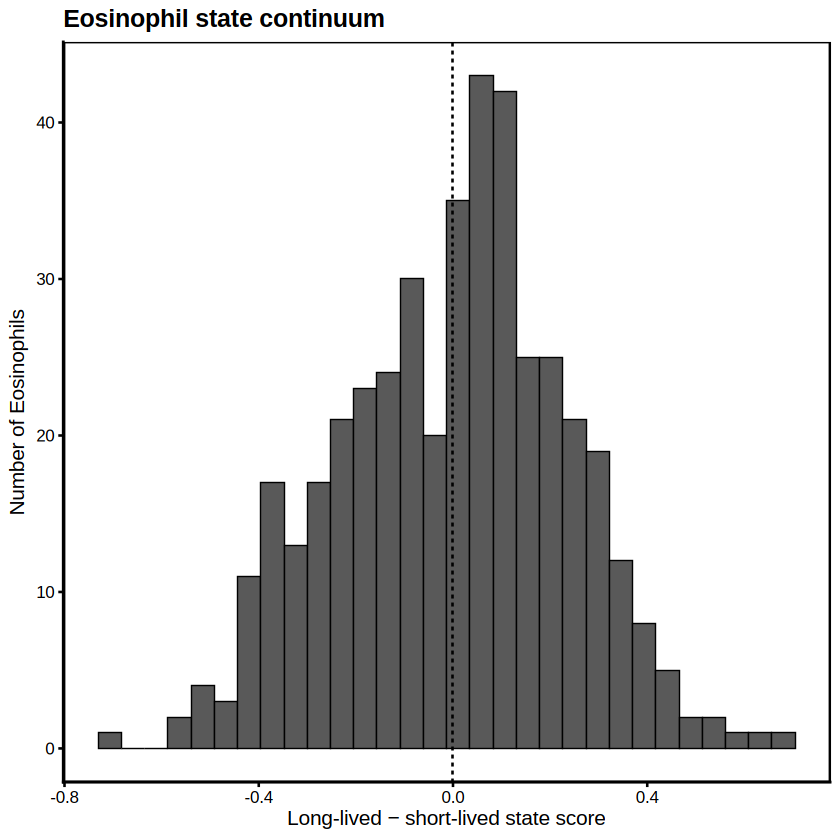

In [24]:
library(ggplot2)

ggplot(
  eos_obj@meta.data,
  aes(
    x = EosState_score
  )
) +
  geom_histogram(
    bins = 30,
    colour = "black",
    linewidth = 0.3
  ) +
  geom_vline(
    xintercept = 0,
    linetype = 2
  ) +
  labs(
    x = "Long-lived − short-lived state score",
    y = "Number of Eosinophils",
    title = "Eosinophil state continuum"
  ) +
  theme_cell()

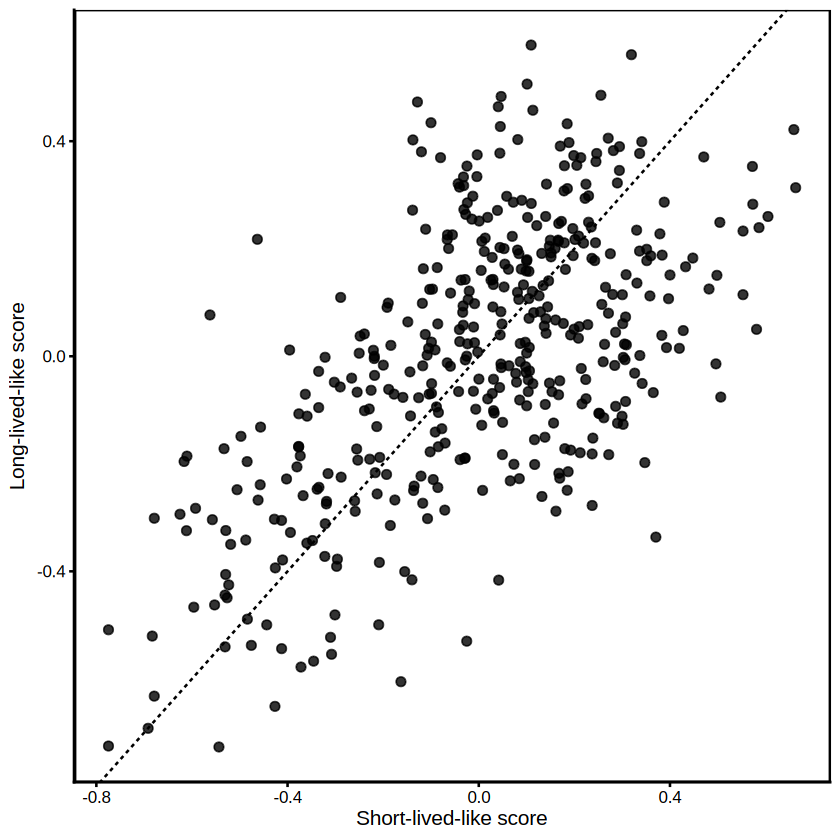

In [25]:
ggplot(
  eos_obj@meta.data,
  aes(
    x = EosShort_score_nonrib,
    y = EosLong_score
  )
) +
  geom_point(
    size = 2,
    alpha = 0.8
  ) +
  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = 2
  ) +
  labs(
    x = "Short-lived-like score",
    y = "Long-lived-like score"
  ) +
  theme_cell()

In [27]:
state_counts <- FetchData(
  eos_obj,
  vars = state_genes,
  layer = "counts"
)

In [28]:
eos_obj$EosShort_n_detected <-
  rowSums(
    state_counts[, short_nonrib, drop = FALSE] > 0
  )

eos_obj$EosLong_n_detected <-
  rowSums(
    state_counts[, long_use, drop = FALSE] > 0
  )

eos_obj$EosShort_fraction_detected <-
  eos_obj$EosShort_n_detected /
  length(short_nonrib)

eos_obj$EosLong_fraction_detected <-
  eos_obj$EosLong_n_detected /
  length(long_use)

In [29]:
cor(
  eos_obj$EosState_score,
  eos_obj$nCount_Xenium,
  method = "spearman"
)

cor(
  eos_obj$EosState_score,
  eos_obj$nFeature_Xenium,
  method = "spearman"
)

[1] 0.04122969

[1] 0.1443838

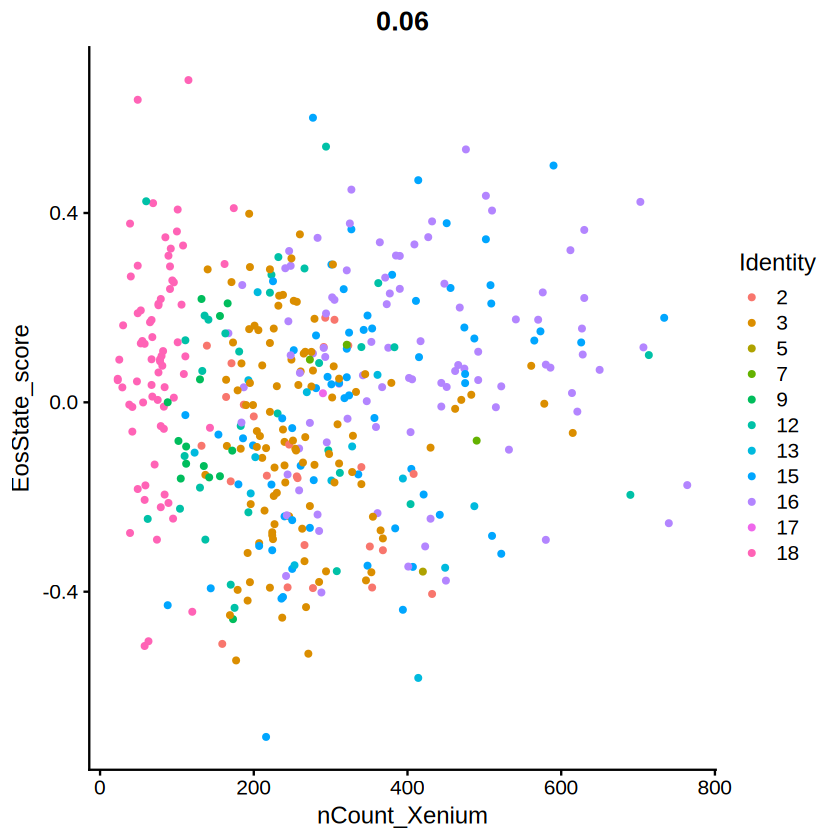

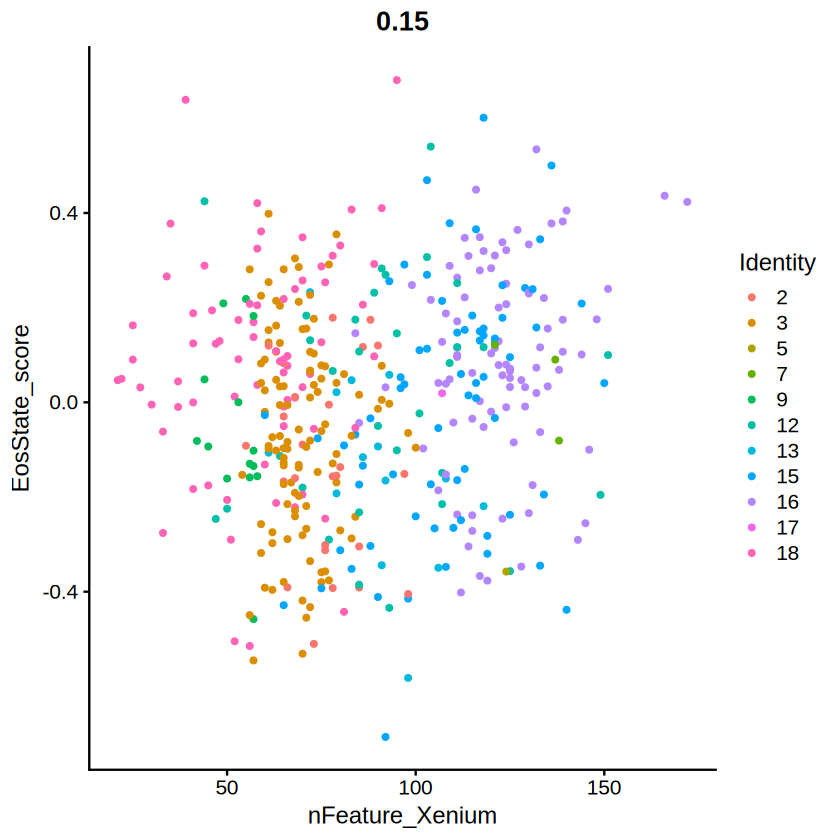

In [30]:
FeatureScatter(
  eos_obj,
  feature1 = "nCount_Xenium",
  feature2 = "EosState_score"
)

FeatureScatter(
  eos_obj,
  feature1 = "nFeature_Xenium",
  feature2 = "EosState_score"
)

In [31]:
cor(
  eos_obj$EosState_score,
  eos_obj$EosState_score_full,
  method = "spearman"
)

[1] 0.7625547

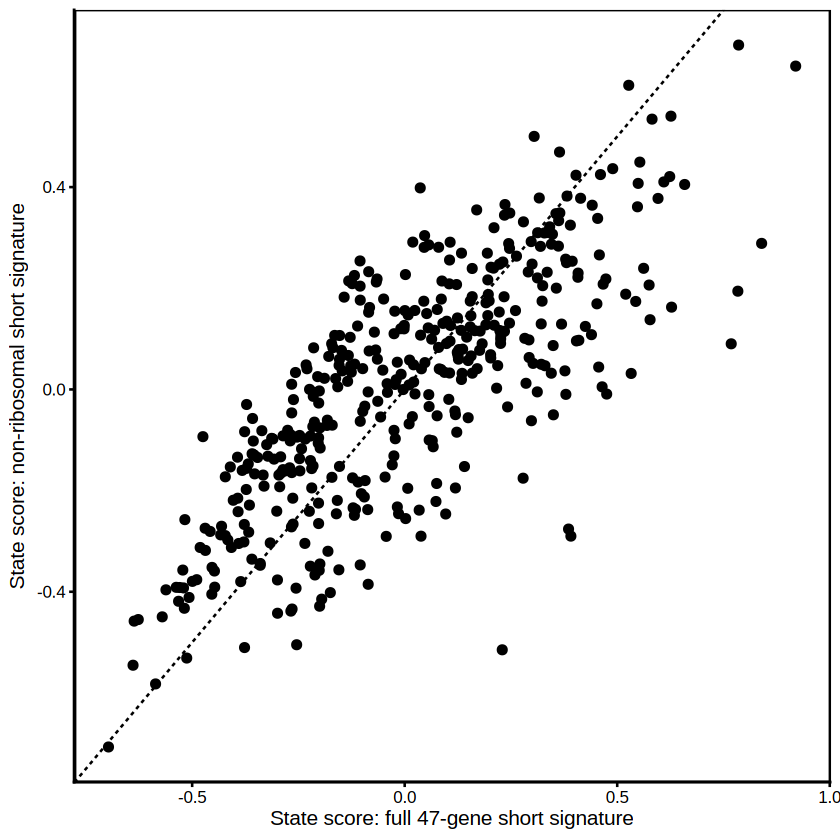

In [32]:
ggplot(
  eos_obj@meta.data,
  aes(
    x = EosState_score_full,
    y = EosState_score
  )
) +
  geom_point(
    size = 2
  ) +
  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = 2
  ) +
  labs(
    x = "State score: full 47-gene short signature",
    y = "State score: non-ribosomal short signature"
  ) +
  theme_cell()

In [33]:
eos_md <- eos_obj@meta.data

eos_obj$EosShort_z <- as.numeric(
  scale(eos_md$EosShort_score_nonrib)
)

eos_obj$EosLong_z <- as.numeric(
  scale(eos_md$EosLong_score)
)

In [34]:
# Relative short ↔ long state
eos_obj$EosState_balance <- (
  eos_obj$EosLong_z -
  eos_obj$EosShort_z
) / sqrt(2)

# Overall activation of the two Eos-state programs
eos_obj$EosState_activity <- (
  eos_obj$EosLong_z +
  eos_obj$EosShort_z
) / sqrt(2)

In [35]:
cor.test(
  eos_obj$EosShort_score_nonrib,
  eos_obj$EosLong_score,
  method = "spearman"
)

Warning message in cor.test.default(eos_obj$EosShort_score_nonrib, eos_obj$EosLong_score, :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  eos_obj$EosShort_score_nonrib and eos_obj$EosLong_score
S = 6034296, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.5382053 


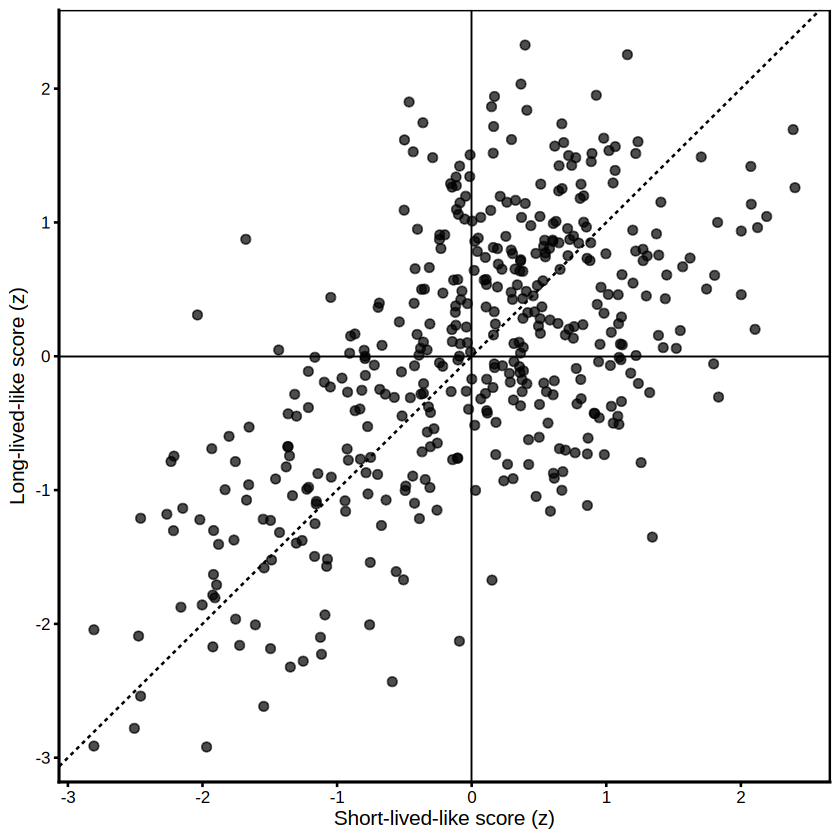

In [36]:
ggplot(
  eos_obj@meta.data,
  aes(
    x = EosShort_z,
    y = EosLong_z
  )
) +
  geom_point(
    size = 2,
    alpha = 0.7
  ) +
  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = 2
  ) +
  geom_hline(
    yintercept = 0,
    linewidth = 0.4
  ) +
  geom_vline(
    xintercept = 0,
    linewidth = 0.4
  ) +
  labs(
    x = "Short-lived-like score (z)",
    y = "Long-lived-like score (z)"
  ) +
  theme_cell()

In [37]:
if (!requireNamespace("diptest", quietly = TRUE)) {
  install.packages("diptest")
}

diptest::dip.test(
  eos_obj$EosState_balance
)


	Hartigans' dip test for unimodality / multimodality

data:  eos_obj$EosState_balance
D = 0.013598, p-value = 0.9066
alternative hypothesis: non-unimodal, i.e., at least bimodal


Package 'mclust' version 6.1.3
Type 'citation("mclust")' for citing this R package in publications.


Attaching package: ‘mclust’


The following object is masked from ‘package:dplyr’:

    count




---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust X (univariate normal) model with 1 component: 

 log-likelihood   n df       BIC       ICL
      -408.7044 428  2 -829.5271 -829.5271

Clustering table:
  1 
428 

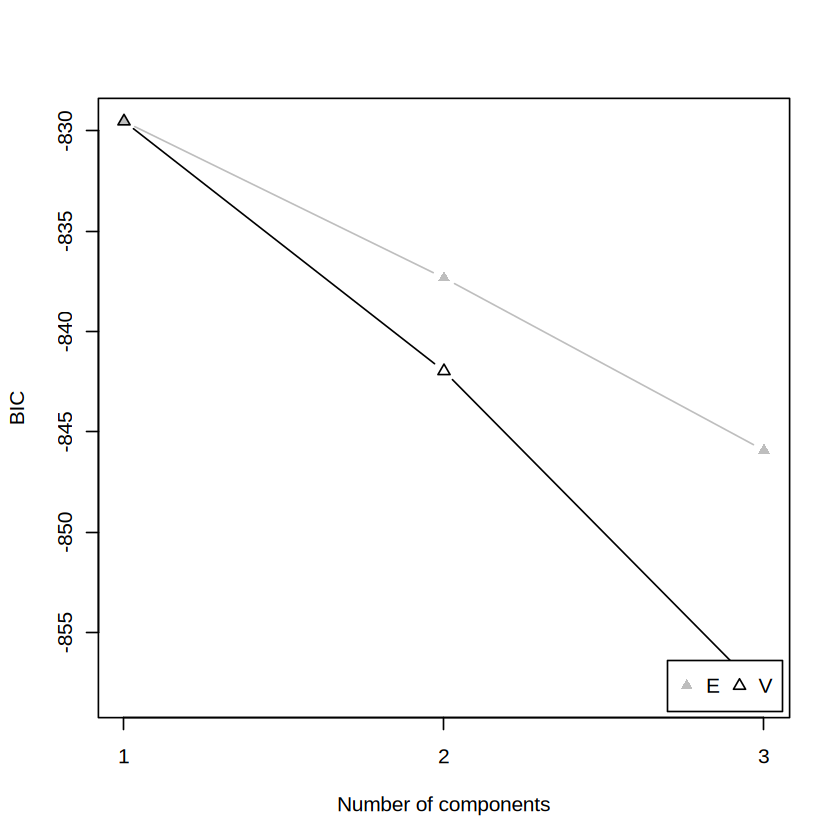

In [38]:
library(mclust)

mclust_fit <- Mclust(
  eos_obj$EosState_balance,
  G = 1:3
)

summary(mclust_fit)

plot(
  mclust_fit,
  what = "BIC"
)

In [39]:
eos_obj$EosState_n_detected <-
  eos_obj$EosShort_n_detected +
  eos_obj$EosLong_n_detected

`geom_smooth()` using formula = 'y ~ x'


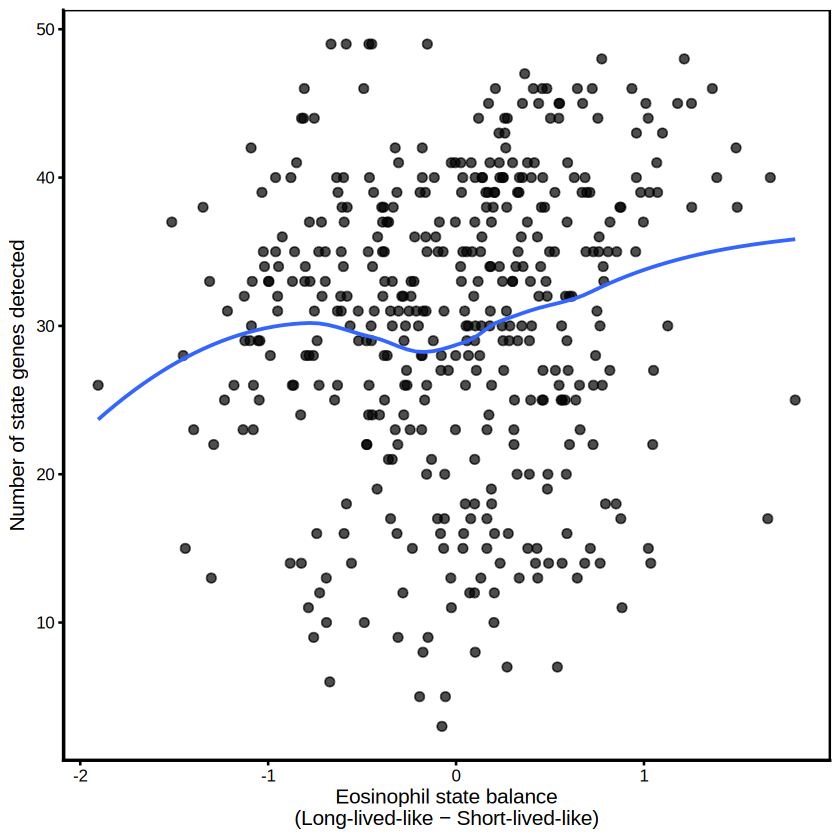

In [43]:
ggplot(
  eos_obj@meta.data,
  aes(
    x = EosState_balance,
    y = EosState_n_detected
  )
) +
  geom_point(
    size = 2,
    alpha = 0.7
  ) +
  geom_smooth(
    method = "loess",
    se = FALSE,
    linewidth = 0.8
  ) +
  labs(
    x = "Eosinophil state balance\n(Long-lived-like − Short-lived-like)",
    y = "Number of state genes detected"
  ) +
  theme_cell()

In [42]:
cor.test(
  eos_obj$EosState_balance,
  eos_obj$EosState_n_detected,
  method = "spearman"
)

Warning message in cor.test.default(eos_obj$EosState_balance, eos_obj$EosState_n_detected, :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  eos_obj$EosState_balance and eos_obj$EosState_n_detected
S = 11310634, p-value = 0.005347
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.1344159 


`geom_smooth()` using formula = 'y ~ x'


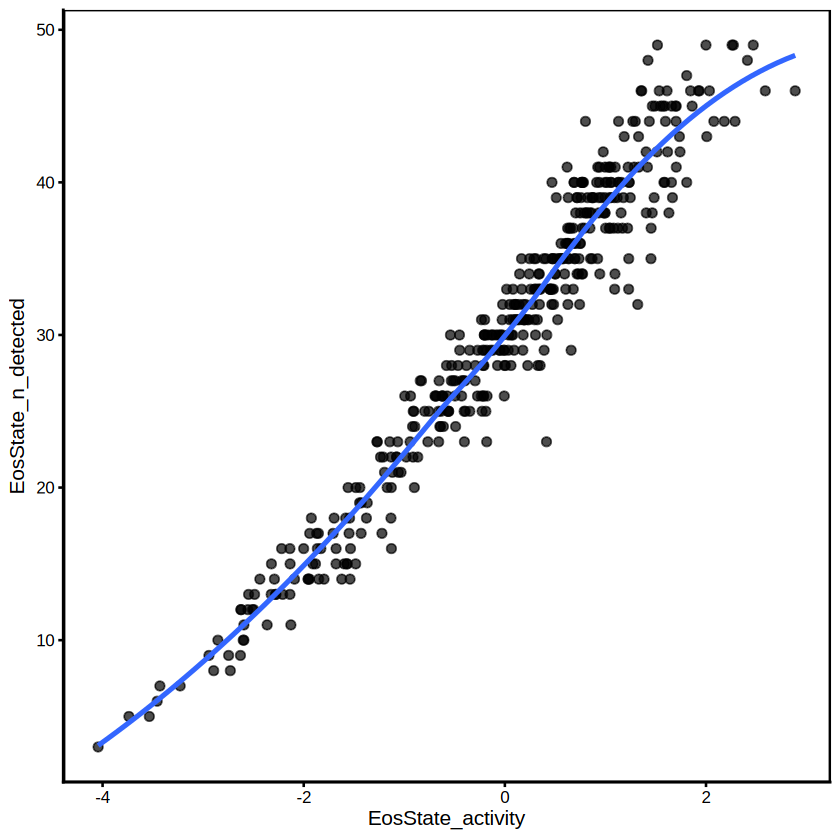

In [44]:
ggplot(
  eos_obj@meta.data,
  aes(
    x = EosState_activity,
    y = EosState_n_detected
  )
) +
  geom_point(
    size = 2,
    alpha = 0.7
  ) +
  geom_smooth(
    method = "loess",
    se = FALSE
  ) +
  theme_cell()

In [45]:
summary(
  eos_obj$EosState_n_detected
)

quantile(
  eos_obj$EosState_n_detected,
  probs = c(
    0.05,
    0.10,
    0.25,
    0.50,
    0.75,
    0.90,
    0.95
  )
)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   3.00   25.00   31.50   30.35   38.00   49.00 

5%   10%   25%   50%   75%   90%   95% 
12.35 15.00 25.00 31.50 38.00 42.00 45.00

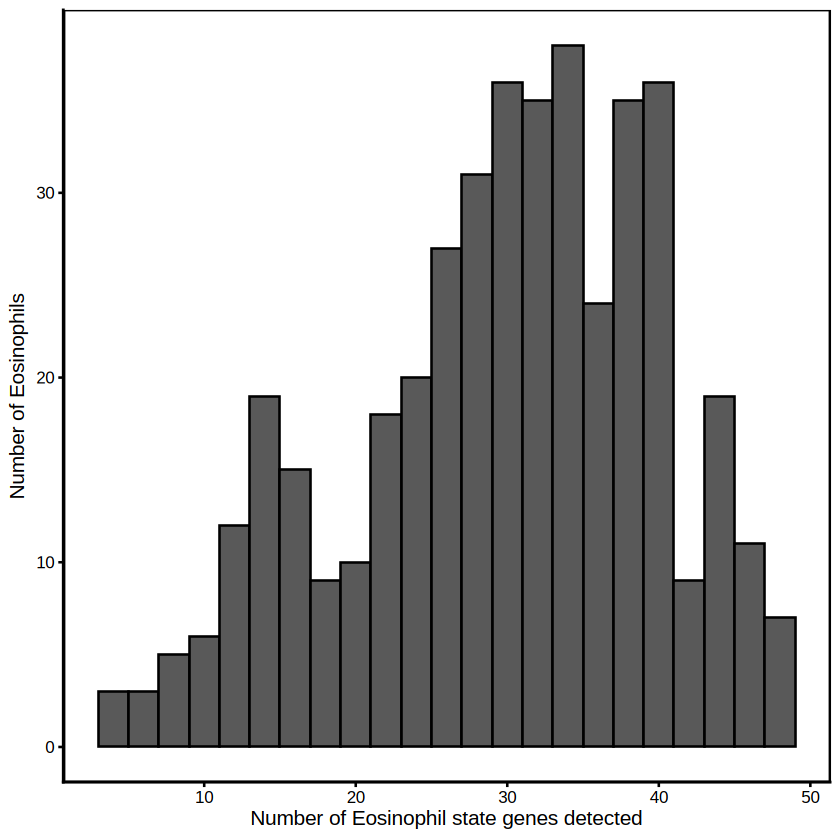

In [46]:
ggplot(
  eos_obj@meta.data,
  aes(x = EosState_n_detected)
) +
  geom_histogram(
    binwidth = 2,
    colour = "black"
  ) +
  labs(
    x = "Number of Eosinophil state genes detected",
    y = "Number of Eosinophils"
  ) +
  theme_cell()

In [48]:
# State balance vs signature detection
cor.test(
  eos_obj$EosState_balance,
  eos_obj$EosState_n_detected,
  method = "spearman"
)

# Activity vs signature detection
cor.test(
  eos_obj$EosState_activity,
  eos_obj$EosState_n_detected,
  method = "spearman"
)

# Balance vs total Xenium complexity
cor.test(
  eos_obj$EosState_balance,
  eos_obj$nFeature_Xenium,
  method = "spearman"
)

cor.test(
  eos_obj$EosState_balance,
  eos_obj$nCount_Xenium,
  method = "spearman"
)

Warning message in cor.test.default(eos_obj$EosState_balance, eos_obj$EosState_n_detected, :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  eos_obj$EosState_balance and eos_obj$EosState_n_detected
S = 11310634, p-value = 0.005347
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.1344159 


Warning message in cor.test.default(eos_obj$EosState_activity, eos_obj$EosState_n_detected, :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  eos_obj$EosState_activity and eos_obj$EosState_n_detected
S = 456770, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.9650442 


Warning message in cor.test.default(eos_obj$EosState_balance, eos_obj$nFeature_Xenium, :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  eos_obj$EosState_balance and eos_obj$nFeature_Xenium
S = 10239251, p-value = 6.254e-06
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.2164071 


Warning message in cor.test.default(eos_obj$EosState_balance, eos_obj$nCount_Xenium, :
“Cannot compute exact p-value with ties”



	Spearman's rank correlation rho

data:  eos_obj$EosState_balance and eos_obj$nCount_Xenium
S = 11443756, p-value = 0.0101
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.1242283 


In [49]:
fit_detection <- loess(
  EosState_balance ~ EosState_n_detected,
  data = eos_obj@meta.data
)

eos_obj$EosState_balance_residual <-
  residuals(fit_detection)

In [50]:
cor(
  eos_obj$EosState_balance,
  eos_obj$EosState_balance_residual,
  method = "spearman",
  use = "complete.obs"
)

[1] 0.9709148

In [54]:
q <- 0.10

q_low <- quantile(
  eos_obj$EosState_balance,
  q,
  na.rm = TRUE
)

q_high <- quantile(
  eos_obj$EosState_balance,
  1 - q,
  na.rm = TRUE
)

eos_obj$EosState_extreme <- dplyr::case_when(

  # Long program must itself be above average
  eos_obj$EosState_balance >= q_high &
    eos_obj$EosLong_z > 0 ~
    "Long-lived-like",

  # Short program must itself be above average
  eos_obj$EosState_balance <= q_low &
    eos_obj$EosShort_z > 0 ~
    "Short-lived-like",

  TRUE ~
    "Intermediate"
)

In [55]:
eos_obj$EosState_extreme <- factor(
  eos_obj$EosState_extreme,
  levels = c(
    "Short-lived-like",
    "Intermediate",
    "Long-lived-like"
  )
)

table(eos_obj$EosState_extreme)


Short-lived-like     Intermediate  Long-lived-like 
              40              354               34 

In [109]:
options(repr.plot.width=8, repr.plot.height=6)

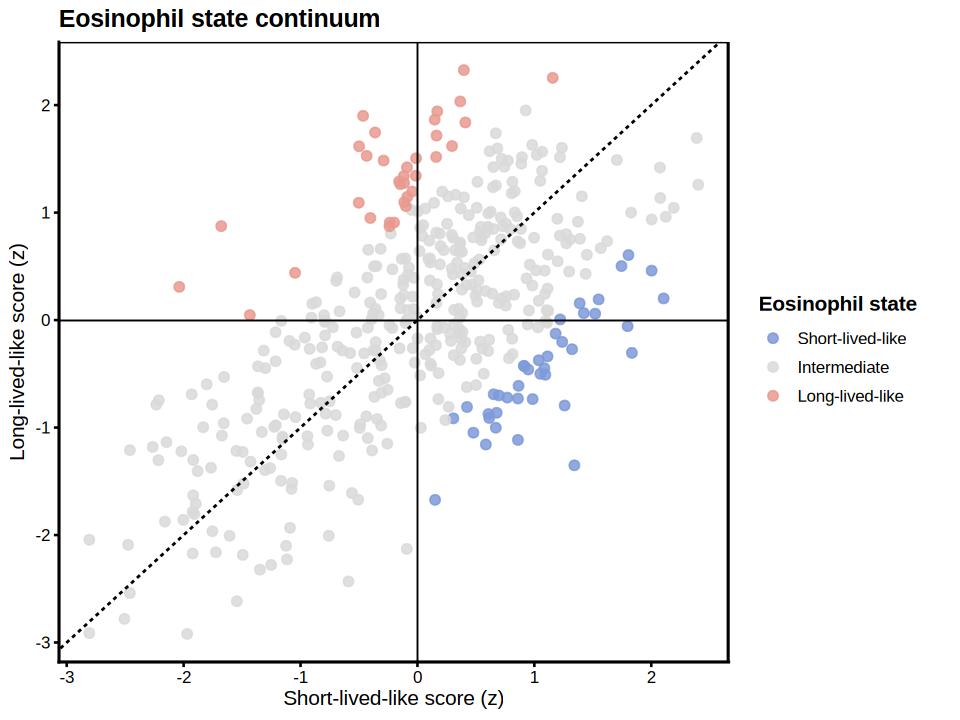

In [110]:
state_cols <- c(
  "Short-lived-like" = "#7E9AD9",
  "Intermediate"     = "#D9D9D9",
  "Long-lived-like"  = "#E89A8F"
)

ggplot(
  eos_obj@meta.data,
  aes(
    x = EosShort_z,
    y = EosLong_z,
    colour = EosState_extreme
  )
) +
  geom_point(
    size = 2.2,
    alpha = 0.85
  ) +
  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = 2,
    linewidth = 0.6
  ) +
  geom_hline(
    yintercept = 0,
    linewidth = 0.4
  ) +
  geom_vline(
    xintercept = 0,
    linewidth = 0.4
  ) +
  scale_colour_manual(
    values = state_cols,
    drop = FALSE
  ) +
  labs(
    title = "Eosinophil state continuum",
    x = "Short-lived-like score (z)",
    y = "Long-lived-like score (z)",
    colour = "Eosinophil state"
  ) +
  theme_cell()

In [57]:
library(ComplexHeatmap)
library(circlize)
library(dplyr)
library(grid)

# ============================================================
# 1. Choose state definition
# ============================================================

# Use your primary definition:
state_col <- "EosState_extreme"

# Or, for the strict polarized definition:
# state_col <- "EosState_polarized"


# ============================================================
# 2. Gene sets
# ============================================================

short_genes <- eos_gene_sets$gene[
  eos_gene_sets$gene_set == "short_lived"
]

long_genes <- eos_gene_sets$gene[
  eos_gene_sets$gene_set == "long_lived"
]

short_use <- intersect(
  short_genes,
  rownames(eos_obj)
)

long_use <- intersect(
  long_genes,
  rownames(eos_obj)
)

state_genes <- c(
  short_use,
  long_use
)

Loading required package: grid

ComplexHeatmap version 2.26.1
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite either one:
- Gu, Z. Complex Heatmap Visualization. iMeta 2022.
- Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
    genomic data. Bioinformatics 2016.


The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This message can be suppressed by:
  suppressPackageStartupMessages(library(ComplexHeatmap))


circlize version 0.4.18
CRAN page: https://cran.r-project.org/package=circlize
Github page: https://github.com/jokergoo/circlize
Documentation: https://jokergoo.github.io/circlize_book/book/

If you use it in published research, please cite:
Gu, Z. circlize implements a

In [58]:
short_nonrib <- short_use[
  !grepl("^Rp[ls]", short_use)
]

state_genes_primary <- c(
  short_nonrib,
  long_use
)

In [59]:
# ============================================================
# 3. Normalized expression
# ============================================================

expr <- GetAssayData(
  eos_obj,
  assay = "Xenium",
  layer = "data"
)

expr <- as.matrix(
  expr[
    state_genes_primary,
    ,
    drop = FALSE
  ]
)

In [60]:
# ============================================================
# 4. Row z-score
# ============================================================

expr_z <- t(
  scale(
    t(expr)
  )
)

# remove genes with zero variance
keep_gene <- apply(
  expr_z,
  1,
  function(x) all(is.finite(x))
)

expr_z <- expr_z[
  keep_gene,
  ,
  drop = FALSE
]

# Cap extremes for a cleaner heatmap
expr_z[
  expr_z > 2.5
] <- 2.5

expr_z[
  expr_z < -2.5
] <- -2.5

In [62]:
# ============================================================
# 5. Order cells by continuous state balance
# ============================================================

md <- eos_obj@meta.data

cell_order_state <- rownames(md)[
  order(
    md$EosState_balance,
    decreasing = FALSE
  )
]

expr_z <- expr_z[
  ,
  cell_order_state,
  drop = FALSE
]

In [63]:
# ============================================================
# 6. Column annotations
# ============================================================

state_annotation <- as.character(
  md[
    cell_order_state,
    state_col
  ]
)

state_annotation <- factor(
  state_annotation,
  levels = c(
    "Short-lived-like",
    "Intermediate",
    "Long-lived-like"
  )
)

balance_annotation <- md[
  cell_order_state,
  "EosState_balance"
]

state_cols <- c(
  "Short-lived-like" = "#7E9AD9",
  "Intermediate"     = "#D9D9D9",
  "Long-lived-like"  = "#E89A8F"
)

balance_lim <- max(
  abs(balance_annotation),
  na.rm = TRUE
)

balance_fun <- circlize::colorRamp2(
  c(
    -balance_lim,
    0,
    balance_lim
  ),
  c(
    "#7E9AD9",
    "#F7F7F7",
    "#E89A8F"
  )
)

ha_top <- HeatmapAnnotation(

  State = state_annotation,

  Balance = anno_simple(
    balance_annotation,
    col = balance_fun,
    border = FALSE
  ),

  col = list(
    State = state_cols
  ),

  annotation_name_gp = gpar(
    fontsize = 9,
    fontface = "bold"
  ),

  annotation_legend_param = list(
    State = list(
      title = "Eosinophil state"
    )
  )
)

In [64]:
# ============================================================
# 7. Gene-set annotation
# ============================================================

gene_state <- ifelse(
  rownames(expr_z) %in% short_nonrib,
  "Short-lived signature",
  "Long-lived signature"
)

gene_state <- factor(
  gene_state,
  levels = c(
    "Short-lived signature",
    "Long-lived signature"
  )
)

gene_set_cols <- c(
  "Short-lived signature" = "#7E9AD9",
  "Long-lived signature"  = "#E89A8F"
)

ha_row <- rowAnnotation(
  Signature = gene_state,

  col = list(
    Signature = gene_set_cols
  ),

  show_annotation_name = FALSE
)

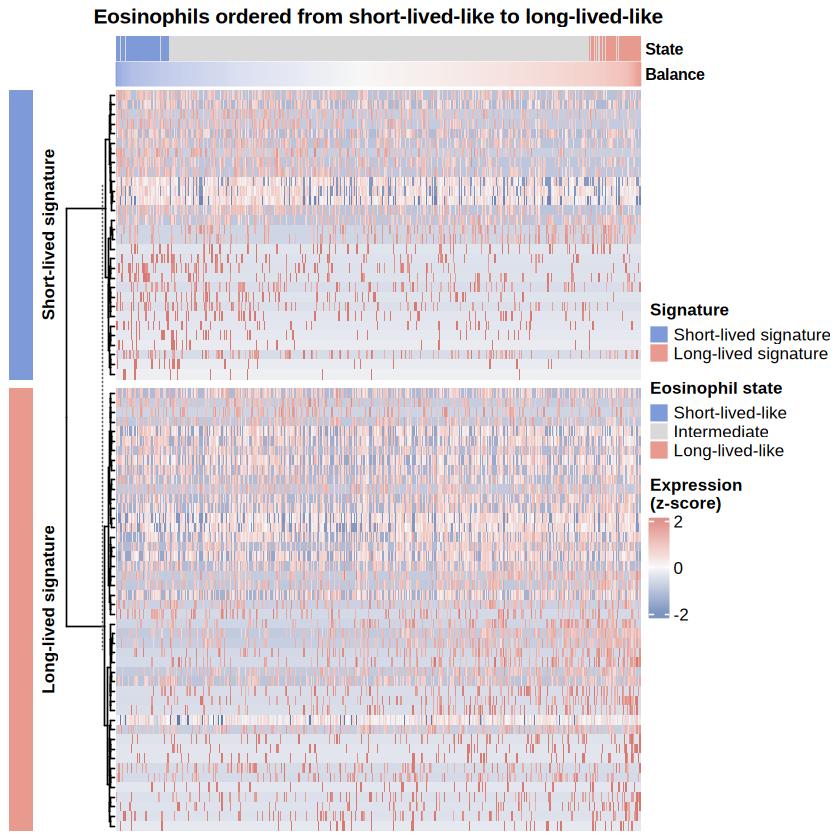

In [65]:
# ============================================================
# 8. Heatmap
# ============================================================

expr_col_fun <- circlize::colorRamp2(
  c(
    -2.5,
    0,
    2.5
  ),
  c(
    "#5B7DB1",
    "#F7F7F7",
    "#D77A72"
  )
)

ht <- ha_row +

  Heatmap(
    expr_z,

    name = "Row z-score",

    col = expr_col_fun,

    top_annotation = ha_top,

    # --------------------------------------------------------
    # Preserve biological ordering
    # --------------------------------------------------------
    cluster_columns = FALSE,

    # Split rows by state signature
    row_split = gene_state,

    # Cluster genes WITHIN short / long signature
    cluster_rows = TRUE,

    clustering_distance_rows = "pearson",
    clustering_method_rows = "ward.D2",

    # --------------------------------------------------------
    # Appearance
    # --------------------------------------------------------
    show_column_names = FALSE,

    show_row_names = TRUE,

    row_names_gp = gpar(
      fontsize = 7
    ),

    row_names_side = "left",

    column_title =
      "Eosinophils ordered from short-lived-like to long-lived-like",

    column_title_gp = gpar(
      fontsize = 12,
      fontface = "bold"
    ),

    row_title_gp = gpar(
      fontsize = 10,
      fontface = "bold"
    ),

    row_gap = unit(
      2,
      "mm"
    ),

    border = FALSE,

    rect_gp = gpar(
      col = NA
    ),

    heatmap_legend_param = list(
      title = "Expression\n(z-score)",
      at = c(
        -2,
        0,
        2
      )
    )
  )

draw(
  ht,
  heatmap_legend_side = "right",
  annotation_legend_side = "right",
  merge_legends = TRUE
)

In [264]:
eos_obj

An object of class Seurat 
479 features across 428 samples within 1 assay 
Active assay: Xenium (479 features, 0 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, umap_PC12
 1 spatial field of view present: fov

In [112]:
table(
  eos_obj$EosState_extreme,
  useNA = "ifany"
)

eos_de <- subset(
  eos_obj,
  subset = EosState_extreme %in%
    c(
      "Short-lived-like",
      "Long-lived-like"
    )
)

table(eos_de$EosState_extreme)


Short-lived-like     Intermediate  Long-lived-like 
              40              354               34 

Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”



Short-lived-like     Intermediate  Long-lived-like 
              40                0               34 

In [113]:
Idents(eos_de) <- "EosState_extreme"

table(Idents(eos_de))


Short-lived-like  Long-lived-like 
              40               34 

In [120]:
genes_380_use <- intersect(
  identity_panel_genes,
  rownames(eos_de)
)

length(genes_380_use)

[1] 386

In [122]:
state_genes_93 <- unique(
  eos_gene_sets$gene
)

genes_de_primary <- setdiff(
  genes_380_use,
  state_genes_93
)

length(genes_de_primary)

[1] 379

In [123]:
DefaultAssay(eos_de) <- "Xenium"

eos_long_vs_short <- FindMarkers(
  eos_de,
  ident.1 = "Long-lived-like",
  ident.2 = "Short-lived-like",
  features = genes_de_primary,
  assay = "Xenium",
  slot = "data",
  test.use = "wilcox",
  logfc.threshold = 0,
  min.pct = 0,
  only.pos = FALSE
)

In [124]:
eos_long_vs_short <- eos_long_vs_short %>%
  tibble::rownames_to_column("Gene")

In [126]:
counts_de <- FetchData(
  eos_de,
  vars = genes_de_primary,
  layer = "counts"
)

state <- as.character(
  eos_de$EosState_extreme
)

long_idx <- state == "Long-lived-like"
short_idx <- state == "Short-lived-like"

pct_long <- colMeans(
  counts_de[long_idx, , drop = FALSE] > 0
) * 100

pct_short <- colMeans(
  counts_de[short_idx, , drop = FALSE] > 0
) * 100

In [127]:
eos_long_vs_short <- eos_long_vs_short %>%
  dplyr::mutate(
    pct_Long = pct_long[Gene],
    pct_Short = pct_short[Gene],
    delta_pct = pct_Long - pct_Short
  )

In [128]:
eos_long_vs_short <- eos_long_vs_short %>%
  dplyr::arrange(
    p_val_adj,
    dplyr::desc(abs(avg_log2FC))
  )

head(eos_long_vs_short, 30)

,Gene,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,pct_Long,pct_Short,delta_pct
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,F13a1,3.346359e-06,2.2993722,0.765,0.250,0.001602906,76.470588,25.0,51.470588
2,Clec4a3,8.532257e-06,2.5775163,0.676,0.225,0.004086951,67.647059,22.5,45.147059
3,Alox5ap,1.320294e-05,1.7703627,0.765,0.250,0.006324210,76.470588,25.0,51.470588
4,Cfh,3.669163e-05,1.9955938,0.676,0.225,0.017575289,67.647059,22.5,45.147059
5,Ccl9,1.118220e-04,1.6978714,0.676,0.250,0.053562754,67.647059,25.0,42.647059
6,Folr2,1.672309e-04,2.4159214,0.588,0.200,0.080103580,58.823529,20.0,38.823529
7,Selenbp1,1.923861e-04,1.6955269,0.588,0.175,0.092152926,58.823529,17.5,41.323529
8,Retnla,2.191491e-04,1.1035583,0.647,0.175,0.104972401,64.705882,17.5,47.205882
9,Pf4,2.749332e-04,2.2926662,0.559,0.175,0.131693000,55.882353,17.5,38.382353


In [129]:
eos_de_candidates <- eos_long_vs_short %>%
  dplyr::filter(
    abs(avg_log2FC) >= 0.25,
    pmax(pct_Long, pct_Short) >= 10
  ) %>%
  dplyr::arrange(
    p_val_adj,
    dplyr::desc(abs(avg_log2FC))
  )

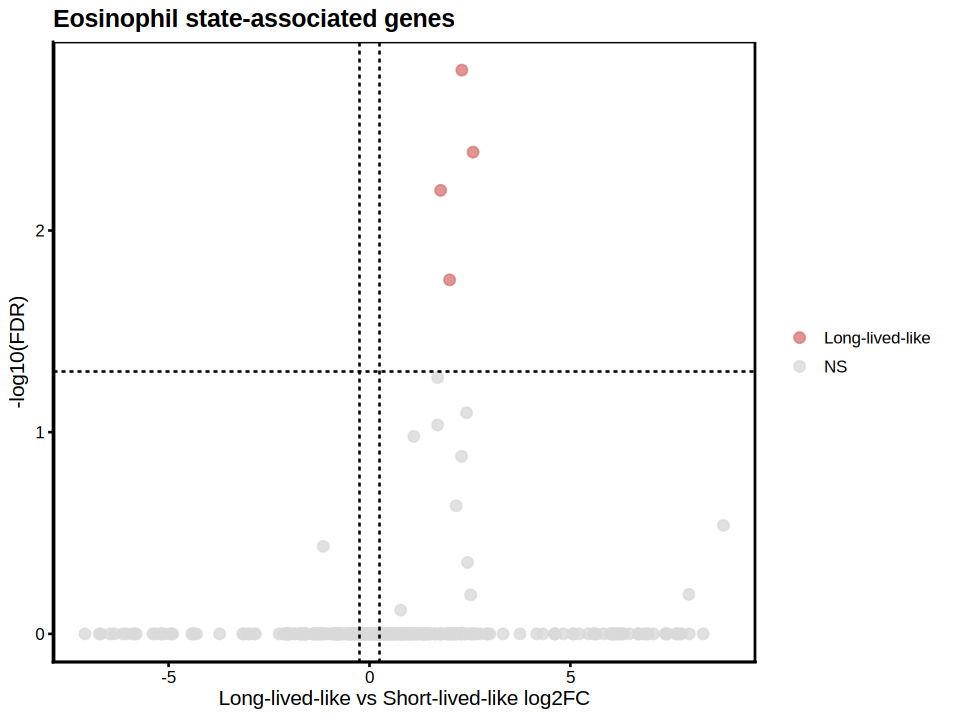

In [130]:
eos_long_vs_short <- eos_long_vs_short %>%
  dplyr::mutate(
    direction = dplyr::case_when(
      avg_log2FC >= 0.25 &
        p_val_adj < 0.05 ~ "Long-lived-like",

      avg_log2FC <= -0.25 &
        p_val_adj < 0.05 ~ "Short-lived-like",

      TRUE ~ "NS"
    )
  )

volcano_cols <- c(
  "Long-lived-like"  = "#D97A7A",
  "Short-lived-like" = "#5B8DB8",
  "NS"               = "#D9D9D9"
)

ggplot(
  eos_long_vs_short,
  aes(
    x = avg_log2FC,
    y = -log10(pmax(p_val_adj, 1e-300)),
    colour = direction
  )
) +
  geom_point(
    size = 2.5,
    alpha = 0.8
  ) +
  geom_vline(
    xintercept = c(-0.25, 0.25),
    linetype = 2
  ) +
  geom_hline(
    yintercept = -log10(0.05),
    linetype = 2
  ) +
  scale_colour_manual(
    values = volcano_cols
  ) +
  labs(
    x = "Long-lived-like vs Short-lived-like log2FC",
    y = "-log10(FDR)",
    colour = NULL,
    title = "Eosinophil state-associated genes"
  ) +
  theme_cell()

In [163]:
DEList1 = read.csv("/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Lab_members/Yanan_Hu/YNH_Xenium/eos_Fat_new_markers_1204.csv")
DEList1 = DEList1[DEList1$cluster == 0,]
DEList2 = read.csv("/dssg/home/acct-svetoslav_chakarov/svetoslav_chakarov/Lab_members/Yanan_Hu/YNH_Xenium/fats_DEG-limma DEG.csv")
# DEList2 = DEList2[DEList2$Grp == 0,]

In [149]:
print(dim(DEList1))

[1] 1396    7


In [156]:
print(dim(DEList2))

[1] 11055    13


In [134]:
head(DEList1, n=2)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
1,0.00000e+00,-3.7096954,0.216,0.796,0.000000e+00,0,Retnlg
2,2.38385e-116,-0.8431252,0.779,0.937,5.915761e-112,0,Nfkbia


In [135]:
head(DEList2, n=2)

,X,logFC,AveExpr,t,P.Value,adj.P.Val,B,Symbol,Grp,Exp.Mean.0,Exp.Per.0,Exp.Mean.1,Exp.Per.1
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
1,Retnla,1.1903136,1.610515,18.73977,1.083802e-75,2.988405e-72,158.2497,Retnla,0,1.969115,0.4756677,0.7788012,0.2381280
2,mt-Nd1,0.9997852,2.708106,21.54368,2.309937e-98,2.866170e-94,210.3352,mt-Nd1,0,3.009306,0.8462908,2.0095211,0.6386786


In [141]:
dim(eos_long_vs_short)

[1] 379  10

In [150]:
intersect(eos_long_vs_short$Gene, DEList1$gene)

[1] "Alox5ap" "Ccl9"    "Retnla"  "C5ar1"   "Rac2"    "Runx2"   "Rsad2"  
 [8] "Prg2"    "Pglyrp1" "Satb1"   "Emb"     "Mmp9"    "Mgll"    "Il1r2"  
[15] "Tmem147" "Anxa2"   "Cybb"    "Laptm5"

In [153]:
options(repr.plot.width=6, repr.plot.height=6)

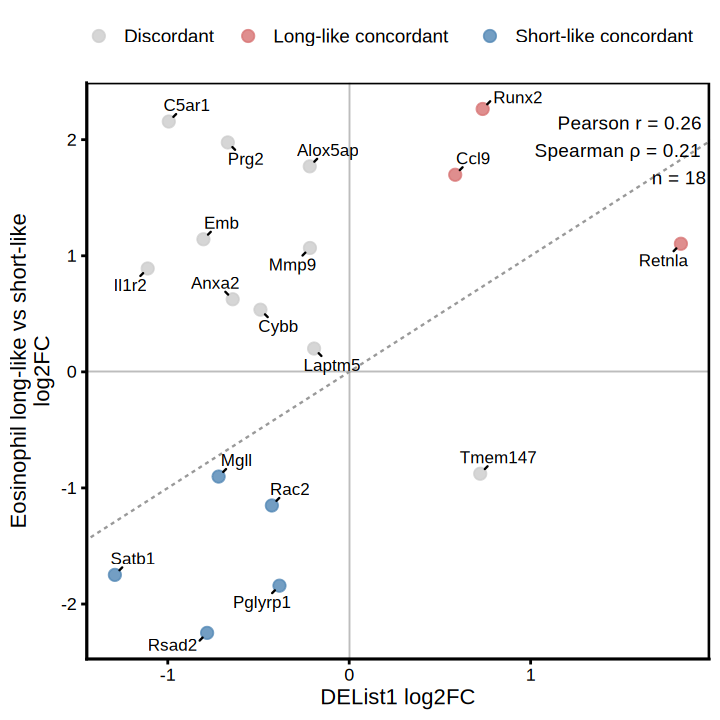

In [154]:
library(dplyr)
library(ggplot2)
library(ggrepel)


# ============================================================
# Prepare plotting dataframe
# ============================================================

scatter_df <- eos_long_vs_short %>%
  dplyr::select(
    Gene,
    Eos_log2FC = avg_log2FC
  ) %>%
  inner_join(
    DEList1 %>%
      dplyr::select(
        gene,
        DEList1_log2FC = avg_log2FC
      ),
    by = c("Gene" = "gene")
  ) %>%
  mutate(
    Concordance = case_when(

      Eos_log2FC > 0 &
        DEList1_log2FC > 0 ~
        "Long-like concordant",

      Eos_log2FC < 0 &
        DEList1_log2FC < 0 ~
        "Short-like concordant",

      TRUE ~
        "Discordant"
    ),

    label_score =
      abs(Eos_log2FC) +
      abs(DEList1_log2FC)
  )


# ============================================================
# Select genes to label
# ============================================================

label_df <- scatter_df %>%
  arrange(
    desc(label_score)
  ) %>%
  slice_head(
    n = 40
  )


# ============================================================
# Correlation
# ============================================================

r_p <- cor(
  scatter_df$Eos_log2FC,
  scatter_df$DEList1_log2FC,
  method = "pearson"
)

r_s <- cor(
  scatter_df$Eos_log2FC,
  scatter_df$DEList1_log2FC,
  method = "spearman"
)


# ============================================================
# Macaron colors
# ============================================================

scatter_cols <- c(

  "Long-like concordant" =
    "#D97A7A",

  "Short-like concordant" =
    "#5B8DB8",

  "Discordant" =
    "#CFCFCF"
)



# ============================================================
# Cell-style scatter
# ============================================================

p_logFC_scatter <- ggplot(
  scatter_df,
  aes(
    x = DEList1_log2FC,
    y = Eos_log2FC,
    colour = Concordance
  )
) +

  geom_hline(
    yintercept = 0,
    linewidth = 0.4,
    colour = "#BDBDBD"
  ) +

  geom_vline(
    xintercept = 0,
    linewidth = 0.4,
    colour = "#BDBDBD"
  ) +

  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = 2,
    linewidth = 0.5,
    colour = "#999999"
  ) +

  geom_point(
    size = 2.8,
    alpha = 0.85
  ) +

  geom_text_repel(
    data = label_df,

    aes(
      label = Gene
    ),

    size = 3.5,

    colour = "black",

    box.padding = 0.35,

    point.padding = 0.2,

    max.overlaps = Inf,

    min.segment.length = 0
  ) +

  scale_colour_manual(
    values = scatter_cols
  ) +

  annotate(
    "text",

    x = Inf,

    y = Inf,

    hjust = 1.05,

    vjust = 1.5,

    label = paste0(
      "Pearson r = ",
      round(r_p, 2),
      "\nSpearman ρ = ",
      round(r_s, 2),
      "\nn = ",
      nrow(scatter_df)
    ),

    size = 4
  ) +

  labs(

    x =
      "DEList1 log2FC",

    y =
      "Eosinophil long-like vs short-like\nlog2FC",

    colour = NULL

  ) +

  theme_cell(base_size = 13) +

  theme(

    legend.position = "top",

    legend.text = element_text(
      size = 11
    )

  )


p_logFC_scatter

In [164]:
library(dplyr)
library(ggplot2)
library(ggrepel)

# ============================================================
# 1. Prepare DEList2
# ============================================================

DEList2_use <- DEList2 %>%
  dplyr::mutate(
    gene_plot = dplyr::case_when(
      !is.na(Symbol) & Symbol != "" ~ as.character(Symbol),
      !is.na(X) & X != "" ~ as.character(X),
      TRUE ~ NA_character_
    )
  ) %>%
  dplyr::filter(
    !is.na(gene_plot)
  ) %>%
  dplyr::distinct(
    gene_plot,
    .keep_all = TRUE
  )


# ============================================================
# 2. Merge with eos_long_vs_short
# ============================================================

scatter_df2 <- eos_long_vs_short %>%
  dplyr::select(
    Gene,
    Eos_log2FC = avg_log2FC
  ) %>%
  dplyr::inner_join(
    DEList2_use %>%
      dplyr::select(
        gene_plot,
        DEList2_log2FC = logFC
      ),
    by = c("Gene" = "gene_plot")
  )

nrow(scatter_df2)
head(scatter_df2)

[1] 337

,Gene,Eos_log2FC,DEList2_log2FC
,<chr>,<dbl>,<dbl>
1,F13a1,2.299372,0.004607317
2,Clec4a3,2.577516,0.009692967
3,Alox5ap,1.770363,-0.261456755
4,Cfh,1.995594,0.014004523
5,Ccl9,1.697871,0.748172882
6,Folr2,2.415921,0.003138138


In [165]:
scatter_df2 <- scatter_df2 %>%
  dplyr::mutate(
    Concordance = dplyr::case_when(

      Eos_log2FC > 0 &
        DEList2_log2FC > 0 ~
        "Long-like concordant",

      Eos_log2FC < 0 &
        DEList2_log2FC < 0 ~
        "Short-like concordant",

      TRUE ~
        "Discordant"
    ),

    label_score =
      abs(Eos_log2FC) +
      abs(DEList2_log2FC)
  )

In [186]:
scatter_df2$DEList2_log2FC_cap <- pmax(
  pmin(
    scatter_df2$DEList2_log2FC,
    0.01
  ),
  -0.01
)

In [191]:
label_df2 <- scatter_df2 %>%
  dplyr::filter(
    Concordance != "Discordant"
  ) %>%
  dplyr::arrange(
    dplyr::desc(label_score)
  ) %>%
  dplyr::slice_head(
    n = 40
  )

In [167]:
r_p2 <- cor(
  scatter_df2$Eos_log2FC,
  scatter_df2$DEList2_log2FC,
  method = "pearson",
  use = "complete.obs"
)

r_s2 <- cor(
  scatter_df2$Eos_log2FC,
  scatter_df2$DEList2_log2FC,
  method = "spearman",
  use = "complete.obs"
)

In [189]:
options(repr.plot.width=8, repr.plot.height=8)

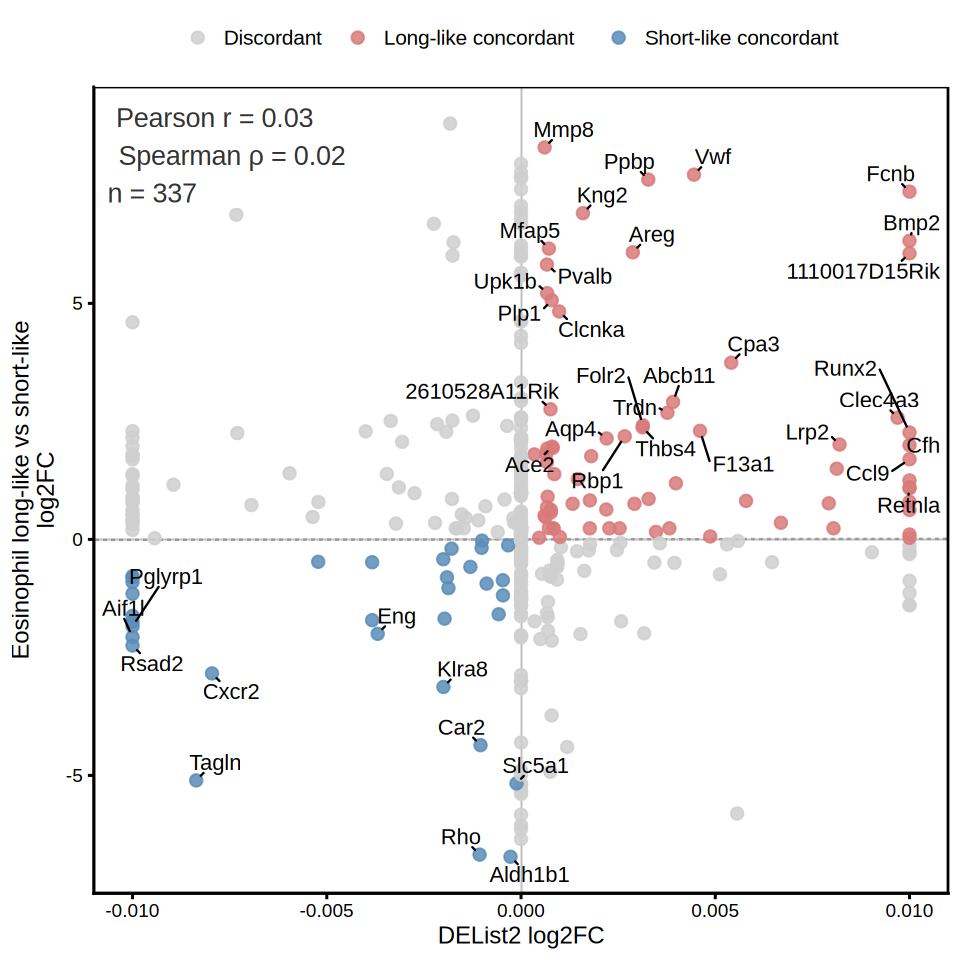

In [211]:
scatter_cols2 <- c(
  "Long-like concordant"  = "#D97A7A",
  "Short-like concordant" = "#5B8DB8",
  "Discordant"            = "#CFCFCF"
)

p_logFC_scatter_DEList2 <- ggplot(
  scatter_df2,
  aes(
    x = DEList2_log2FC_cap,
    y = Eos_log2FC,
    colour = Concordance
  )
) +

  geom_hline(
    yintercept = 0,
    linewidth = 0.4,
    colour = "#BDBDBD"
  ) +

  geom_vline(
    xintercept = 0,
    linewidth = 0.4,
    colour = "#BDBDBD"
  ) +

  geom_abline(
    slope = 1,
    intercept = 0,
    linetype = 2,
    linewidth = 0.5,
    colour = "#999999"
  ) +

  geom_point(
    size = 2.8,
    alpha = 0.85
  ) +

  ggrepel::geom_text_repel(
    data = label_df2,
    aes(label = Gene),
    size = 4.5,
    colour = "black",
    box.padding = 0.35,
    point.padding = 0.2,
    max.overlaps = Inf,
    min.segment.length = 0
  ) +

  scale_colour_manual(
    values = scatter_cols2
  ) +

annotate(
  "label",
  x = -Inf,
  y = Inf,
  hjust = -0.08,
  vjust = 1.15,
  label = paste0(
    "Pearson r = ", sprintf("%.2f", r_p2),
    "\nSpearman \u03c1 = ", sprintf("%.2f", r_s2),
    "\nn = ", nrow(scatter_df2)
  ),
  size = 5.5,
  colour = "#333333",
  fill = "white",
  linewidth = 0,
  label.padding = unit(0.18, "lines")
)+

  labs(
    x = "DEList2 log2FC",
    y = "Eosinophil long-like vs short-like\nlog2FC",
    colour = NULL
  ) +

  theme_cell(base_size = 14) +

  theme(
    legend.position = "top",
    legend.text = element_text(size = 12)
  ) 

p_logFC_scatter_DEList2

- Red / Long-like: Tissue adaptation, repair, ECM remodeling (Areg/Retnla)
- Blue / Short-like: Granulocyte recruitment, innate/inflammatory activity (Pglyrp1/Cxcr2/Rsad2)

In [132]:
saveRDS(eos_obj, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_eos.rds")))

In [212]:
library(Seurat)
library(dplyr)
library(tidyr)
library(ggplot2)
library(FNN)
library(purrr)
library(tibble)

# ============================================================
# Settings
# ============================================================

celltype_col <- "Final_CellType_subtype"

state_col   <- "EosState_extreme"
balance_col <- "EosState_balance"

short_name <- "Short-lived-like"
long_name  <- "Long-lived-like"

state_cols <- c(
  "Short-lived-like" = "#5B8DB8",
  "Intermediate"     = "#F6D6A8",
  "Long-lived-like"  = "#D97A7A"
)

if (!exists("theme_cell")) {
  theme_cell <- function(base_size = 12) {
    theme_classic(base_size = base_size) +
      theme(
        panel.border = element_rect(
          colour = "black",
          fill = NA,
          linewidth = 0.8
        ),
        axis.line = element_line(
          colour = "black",
          linewidth = 0.6
        ),
        axis.text = element_text(colour = "black"),
        axis.title = element_text(colour = "black"),
        legend.title = element_text(face = "bold"),
        plot.title = element_text(face = "bold")
      )
  }
}


Attaching package: ‘purrr’


The following object is masked _by_ ‘.GlobalEnv’:

    %||%


The following object is masked from ‘package:mclust’:

    map




In [213]:
# ============================================================
# Spatial coordinates
# ============================================================

coords <- GetTissueCoordinates(
  region_spatial[["fov"]],
  which = "centroids"
) %>%
  as.data.frame()

# Check coordinate columns
colnames(coords)

[1] "x"    "y"    "cell"

In [214]:
if (!"cell" %in% colnames(coords)) {
  coords$cell <- rownames(coords)
}

stopifnot(
  all(c("cell", "x", "y") %in% colnames(coords))
)

md <- region_spatial@meta.data
md$cell <- rownames(md)

coords <- coords %>%
  left_join(
    md,
    by = "cell"
  )

nrow(coords)
table(
  is.na(coords[[celltype_col]])
)

[1] 74364


FALSE 
74364 

In [215]:
# All confirmed Eos with a state balance
eos_all <- coords %>%
  filter(
    !is.na(.data[[balance_col]])
  )

# q10/q90 polarized Eos only
eos_extreme <- eos_all %>%
  filter(
    .data[[state_col]] %in%
      c(short_name, long_name)
  )

table(eos_all[[state_col]])
table(eos_extreme[[state_col]])


Short-lived-like     Intermediate  Long-lived-like 
              40              354               34 


Short-lived-like     Intermediate  Long-lived-like 
              40                0               34 

In [216]:
reference_cells <- coords %>%
  filter(
    !is.na(.data[[celltype_col]]),
    .data[[celltype_col]] != "Eosinophil"
  )

table(reference_cells[[celltype_col]])


                 Adipocyte                        APC 
                     13775                       8840 
                       ASC                          B 
                      3697                      10629 
              Capillary_EC CCR2_inflammatory_Monocyte 
                     12182                        704 
         CCR7_migratory_DC                       cDC1 
                       592                       1285 
                      cDC2            CX3CR1_Monocyte 
                      2704                        914 
                Epithelial                       ILC2 
                       198                         46 
          Inflammatory_Mac               Lymphatic_EC 
                       114                        388 
        LYVE1_resident_Mac                  Mast cell 
                      6376                         47 
               Mesothelial                 Neutrophil 
                       311                         19 
         

                         Spatial coordinates
                                │
                                ▼
                     Each Eosinophil as query
                                │
              ┌─────────────────┴─────────────────┐
              │                                   │
        Distance-based                       Neighborhood-based
              │                                   │
      ┌───────┴────────┐                 ┌────────┴────────┐
      │                │                 │                 │
closest_df      nearest_by_type     neighborhood_comp      │
      │                │                 │                 │
      │          ┌─────┴──────┐          │                 │
      │          │            │          ▼                 │
      │   distance_stats  balance_distance_stats   neighborhood_stats
      │
single nearest
cell identity

### What is the single closest non-Eos cell type?

the single nearest cell - only considers one cell

In [217]:
ref_xy <- as.matrix(
  reference_cells[, c("x", "y")]
)

eos_xy <- as.matrix(
  eos_all[, c("x", "y")]
)

nn1 <- FNN::get.knnx(
  data = ref_xy,
  query = eos_xy,
  k = 1
)

closest_df <- eos_all %>%
  transmute(
    cell,
    EosState = .data[[state_col]],
    EosState_balance = .data[[balance_col]],
    x,
    y
  )

closest_df$closest_cell <- reference_cells$cell[
  nn1$nn.index[, 1]
]

closest_df$closest_type <- reference_cells[[celltype_col]][
  nn1$nn.index[, 1]
]

closest_df$closest_distance <- nn1$nn.dist[, 1]

In [218]:
head(closest_df)

table(
  closest_df$EosState,
  closest_df$closest_type
)

,cell,EosState,EosState_balance,x,y,closest_cell,closest_type,closest_distance
,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
1,aaaeajgo-1,Short-lived-like,-1.1818573,1219.4664,2275.023,aaaeajgo-1,LYVE1_resident_Mac,0
2,aaanlonm-1,Intermediate,0.2519973,1054.9614,2437.707,aaanlonm-1,LYVE1_resident_Mac,0
3,aaboeclp-1,Long-lived-like,0.7754376,965.9816,2461.930,aaboeclp-1,CCR2_inflammatory_Monocyte,0
4,aafbabhb-1,Intermediate,0.3183094,1120.9357,3782.406,aafbabhb-1,LYVE1_resident_Mac,0
5,aandnkao-1,Intermediate,-0.5959122,981.1486,3057.276,aandnkao-1,LYVE1_resident_Mac,0
6,acbjcakg-1,Intermediate,-0.0784982,1270.3639,3392.062,acbjcakg-1,LYVE1_resident_Mac,0


                  
                   Adipocyte APC ASC   B CCR2_inflammatory_Monocyte
  Short-lived-like         0   0   1  18                          0
  Intermediate             6   5  10 105                         17
  Long-lived-like          0   1   1   5                          5
                  
                   CCR7_migratory_DC cDC1 cDC2 CX3CR1_Monocyte Epithelial ILC2
  Short-lived-like                 0    2    2               2          0    0
  Intermediate                     1   12    9              10          1    1
  Long-lived-like                  0    2    0               1          0    0
                  
                   Inflammatory_Mac LYVE1_resident_Mac Neutrophil  NK   T
  Short-lived-like                1                  6          0   5   3
  Intermediate                   17                117          1  14  18
  Long-lived-like                 1                 18          0   0   0
                  
                   TREM2_LAM VSMC γδ T
 

In [220]:
closest_summary <- closest_df %>%
  filter(
    EosState %in%
      c(short_name, long_name)
  ) %>%
  dplyr::count(
    EosState,
    closest_type,
    name = "n"
  ) %>%
  group_by(EosState) %>%
  mutate(
    pct = 100 * n / sum(n)
  ) %>%
  ungroup()

closest_summary

EosState,closest_type,n,pct
<fct>,<chr>,<int>,<dbl>
Short-lived-like,ASC,1,2.500000
Short-lived-like,B,18,45.000000
Short-lived-like,CX3CR1_Monocyte,2,5.000000
Short-lived-like,Inflammatory_Mac,1,2.500000
Short-lived-like,LYVE1_resident_Mac,6,15.000000
Short-lived-like,NK,5,12.500000
Short-lived-like,T,3,7.500000
Short-lived-like,cDC1,2,5.000000
Short-lived-like,cDC2,2,5.000000


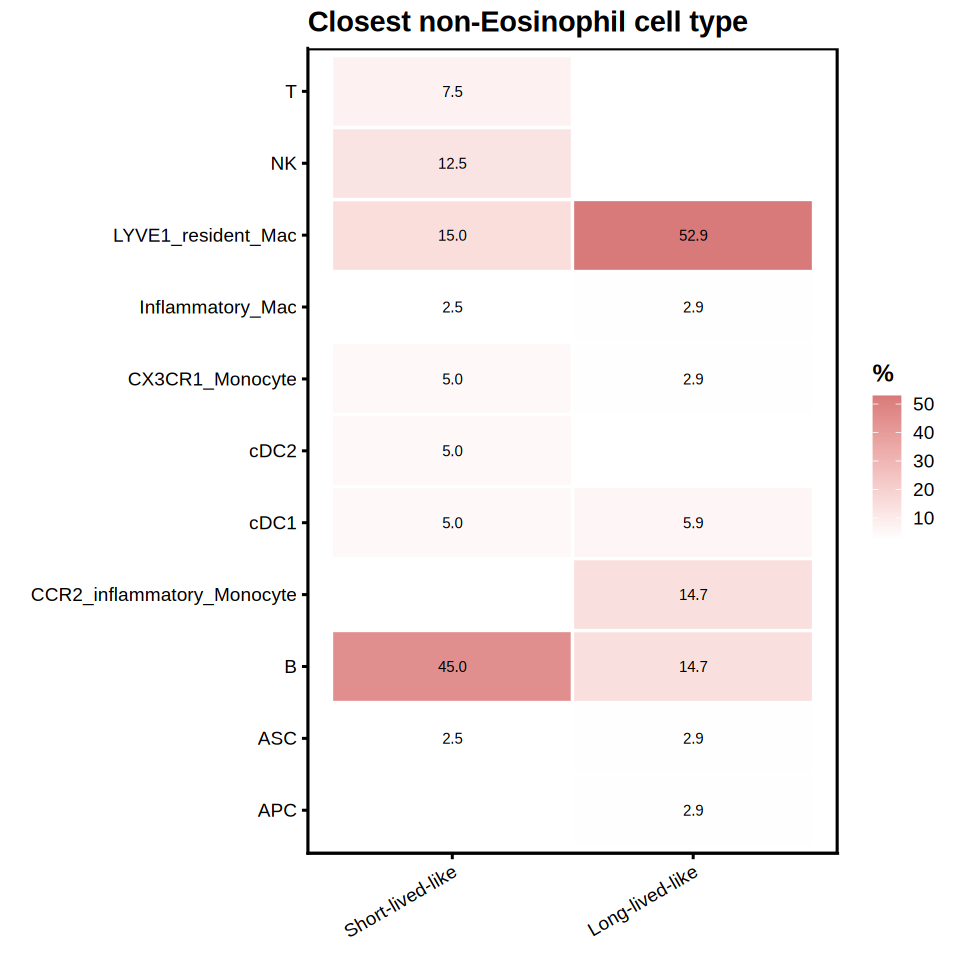

In [223]:
p_closest <- ggplot(
  closest_summary,
  aes(
    x = EosState,
    y = closest_type,
    fill = pct
  )
) +
  geom_tile(
    colour = "white",
    linewidth = 0.7
  ) +
  geom_text(
    aes(
      label = ifelse(pct >= 2, sprintf("%.1f", pct), "")
    ),
    size = 3
  ) +
  scale_fill_gradient(
    low = "white",
    high = "#D97A7A"
  ) +
  labs(
    x = NULL,
    y = NULL,
    fill = "%",
    title = "Closest non-Eosinophil cell type"
  ) +
  theme_cell(base_size=14) +
  theme(
    axis.text.x = element_text(
      angle = 30,
      hjust = 1
    )
  )

p_closest

### Distance from every Eos to every cell type

nearest cell of every cell type - Do the two extreme Eos states occupy different spatial positions relative to particular cell types? - only uses the extreme groups and therefore discards Intermediate Eos

In [224]:
# ============================================================
# Nearest distance to each cell type
# ============================================================

target_types <- sort(
  unique(
    as.character(
      reference_cells[[celltype_col]]
    )
  )
)

nearest_by_type <- purrr::map_dfr(
  target_types,
  function(ct) {

    target <- reference_cells %>%
      filter(
        .data[[celltype_col]] == ct
      )

    if (nrow(target) < 1) {
      return(NULL)
    }

    nn <- FNN::get.knnx(
      data = as.matrix(
        target[, c("x", "y")]
      ),
      query = as.matrix(
        eos_all[, c("x", "y")]
      ),
      k = 1
    )

    tibble(
      cell = eos_all$cell,
      target_type = ct,
      nearest_distance = nn$nn.dist[, 1]
    )
  }
)

In [225]:
nearest_by_type <- nearest_by_type %>%
  left_join(
    eos_all %>%
      transmute(
        cell,
        EosState = .data[[state_col]],
        EosState_balance = .data[[balance_col]]
      ),
    by = "cell"
  )

In [227]:
distance_stats <- nearest_by_type %>%
  filter(
    EosState %in%
      c(short_name, long_name)
  ) %>%
  group_by(target_type) %>%
  summarise(

    n_short = sum(
      EosState == short_name
    ),

    n_long = sum(
      EosState == long_name
    ),

    median_short = median(
      nearest_distance[
        EosState == short_name
      ],
      na.rm = TRUE
    ),

    median_long = median(
      nearest_distance[
        EosState == long_name
      ],
      na.rm = TRUE
    ),

    delta_distance =
      median_long -
      median_short,

    p_value = wilcox.test(
      nearest_distance[
        EosState == long_name
      ],
      nearest_distance[
        EosState == short_name
      ],
      exact = FALSE
    )$p.value,

    .groups = "drop"
  ) %>%
  mutate(
    FDR = p.adjust(
      p_value,
      method = "BH"
    ),

    direction = case_when(
      delta_distance < 0 ~
        "Closer to Long-like",

      delta_distance > 0 ~
        "Closer to Short-like",

      TRUE ~ "Similar"
    )
  ) %>%
  arrange(delta_distance)

distance_stats

target_type,n_short,n_long,median_short,median_long,delta_distance,p_value,FDR,direction
<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ASC,40,34,183.75431,55.10773,-128.64658,2.214140e-04,1.494544e-03,Closer to Long-like
Adipocyte,40,34,131.20547,36.82406,-94.38141,7.616137e-02,1.082293e-01,Closer to Long-like
LYVE1_resident_Mac,40,34,46.75522,0.00000,-46.75522,9.867518e-04,3.330287e-03,Closer to Long-like
Schwann,40,34,246.19911,212.12304,-34.07606,2.853480e-01,3.134884e-01,Closer to Long-like
Capillary_EC,40,34,49.47505,31.92950,-17.54555,5.399897e-01,5.399897e-01,Closer to Long-like
APC,40,34,45.55573,31.22651,-14.32921,3.131594e-02,5.792100e-02,Closer to Long-like
VSMC,40,34,102.19648,89.09777,-13.09872,4.978302e-01,5.169775e-01,Closer to Long-like
CCR2_inflammatory_Monocyte,40,34,97.51979,86.12435,-11.39543,1.506109e-01,2.033247e-01,Closer to Long-like
Pericyte,40,34,67.92035,87.79141,19.87106,2.902670e-01,3.134884e-01,Closer to Short-like


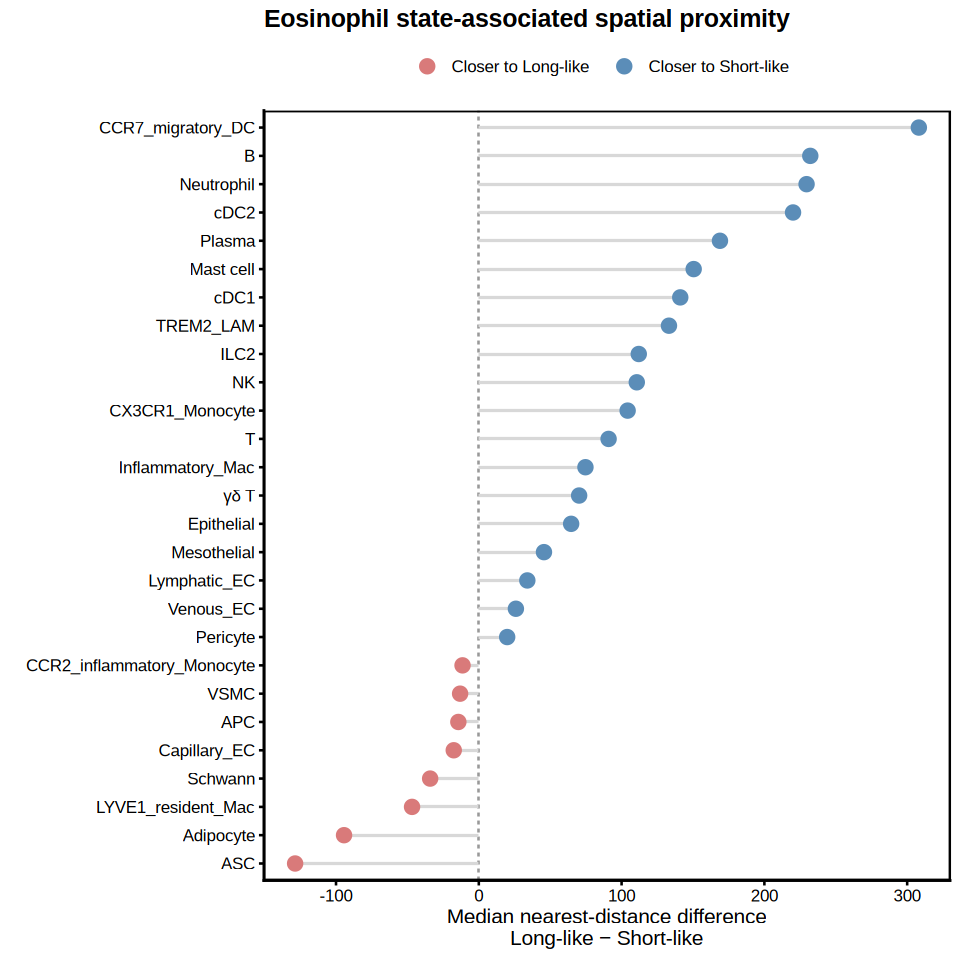

In [228]:
distance_cols <- c(
  "Closer to Long-like"  = "#D97A7A",
  "Closer to Short-like" = "#5B8DB8",
  "Similar"              = "#CFCFCF"
)

p_distance <- ggplot(
  distance_stats,
  aes(
    x = delta_distance,
    y = reorder(
      target_type,
      delta_distance
    ),
    colour = direction
  )
) +
  geom_vline(
    xintercept = 0,
    linetype = 2,
    colour = "#999999"
  ) +
  geom_segment(
    aes(
      x = 0,
      xend = delta_distance,
      yend = target_type
    ),
    colour = "#D8D8D8",
    linewidth = 0.7
  ) +
  geom_point(
    size = 3.5
  ) +
  scale_colour_manual(
    values = distance_cols
  ) +
  labs(
    x = "Median nearest-distance difference\nLong-like − Short-like",
    y = NULL,
    colour = NULL,
    title = "Eosinophil state-associated spatial proximity"
  ) +
  theme_cell() +
  theme(
    legend.position = "top"
  )

p_distance

### Continues EosState_balance vs distance - Primary!

continuous Eos state balance - Does Eosinophil state progressively change as the distance to a given cell type changes? 
Spearman correlation - As Eos become increasingly Long-like, they are progressively closer to venous EC.

In [229]:
balance_distance_stats <- nearest_by_type %>%
  group_by(target_type) %>%
  summarise(

    n = sum(
      complete.cases(
        EosState_balance,
        nearest_distance
      )
    ),

    rho = cor(
      EosState_balance,
      nearest_distance,
      method = "spearman",
      use = "complete.obs"
    ),

    p_value = cor.test(
      EosState_balance,
      nearest_distance,
      method = "spearman",
      exact = FALSE
    )$p.value,

    .groups = "drop"
  ) %>%
  mutate(
    FDR = p.adjust(
      p_value,
      method = "BH"
    ),

    interpretation = case_when(

      rho < 0 ~
        "Closer with Long-like balance",

      rho > 0 ~
        "Closer with Short-like balance",

      TRUE ~
        "No direction"
    )
  ) %>%
  arrange(rho)

balance_distance_stats

target_type,n,rho,p_value,FDR,interpretation
<chr>,<int>,<dbl>,<dbl>,<dbl>,<chr>
LYVE1_resident_Mac,428,-0.24044649,4.806335e-07,2.162851e-06,Closer with Long-like balance
ASC,428,-0.20335601,2.243841e-05,6.058370e-05,Closer with Long-like balance
Adipocyte,428,-0.17676609,2.376150e-04,5.832369e-04,Closer with Long-like balance
Schwann,428,-0.12674900,8.661581e-03,1.230856e-02,Closer with Long-like balance
APC,428,-0.07819850,1.061967e-01,1.246657e-01,Closer with Long-like balance
VSMC,428,-0.06528358,1.776308e-01,1.998347e-01,Closer with Long-like balance
Capillary_EC,428,-0.06213107,1.995418e-01,2.155051e-01,Closer with Long-like balance
CCR2_inflammatory_Monocyte,428,-0.05896399,2.234717e-01,2.320668e-01,Closer with Long-like balance
Pericyte,428,0.01277028,7.922178e-01,7.922178e-01,Closer with Short-like balance


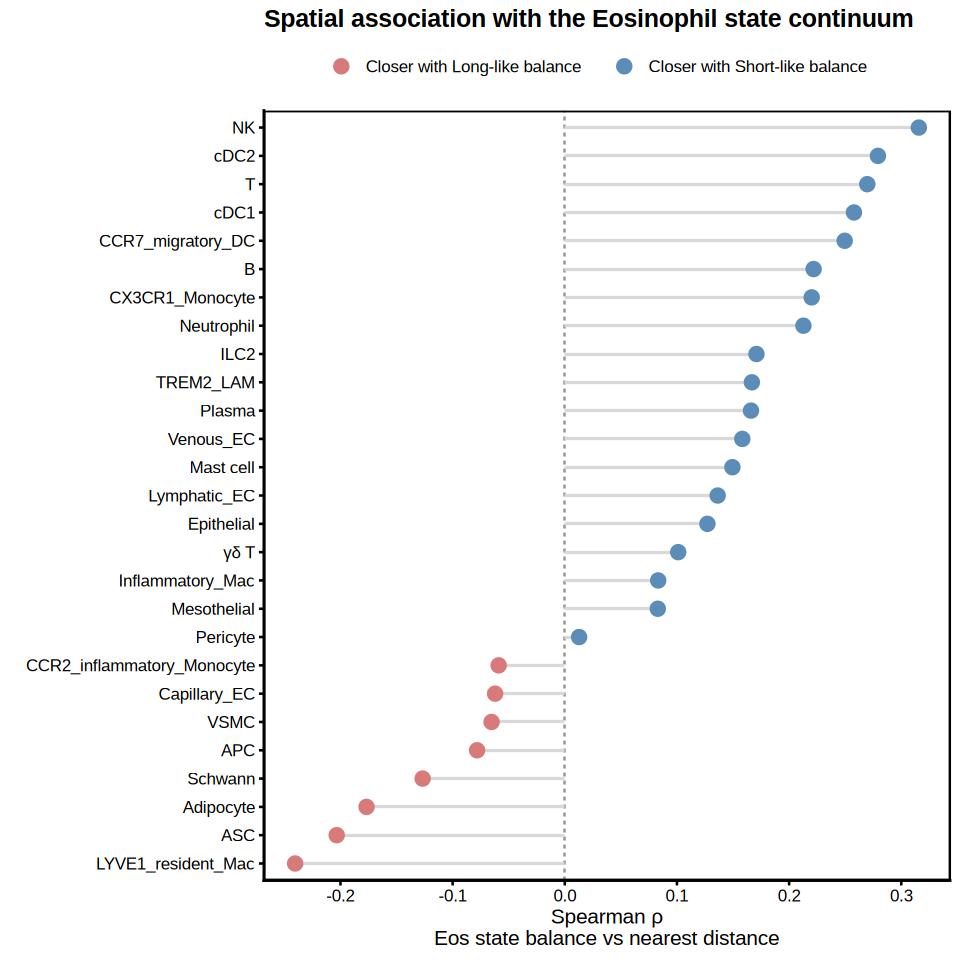

In [230]:
p_balance_distance <- ggplot(
  balance_distance_stats,
  aes(
    x = rho,
    y = reorder(
      target_type,
      rho
    ),
    colour = interpretation
  )
) +
  geom_vline(
    xintercept = 0,
    linetype = 2,
    colour = "#999999"
  ) +
  geom_segment(
    aes(
      x = 0,
      xend = rho,
      yend = target_type
    ),
    colour = "#D8D8D8",
    linewidth = 0.7
  ) +
  geom_point(
    size = 3.5
  ) +
  scale_colour_manual(
    values = c(
      "Closer with Long-like balance" =
        "#D97A7A",

      "Closer with Short-like balance" =
        "#5B8DB8",

      "No direction" =
        "#CFCFCF"
    )
  ) +
  labs(
    x = "Spearman \u03c1\nEos state balance vs nearest distance",
    y = NULL,
    colour = NULL,
    title = "Spatial association with the Eosinophil state continuum"
  ) +
  theme_cell() +
  theme(
    legend.position = "top"
  )

p_balance_distance

`geom_smooth()` using formula = 'y ~ x'


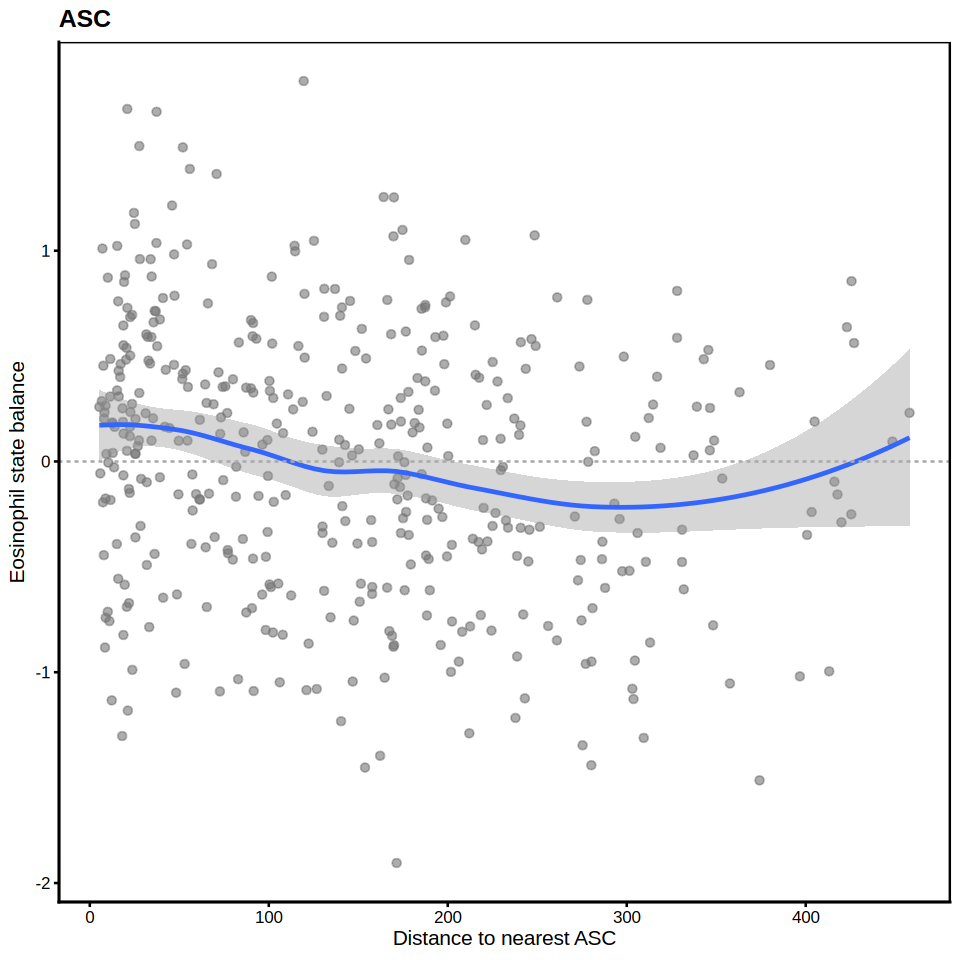

In [231]:
selected_type <- "ASC"

p_one_distance <- nearest_by_type %>%
  filter(
    target_type == selected_type
  ) %>%
  ggplot(
    aes(
      x = nearest_distance,
      y = EosState_balance
    )
  ) +
  geom_point(
    size = 1.8,
    alpha = 0.6,
    colour = "#777777"
  ) +
  geom_smooth(
    method = "loess",
    se = TRUE,
    linewidth = 1
  ) +
  geom_hline(
    yintercept = 0,
    linetype = 2,
    colour = "#AAAAAA"
  ) +
  labs(
    x = paste0(
      "Distance to nearest ",
      selected_type
    ),
    y = "Eosinophil state balance",
    title = selected_type
  ) +
  theme_cell()

p_one_distance

### Local neighborhood composition

composition of the whole local neighborhood - What cell types make up the local neighborhood around each individual Eos?  
Instead of asking: How far away is the nearest ASC?   
Ask: Among the local cells around this Eos, how many are ASC, macrophages, EC, pericytes, etc.?  (k=15)

- neighborhood_comp: gives the neighborhood composition for each individual Eos.
- neighborhood_stats: summarizes those data by state.

In [232]:
# ============================================================
# k-nearest neighborhood
# ============================================================

k_neighbors <- 15

nnk <- FNN::get.knnx(
  data = as.matrix(
    reference_cells[, c("x", "y")]
  ),
  query = as.matrix(
    eos_all[, c("x", "y")]
  ),
  k = k_neighbors
)

In [233]:
neighbor_long <- tibble(

  cell = rep(
    eos_all$cell,
    each = k_neighbors
  ),

  neighbor_rank = rep(
    seq_len(k_neighbors),
    times = nrow(eos_all)
  ),

  neighbor_index = as.vector(
    t(nnk$nn.index)
  ),

  neighbor_distance = as.vector(
    t(nnk$nn.dist)
  )
)

neighbor_long$neighbor_cell <-
  reference_cells$cell[
    neighbor_long$neighbor_index
  ]

neighbor_long$neighbor_type <-
  reference_cells[[celltype_col]][
    neighbor_long$neighbor_index
  ]

In [234]:
neighbor_long <- neighbor_long %>%
  left_join(
    eos_all %>%
      transmute(
        cell,
        EosState = .data[[state_col]],
        EosState_balance = .data[[balance_col]]
      ),
    by = "cell"
  )

In [237]:
neighborhood_comp <- neighbor_long %>%
  dplyr::count(
    cell,
    neighbor_type,
    name = "n_neighbor"
  ) %>%
  complete(
    cell = eos_all$cell,
    neighbor_type = target_types,
    fill = list(
      n_neighbor = 0
    )
  ) %>%
  mutate(
    neighbor_fraction =
      n_neighbor /
      k_neighbors
  ) %>%
  left_join(
    eos_all %>%
      transmute(
        cell,
        EosState = .data[[state_col]],
        EosState_balance = .data[[balance_col]]
      ),
    by = "cell"
  )

In [239]:
neighborhood_stats <- neighborhood_comp %>%
  filter(
    EosState %in%
      c(short_name, long_name)
  ) %>%
  group_by(
    neighbor_type
  ) %>%
  summarise(

    mean_short = mean(
      neighbor_fraction[
        EosState == short_name
      ],
      na.rm = TRUE
    ),

    mean_long = mean(
      neighbor_fraction[
        EosState == long_name
      ],
      na.rm = TRUE
    ),

    delta_fraction =
      mean_long -
      mean_short,

    p_value = wilcox.test(
      neighbor_fraction[
        EosState == long_name
      ],
      neighbor_fraction[
        EosState == short_name
      ],
      exact = FALSE
    )$p.value,

    .groups = "drop"
  ) %>%
  mutate(
    FDR = p.adjust(
      p_value,
      method = "BH"
    ),

    delta_pct =
      100 * delta_fraction,

    enrichment = case_when(

      delta_pct > 0 ~
        "Long-like niche",

      delta_pct < 0 ~
        "Short-like niche",

      TRUE ~
        "Similar"
    )
  ) %>%
  arrange(delta_pct)

neighborhood_stats

neighbor_type,mean_short,mean_long,delta_fraction,p_value,FDR,delta_pct,enrichment
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
B,0.375000000,0.103921569,-0.2710784314,6.690117e-04,0.0046470130,-27.10784314,Short-like niche
cDC2,0.090000000,0.017647059,-0.0723529412,1.054714e-03,0.0052735690,-7.23529412,Short-like niche
T,0.055000000,0.015686275,-0.0393137255,9.884434e-02,0.2059257004,-3.93137255,Short-like niche
CX3CR1_Monocyte,0.026666667,0.007843137,-0.0188235294,1.207543e-01,0.2271420835,-1.88235294,Short-like niche
cDC1,0.035000000,0.017647059,-0.0173529412,8.177612e-02,0.2044403044,-1.73529412,Short-like niche
NK,0.018333333,0.005882353,-0.0124509804,6.814761e-02,0.1991827372,-1.24509804,Short-like niche
Pericyte,0.016666667,0.009803922,-0.0068627451,5.061846e-01,0.6026007688,-0.68627451,Short-like niche
CCR7_migratory_DC,0.006666667,0.001960784,-0.0047058824,3.907925e-01,0.5142006487,-0.47058824,Short-like niche
Schwann,0.003333333,0.000000000,-0.0033333333,3.708736e-01,0.5142006487,-0.33333333,Short-like niche


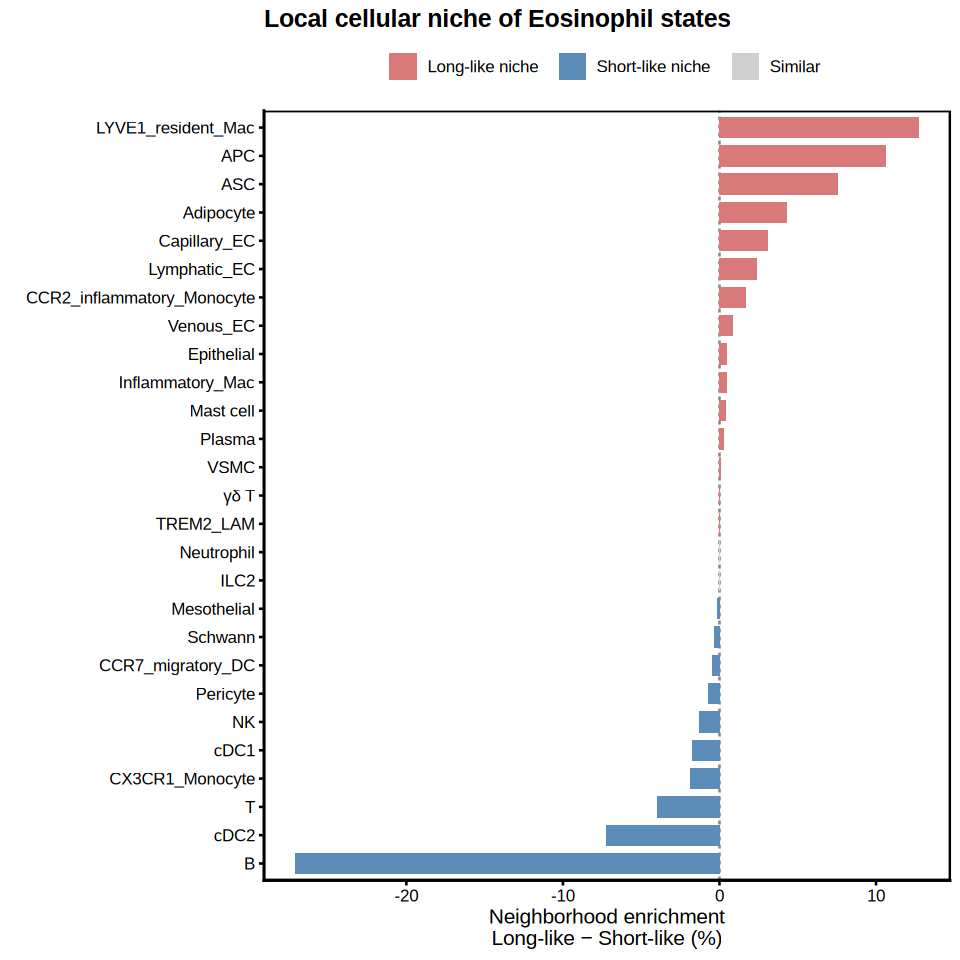

In [240]:
p_neighborhood <- ggplot(
  neighborhood_stats,
  aes(
    x = delta_pct,
    y = reorder(
      neighbor_type,
      delta_pct
    ),
    fill = enrichment
  )
) +
  geom_vline(
    xintercept = 0,
    linetype = 2,
    colour = "#888888"
  ) +
  geom_col(
    width = 0.72
  ) +
  scale_fill_manual(
    values = c(
      "Long-like niche" =
        "#D97A7A",

      "Short-like niche" =
        "#5B8DB8",

      "Similar" =
        "#CFCFCF"
    )
  ) +
  labs(
    x = "Neighborhood enrichment\nLong-like − Short-like (%)",
    y = NULL,
    fill = NULL,
    title = "Local cellular niche of Eosinophil states"
  ) +
  theme_cell() +
  theme(
    legend.position = "top"
  )

p_neighborhood

In [241]:
neighborhood_balance_stats <- neighborhood_comp %>%
  group_by(
    neighbor_type
  ) %>%
  summarise(

    rho = cor(
      EosState_balance,
      neighbor_fraction,
      method = "spearman",
      use = "complete.obs"
    ),

    p_value = cor.test(
      EosState_balance,
      neighbor_fraction,
      method = "spearman",
      exact = FALSE
    )$p.value,

    .groups = "drop"
  ) %>%
  mutate(
    FDR = p.adjust(
      p_value,
      method = "BH"
    )
  ) %>%
  arrange(rho)

neighborhood_balance_stats

neighbor_type,rho,p_value,FDR
<chr>,<dbl>,<dbl>,<dbl>
cDC2,-0.248982101,1.805529e-07,2.437465e-06
B,-0.238089540,6.258444e-07,5.349849e-06
T,-0.171196183,3.741517e-04,1.683682e-03
CCR7_migratory_DC,-0.102660856,3.373158e-02,8.279569e-02
cDC1,-0.100368427,3.793009e-02,8.534270e-02
NK,-0.097399880,4.401772e-02,9.142141e-02
Neutrophil,-0.058164842,2.298205e-01,3.783909e-01
CX3CR1_Monocyte,-0.046345800,3.388099e-01,4.573933e-01
γδ T,-0.022058215,6.490627e-01,7.301955e-01


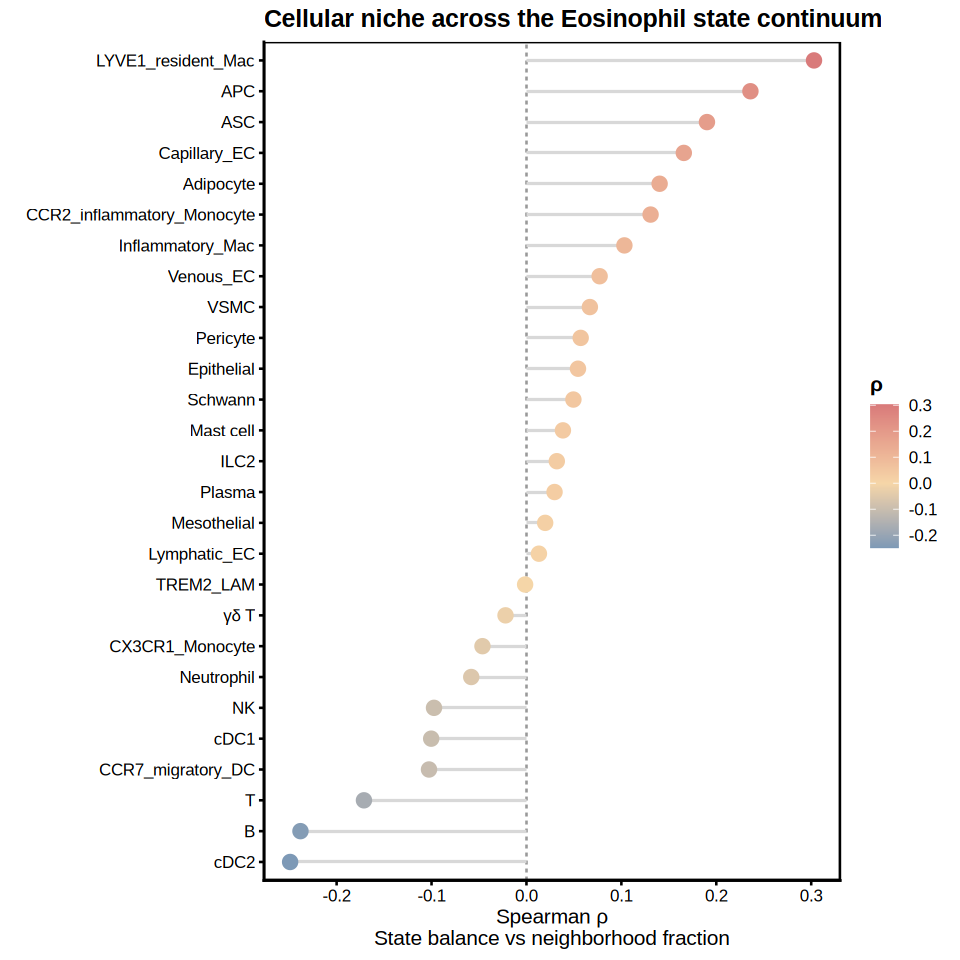

In [242]:
p_neighborhood_balance <- ggplot(
  neighborhood_balance_stats,
  aes(
    x = rho,
    y = reorder(
      neighbor_type,
      rho
    )
  )
) +
  geom_vline(
    xintercept = 0,
    linetype = 2,
    colour = "#999999"
  ) +
  geom_segment(
    aes(
      x = 0,
      xend = rho,
      yend = neighbor_type
    ),
    colour = "#D8D8D8",
    linewidth = 0.7
  ) +
  geom_point(
    aes(
      colour = rho
    ),
    size = 3.5
  ) +
  scale_colour_gradient2(
    low = "#5B8DB8",
    mid = "#F6D6A8",
    high = "#D97A7A",
    midpoint = 0
  ) +
  labs(
    x = "Spearman \u03c1\nState balance vs neighborhood fraction",
    y = NULL,
    colour = "\u03c1",
    title = "Cellular niche across the Eosinophil state continuum"
  ) +
  theme_cell()

p_neighborhood_balance

### Check whether suspicious DE genes are caused by neighboring cells

In [243]:
suspicious_genes <- c(
  "Vwf",
  "Eng",
  "Tagln",
  "Cpa3",
  "Ppbp",
  "Lrp2",
  "Upk1b",
  "Plp1"
)

In [244]:
eos_gene_expr <- FetchData(
  region_spatial,
  vars = suspicious_genes,
  layer = "counts"
)

eos_gene_expr$cell <- rownames(
  eos_gene_expr
)

eos_gene_expr <- eos_gene_expr %>%
  filter(
    cell %in% eos_all$cell
  )

In [245]:
endo_types <- c(
  "Capillary_EC",
  "Arterial_EC",
  "Venous_EC",
  "Lymphatic_EC"
)

eos_endo_distance <- nearest_by_type %>%
  filter(
    target_type %in%
      endo_types
  ) %>%
  group_by(cell) %>%
  summarise(
    nearest_Endo =
      min(
        nearest_distance,
        na.rm = TRUE
      ),
    .groups = "drop"
  )

In [246]:
vwf_check <- eos_gene_expr %>%
  select(
    cell,
    Vwf,
    Eng
  ) %>%
  left_join(
    eos_endo_distance,
    by = "cell"
  )

cor.test(
  vwf_check$Vwf,
  vwf_check$nearest_Endo,
  method = "spearman",
  exact = FALSE
)


	Spearman's rank correlation rho

data:  vwf_check$Vwf and vwf_check$nearest_Endo
S = 13369821, p-value = 0.6326
alternative hypothesis: true rho is not equal to 0
sample estimates:
        rho 
-0.02317024 


### Spatially constrained ligand-receptor analysis

In [247]:
library(CellChat)

data(CellChatDB.mouse)

panel_genes <- rownames(
  region_spatial[["Xenium"]]
)

lr_db <- CellChatDB.mouse$interaction

Loading required package: igraph


Attaching package: ‘igraph’


The following objects are masked from ‘package:purrr’:

    compose, simplify


The following object is masked from ‘package:FNN’:

    knn


The following object is masked from ‘package:circlize’:

    degree


The following object is masked from ‘package:tibble’:

    as_data_frame


The following object is masked from ‘package:tidyr’:

    crossing


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following object is masked from ‘package:Seurat’:

    components


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union




In [248]:
colnames(lr_db)
head(lr_db)

[1] "interaction_name"         "pathway_name"            
 [3] "ligand"                   "receptor"                
 [5] "agonist"                  "antagonist"              
 [7] "co_A_receptor"            "co_I_receptor"           
 [9] "annotation"               "interaction_name_2"      
[11] "evidence"                 "is_neurotransmitter"     
[13] "ligand.symbol"            "ligand.family"           
[15] "ligand.location"          "ligand.keyword"          
[17] "ligand.secreted_type"     "ligand.transmembrane"    
[19] "receptor.symbol"          "receptor.family"         
[21] "receptor.location"        "receptor.keyword"        
[23] "receptor.surfaceome_main" "receptor.surfaceome_sub" 
[25] "receptor.adhesome"        "receptor.secreted_type"  
[27] "receptor.transmembrane"   "version"

,interaction_name,pathway_name,ligand,receptor,agonist,antagonist,co_A_receptor,co_I_receptor,annotation,interaction_name_2,⋯,receptor.symbol,receptor.family,receptor.location,receptor.keyword,receptor.surfaceome_main,receptor.surfaceome_sub,receptor.adhesome,receptor.secreted_type,receptor.transmembrane,version
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
TGFB1_TGFBR1_TGFBR2,TGFB1_TGFBR1_TGFBR2,TGFb,Tgfb1,TGFbR1_R2,TGFb agonist,TGFb antagonist,,TGFb inhibition receptor,Secreted Signaling,Tgfb1 - (Tgfbr1+Tgfbr2),⋯,"Tgfbr1, Tgfbr2","Protein kinase superfamily, TKL Ser/Thr protein kinase","Cell membrane, Secreted, Membrane raft, Cell surface, Cell junction, Tight junction","Membrane, Secreted, Disulfide bond, Kinase, Transmembrane, Differentiation, ATP-binding, Receptor, Alternative splicing, Aortic aneurysm, Transferase, Glycoprotein, Manganese, Disease variant, Growth regulation, Signal, Reference proteome, Metal-binding, Transmembrane helix, Hereditary nonpolyposis colorectal cancer, Cell membrane, Phosphoprotein, Direct protein sequencing, Apoptosis, Craniosynostosis, Serine/threonine-protein kinase, 3D-structure, Nucleotide-binding, Magnesium, Tight junction, Isopeptide bond, Cell junction, Ubl conjugation",Receptors,Act.TGFB;Kinase,,,TRUE,CellChatDB v1
TGFB2_TGFBR1_TGFBR2,TGFB2_TGFBR1_TGFBR2,TGFb,Tgfb2,TGFbR1_R2,TGFb agonist,TGFb antagonist,,TGFb inhibition receptor,Secreted Signaling,Tgfb2 - (Tgfbr1+Tgfbr2),⋯,"Tgfbr1, Tgfbr2","Protein kinase superfamily, TKL Ser/Thr protein kinase","Cell membrane, Secreted, Membrane raft, Cell surface, Cell junction, Tight junction","Membrane, Secreted, Disulfide bond, Kinase, Transmembrane, Differentiation, ATP-binding, Receptor, Alternative splicing, Aortic aneurysm, Transferase, Glycoprotein, Manganese, Disease variant, Growth regulation, Signal, Reference proteome, Metal-binding, Transmembrane helix, Hereditary nonpolyposis colorectal cancer, Cell membrane, Phosphoprotein, Direct protein sequencing, Apoptosis, Craniosynostosis, Serine/threonine-protein kinase, 3D-structure, Nucleotide-binding, Magnesium, Tight junction, Isopeptide bond, Cell junction, Ubl conjugation",Receptors,Act.TGFB;Kinase,,,TRUE,CellChatDB v1
TGFB3_TGFBR1_TGFBR2,TGFB3_TGFBR1_TGFBR2,TGFb,Tgfb3,TGFbR1_R2,TGFb agonist,TGFb antagonist,,TGFb inhibition receptor,Secreted Signaling,Tgfb3 - (Tgfbr1+Tgfbr2),⋯,"Tgfbr1, Tgfbr2","Protein kinase superfamily, TKL Ser/Thr protein kinase","Cell membrane, Secreted, Membrane raft, Cell surface, Cell junction, Tight junction","Membrane, Secreted, Disulfide bond, Kinase, Transmembrane, Differentiation, ATP-binding, Receptor, Alternative splicing, Aortic aneurysm, Transferase, Glycoprotein, Manganese, Disease variant, Growth regulation, Signal, Reference proteome, Metal-binding, Transmembrane helix, Hereditary nonpolyposis colorectal cancer, Cell membrane, Phosphoprotein, Direct protein sequencing, Apoptosis, Craniosynostosis, Serine/threonine-protein kinase, 3D-structure, Nucleotide-binding, Magnesium, Tight junction, Isopeptide bond, Cell junction, Ubl conjugation",Receptors,Act.TGFB;Kinase,,,TRUE,CellChatDB v1
TGFB1_ACVR1B_TGFBR2,TGFB1_ACVR1B_TGFBR2,TGFb,Tgfb1,ACVR1B_TGFbR2,TGFb agonist,TGFb antagonist,,TGFb inhibition receptor,Secreted Signaling,Tgfb1 - (Acvr1b+Tgfbr2),⋯,"Acvr1b, Tgfbr2","Protein kinase superfamily, TKL Ser/Thr protein kinase","Cell membrane, Secreted, Membrane raft","Membrane, Secreted, Disulfide bond, Kinase, Transmembrane, Differentiation, ATP-binding, Receptor, Alternative splicing, Aortic aneurysm, Transferase, Glycoprotein, Manganese, Disease variant, Growth regulation, Signal, Reference proteome, Metal-binding, Transmembrane helix, Hereditary nonpolyposis colorectal cancer, Cell membrane, Phosphoprotein, Direct protein sequencing, Apoptosis, Craniosynostosis, Serine/threonine-protein kinase, 3D-structure, Nucleotide-binding, Magnesium, Ubl conjugation",Receptors,Act.TGFB;Kinase,,

In [249]:
lr_simple <- lr_db %>%
  filter(
    ligand %in% panel_genes,
    receptor %in% panel_genes
  ) %>%
  transmute(
    interaction_name,
    pathway_name,
    ligand,
    receptor
  ) %>%
  distinct()

nrow(lr_simple)

lr_simple

[1] 21

,interaction_name,pathway_name,ligand,receptor
,<chr>,<chr>,<chr>,<chr>
CCL6_CCR3,CCL6_CCR3,CCL,Ccl6,Ccr3
CXCL2_CXCR2,CXCL2_CXCR2,CXCL,Cxcl2,Cxcr2
PPBP_CXCR2,PPBP_CXCR2,CXCL,Ppbp,Cxcr2
PTN_SDC1,PTN_SDC1,PTN,Ptn,Sdc1
HC_C5AR1,HC_C5AR1,COMPLEMENT,Hc,C5ar1
SCGB3A2_MARCO,SCGB3A2_MARCO,UGRP1,Scgb3a2,Marco
COL2A1_CD44,COL2A1_CD44,COLLAGEN,Col2a1,Cd44
COL2A1_SDC1,COL2A1_SDC1,COLLAGEN,Col2a1,Sdc1
THBS1_SDC1,THBS1_SDC1,THBS,Thbs1,Sdc1


In [250]:
DefaultAssay(region_spatial) <- "Xenium"

expr <- GetAssayData(
  region_spatial,
  assay = "Xenium",
  layer = "data"
)

lr_genes <- intersect(
  unique(
    c(
      lr_simple$ligand,
      lr_simple$receptor
    )
  ),
  rownames(expr)
)

length(lr_genes)

[1] 23

In [251]:
spatial_edges <- neighbor_long %>%
  filter(
    EosState %in%
      c(
        short_name,
        long_name
      )
  )

In [252]:
eos_idx <- match(
  spatial_edges$cell,
  colnames(expr)
)

neighbor_idx <- match(
  spatial_edges$neighbor_cell,
  colnames(expr)
)

stopifnot(
  !any(is.na(eos_idx)),
  !any(is.na(neighbor_idx))
)

In [253]:
lr_edge_scores <- purrr::map_dfr(
  seq_len(
    nrow(lr_simple)
  ),
  function(i) {

    lig <- lr_simple$ligand[i]
    rec <- lr_simple$receptor[i]

    # Eos ligand -> neighboring cell receptor
    eos_to_neighbor <- tibble(

      eos_cell =
        spatial_edges$cell,

      EosState =
        spatial_edges$EosState,

      neighbor_type =
        spatial_edges$neighbor_type,

      interaction =
        lr_simple$interaction_name[i],

      pathway =
        lr_simple$pathway_name[i],

      ligand = lig,

      receptor = rec,

      direction =
        "Eos -> Neighbor",

      LR_score =
        as.numeric(
          expr[
            lig,
            eos_idx
          ]
        ) *
        as.numeric(
          expr[
            rec,
            neighbor_idx
          ]
        )
    )

    # neighboring cell ligand -> Eos receptor
    neighbor_to_eos <- tibble(

      eos_cell =
        spatial_edges$cell,

      EosState =
        spatial_edges$EosState,

      neighbor_type =
        spatial_edges$neighbor_type,

      interaction =
        lr_simple$interaction_name[i],

      pathway =
        lr_simple$pathway_name[i],

      ligand = lig,

      receptor = rec,

      direction =
        "Neighbor -> Eos",

      LR_score =
        as.numeric(
          expr[
            lig,
            neighbor_idx
          ]
        ) *
        as.numeric(
          expr[
            rec,
            eos_idx
          ]
        )
    )

    bind_rows(
      eos_to_neighbor,
      neighbor_to_eos
    )
  }
)

In [254]:
lr_by_eos <- lr_edge_scores %>%
  group_by(
    eos_cell,
    EosState,
    neighbor_type,
    direction,
    pathway,
    interaction,
    ligand,
    receptor
  ) %>%
  summarise(
    LR_score = mean(
      LR_score,
      na.rm = TRUE
    ),
    .groups = "drop"
  )

In [255]:
lr_state_compare <- lr_by_eos %>%
  group_by(
    neighbor_type,
    direction,
    pathway,
    interaction,
    ligand,
    receptor
  ) %>%
  summarise(

    n_long = sum(
      EosState == long_name
    ),

    n_short = sum(
      EosState == short_name
    ),

    mean_long = mean(
      LR_score[
        EosState == long_name
      ],
      na.rm = TRUE
    ),

    mean_short = mean(
      LR_score[
        EosState == short_name
      ],
      na.rm = TRUE
    ),

    delta_score =
      mean_long -
      mean_short,

    .groups = "drop"
  ) %>%
  filter(
    n_long >= 5,
    n_short >= 5
  ) %>%
  arrange(
    desc(
      abs(delta_score)
    )
  )

head(
  lr_state_compare,
  30
)

neighbor_type,direction,pathway,interaction,ligand,receptor,n_long,n_short,mean_long,mean_short,delta_score
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>
Venous_EC,Eos -> Neighbor,THBS,THBS4_CD36,Thbs4,Cd36,9,6,6.2422530,0.000000,6.242253
Pericyte,Eos -> Neighbor,THBS,THBS1_CD36,Thbs1,Cd36,5,8,0.0000000,5.049550,-5.049550
Capillary_EC,Eos -> Neighbor,THBS,THBS1_CD36,Thbs1,Cd36,22,14,0.0000000,4.834208,-4.834208
CCR2_inflammatory_Monocyte,Neighbor -> Eos,CCL,CCL6_CCR3,Ccl6,Ccr3,13,8,7.9009800,3.069780,4.831200
LYVE1_resident_Mac,Eos -> Neighbor,THBS,THBS1_CD36,Thbs1,Cd36,28,13,0.0000000,4.638554,-4.638554
Pericyte,Neighbor -> Eos,THBS,THBS1_CD36,Thbs1,Cd36,5,8,4.3418459,0.000000,4.341846
Adipocyte,Eos -> Neighbor,THBS,THBS1_CD36,Thbs1,Cd36,21,15,0.0000000,4.255394,-4.255394
LYVE1_resident_Mac,Eos -> Neighbor,THBS,THBS1_CD47,Thbs1,Cd47,28,13,0.0000000,3.836711,-3.836711
cDC1,Neighbor -> Eos,THBS,COMP_CD36,Comp,Cd36,5,13,3.7948772,0.000000,3.794877


In [258]:
top_lr <- lr_state_compare %>%
  slice_max(
    order_by = abs(delta_score),
    n = 25
  ) %>%
  mutate(
    LR_label = paste0(
      ligand, " → ", receptor,
      "\n", neighbor_type,
      " | ", direction
    )
  )

In [260]:
options(repr.plot.width=15, repr.plot.height=8)

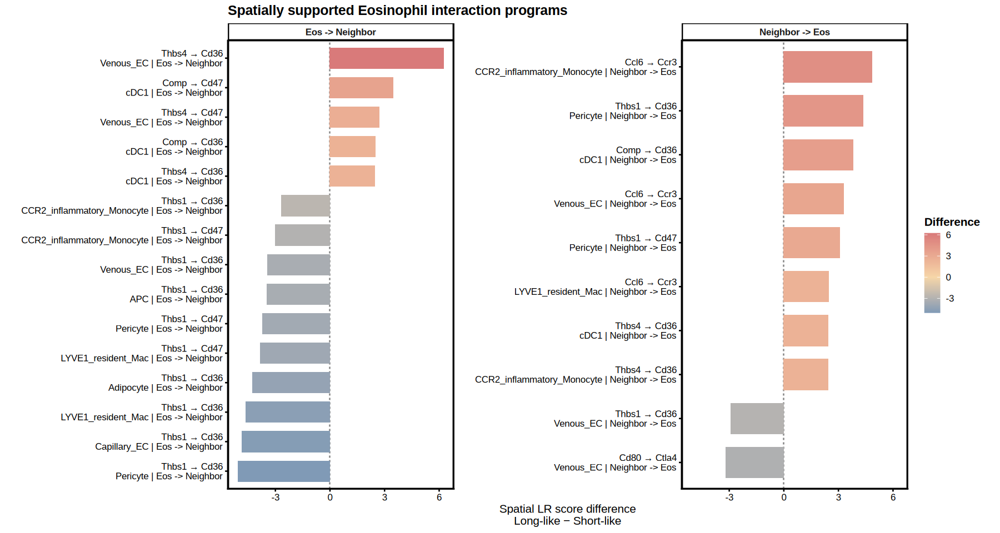

In [261]:
p_lr <- ggplot(
  top_lr,
  aes(
    x = delta_score,
    y = reorder(
      LR_label,
      delta_score
    ),
    fill = delta_score
  )
) +
  geom_vline(
    xintercept = 0,
    linetype = 2,
    colour = "#888888"
  ) +
  geom_col(
    width = 0.7
  ) +
  scale_fill_gradient2(
    low = "#5B8DB8",
    mid = "#F6D6A8",
    high = "#D97A7A",
    midpoint = 0
  ) +
  facet_wrap(
    ~direction,
    scales = "free_y"
  )+
  labs(
    x = "Spatial LR score difference\nLong-like − Short-like",
    y = NULL,
    fill = "Difference",
    title = "Spatially supported Eosinophil interaction programs"
  ) +
  theme_cell()

p_lr

In [262]:
CellChatDB.mouse$interaction %>%
  dplyr::filter(
    ligand == "Ccl6" |
    receptor %in% c("Ccr1", "Ccr3")
  ) %>%
  dplyr::select(
    interaction_name,
    pathway_name,
    ligand,
    receptor,
    everything()
  )

,interaction_name,pathway_name,ligand,receptor,agonist,antagonist,co_A_receptor,co_I_receptor,annotation,interaction_name_2,⋯,receptor.symbol,receptor.family,receptor.location,receptor.keyword,receptor.surfaceome_main,receptor.surfaceome_sub,receptor.adhesome,receptor.secreted_type,receptor.transmembrane,version
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
CCL5_CCR1,CCL5_CCR1,CCL,Ccl5,Ccr1,,,,,Secreted Signaling,Ccl5 - Ccr1,⋯,Ccr1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL3_CCR1,CCL3_CCR1,CCL,Ccl3,Ccr1,,,,,Secreted Signaling,Ccl3 - Ccr1,⋯,Ccr1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL8_CCR1,CCL8_CCR1,CCL,Ccl8,Ccr1,,,,,Secreted Signaling,Ccl8 - Ccr1,⋯,Ccr1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL9_CCR1,CCL9_CCR1,CCL,Ccl9,Ccr1,,,,,Secreted Signaling,Ccl9 - Ccr1,⋯,Ccr1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL6_CCR1,CCL6_CCR1,CCL,Ccl6,Ccr1,,,,,Secreted Signaling,Ccl6 - Ccr1,⋯,Ccr1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL7_CCR1,CCL7_CCR1,CCL,Ccl7,Ccr1,,,,,Secreted Signaling,Ccl7 - Ccr1,⋯,Ccr1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL6_CCR1L1,CCL6_CCR1L1,CCL,Ccl6,Ccr1l1,,,,,Secreted Signaling,Ccl6 - Ccr1l1,⋯,Ccr1l1,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, G-protein coupled receptor, 3D-structure, Glycoprotein",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1
CCL6_CCR2,CCL6_CCR2,CCL,Ccl6,Ccr2,,,,,Secreted Signaling,Ccl6 - Ccr2,⋯,Ccr2,G-protein coupled receptor 1,Cell membrane,"Membrane, Host-virus interaction, Disulfide bond, Transmembrane, Receptor, Alternative splicing, Glycoprotein, Transducer, Reference proteome, Cell membrane, Transmembrane helix, Phosphoprotein, Sulfation, G-protein coupled receptor, 3D-structure, Inflammatory response",Unclassified,Unclassified,,,TRUE,CellChatDB v1
CCL5_CCR3,CCL5_CCR3,CCL,Ccl5,Ccr3,,,,,Secreted Signaling,Ccl5 - Ccr3,⋯,Ccr3,G-protein coupled receptor 1,Cell membrane,"Transducer, Membrane, Reference proteome, Host-virus interaction, Cell membrane, Transmembrane helix, Disulfide bond, Transmembrane, Receptor, Alternative splicing, G-protein coupled receptor, 3D-structure",Receptors,GPCR;Rhodopsin,,,TRUE,CellChatDB v1


In [263]:
c("Ccl6", "Ccr1", "Ccr3") %in% rownames(region_spatial[["Xenium"]])

[1]  TRUE FALSE  TRUE

Long-like and Short-like eosinophils appear embedded in different spatial communication programs
- Long-like Eos：
    - Eos → Neighbor: predicted Thbs4 → Cd36/Cd47 signaling toward venous EC and cDC1, and Comp → Cd36/Cd47 toward cDC1 (ECM/adhesion/tissue-remodeling program)
    - Neighbor → Eos: Ccl6 → Ccr3 from CCR2 inflammatory monocytes, LYVE1-resident macrophages, and venous EC (Ruggiero-Ruff The journal of immunology 2026, https://doi.org/10.1093/jimmun/vkag141.1564)
- Short-like
    - Eos → Neighbor: Thbs1 → Cd36/Cd47 interactions toward capillary EC, LYVE1 macrophages, adipocytes, APC, pericytes, venous EC and inflammatory monocytes (broad THBS1-associated stromal/vascular interaction program)

### Back to main

In [69]:
# ============================================================
# 1. Eos state variables to map back
# ============================================================

state_vars <- c(
  "EosShort_score_nonrib",
  "EosLong_score",
  "EosShort_z",
  "EosLong_z",
  "EosState_balance",
  "EosState_activity",
  "EosState_n_detected",
  "EosState_extreme"
)

state_vars <- intersect(
  state_vars,
  colnames(eos_obj@meta.data)
)

state_vars

[1] "EosShort_score_nonrib" "EosLong_score"         "EosShort_z"           
[4] "EosLong_z"             "EosState_balance"      "EosState_activity"    
[7] "EosState_n_detected"   "EosState_extreme"

In [70]:
# ============================================================
# 2. Map Eos-state metadata back to full region_spatial
# ============================================================

eos_md <- eos_obj@meta.data

for (v in state_vars) {

  region_spatial@meta.data[[v]] <- eos_md[
    match(
      rownames(region_spatial@meta.data),
      rownames(eos_md)
    ),
    v
  ]
}

In [71]:
sum(!is.na(region_spatial$EosState_balance))
ncol(eos_obj)

[1] 428

[1] 428

In [72]:
table(
  region_spatial$EosState_extreme,
  useNA = "ifany"
)


Short-lived-like     Intermediate  Long-lived-like             <NA> 
              40              354               34            73936 

In [73]:
region_spatial$EosState_spatial <- dplyr::case_when(

  region_spatial$EosState_extreme == "Short-lived-like" ~
    "Short-lived-like",

  region_spatial$EosState_extreme == "Long-lived-like" ~
    "Long-lived-like",

  region_spatial$EosState_extreme == "Intermediate" ~
    "Intermediate",

  TRUE ~
    "Other"
)

region_spatial$EosState_spatial <- factor(
  region_spatial$EosState_spatial,
  levels = c(
    "Other",
    "Intermediate",
    "Short-lived-like",
    "Long-lived-like"
  )
)

In [74]:
eos_state_cols <- c(
  "Other"            = "#E8E8E8",
  "Intermediate"     = "#CFCFCF",
  "Short-lived-like" = "#7E9AD9",
  "Long-lived-like"  = "#E89A8F"
)

In [101]:
table(region_spatial$EosState_spatial)


           Other     Intermediate Short-lived-like  Long-lived-like 
           73936              354               40               34 

In [268]:
colnames(region_spatial@meta.data)

[1] "orig.ident"                                                
  [2] "nCount_Xenium"                                             
  [3] "nFeature_Xenium"                                           
  [4] "cell_id"                                                   
  [5] "x_centroid"                                                
  [6] "y_centroid"                                                
  [7] "transcript_counts"                                         
  [8] "control_probe_counts"                                      
  [9] "genomic_control_counts"                                    
 [10] "control_codeword_counts"                                   
 [11] "unassigned_codeword_counts"                                
 [12] "deprecated_codeword_counts"                                
 [13] "total_counts"                                              
 [14] "cell_area"                                                 
 [15] "nucleus_area"                                              
 [16] "nucleus_count"                                             
 [17] "segmentation_method"                                       
 [18] "region_id"                                                 
 [19] "control_fraction_cell"                                     
 [20] "nucleus_missing_flag"                                      
 [21] "multiple_nuclei_flag"                                      
 [22] "cell_area_outlier_flag"                                    
 [23] "high_control_flag"                                         
 [24] "segmentation_multiplet_flag"                               
 [25] "qc_core_pass"                                              
 [26] "qc_review_flag"                                            
 [27] "mouse_id"                                                  
 [28] "section_id"                                                
 [29] "biological_replicate_id"                                   
 [30] "genotype"                                                  
 [31] "treatment"                                                 
 [32] "condition"                                                 
 [33] "age_weeks"                                                 
 [34] "metadata_status"                                           
 [35] "do_not_interpret"                                          
 [36] "grid_x"                                                    
 [37] "grid_y"                                                    
 [38] "grid_id"                                                   
 [39] "edge_proxy"                                                
 [40] "grid_size_um"                                              
 [41] "local_density"                                             
 [42] "dense_aggregate"                                           
 [43] "primary_include"                                           
 [44] "strict_include"                                            
 [45] "hotspot_review_cell"                                       
 [46] "hotspot_sensitivity_include"                               
 [47] "section_status"                                            
 [48] "mask_rule_primary"                                         
 [49] "mask_rule_strict"                                          
 [50] "mask_rule_hotspot_sensitivity"                             
 [51] "provenance"                                                
 [52] "run_label"                                                 
 [53] "execution_mode"                                            
 [54] "generated_utc"                                             
 [55] "source_artifact"                                           
 [56] "section_input_cells"                                       
 [57] "section_primary_include_cells"                             
 [58] "section_strict_include_cells"                              
 [59] "section_hotspot_sensitivity_include_cells"                 
 [60] "qc_threshold_source"                      

Coordinate system already present.
ℹ Adding new coordinate system, which will replace the existing one.


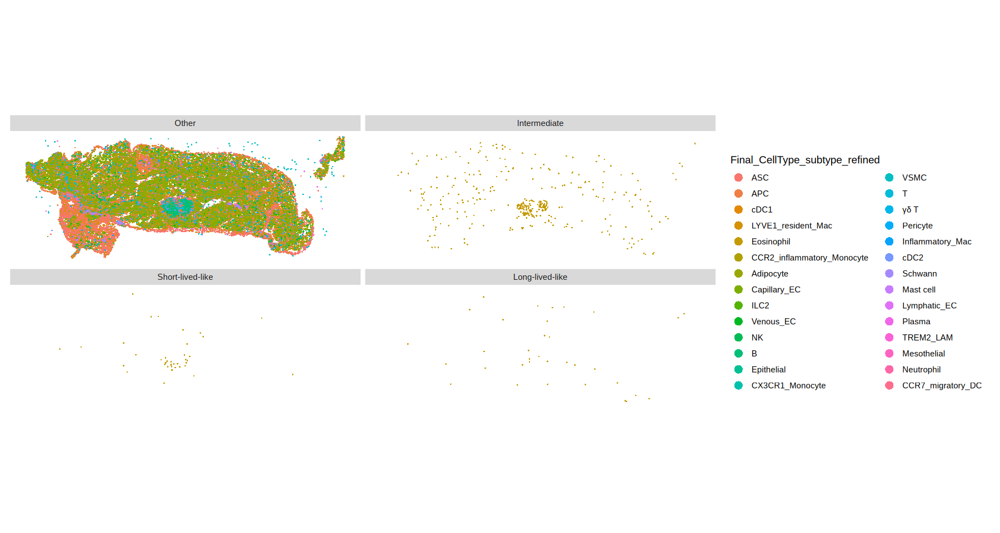

In [269]:
ImageDimPlot(
  region_spatial,
  fov = "fov",
  split.by = "EosState_spatial",
  group.by = "Final_CellType_subtype_refined",
  flip_xy = FALSE,
  dark.background = FALSE
)

In [77]:
coords <- GetTissueCoordinates(
  region_spatial[["fov"]],
  which = "centroids"
) %>%
  as.data.frame()

if (!"cell" %in% colnames(coords)) {
  coords$cell <- rownames(coords)
}

In [78]:
md <- region_spatial@meta.data

coords$EosState_balance <- md$EosState_balance[
  match(
    coords$cell,
    rownames(md)
  )
]

coords$EosState_extreme <- as.character(
  md$EosState_extreme[
    match(
      coords$cell,
      rownames(md)
    )
  ]
)

In [79]:
eos_coords <- coords %>%
  dplyr::filter(
    !is.na(EosState_balance)
  )

In [86]:
options(repr.plot.width=10, repr.plot.height=6)

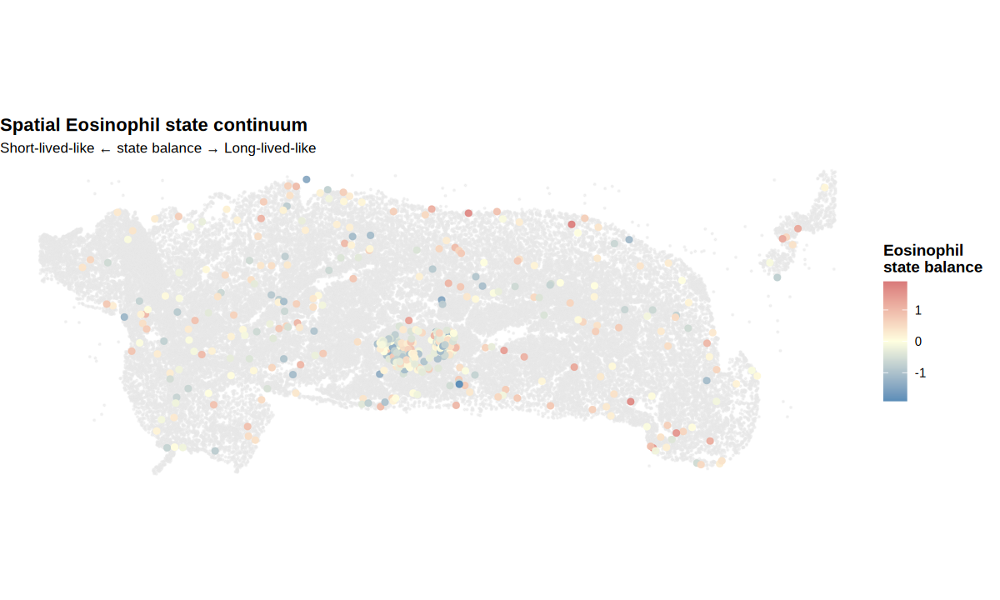

In [108]:
library(ggplot2)

balance_lim <- max(
  abs(eos_coords$EosState_balance),
  na.rm = TRUE
)

ggplot() +

  # ----------------------------------------------------------
  # All cells in grey
  # ----------------------------------------------------------
  geom_point(
    data = coords,
    aes(
      x = x,
      y = y
    ),
    colour = "#E8E8E8",
    size = 0.10,
    alpha = 0.5
  ) +

  # ----------------------------------------------------------
  # Eos colored by continuous balance
  # ----------------------------------------------------------
  geom_point(
    data = eos_coords,
    aes(
      x = x,
      y = y,
      colour = EosState_balance
    ),
    size = 1.5,
    alpha = 0.95
  ) +

  scale_colour_gradient2(
    low  = "#5B8DB8",
    mid  = "lightyellow",
    high = "#D97A7A",
    midpoint = 0,
    limits = c(
      -balance_lim,
      balance_lim
    ),
    name = "Eosinophil\nstate balance"
  ) +

  coord_fixed() +

  labs(
    title = "Spatial Eosinophil state continuum",
    subtitle = "Short-lived-like ← state balance → Long-lived-like",
    x = NULL,
    y = NULL
  ) +

  theme_void() +

  theme(
    plot.title = element_text(
      face = "bold",
      size = 13
    ),
    plot.subtitle = element_text(
      size = 10
    ),
    legend.title = element_text(
      face = "bold"
    )
  )

In [81]:
polarized_coords <- eos_coords %>%
  dplyr::filter(
    EosState_extreme %in%
      c(
        "Short-lived-like",
        "Long-lived-like"
      )
  )

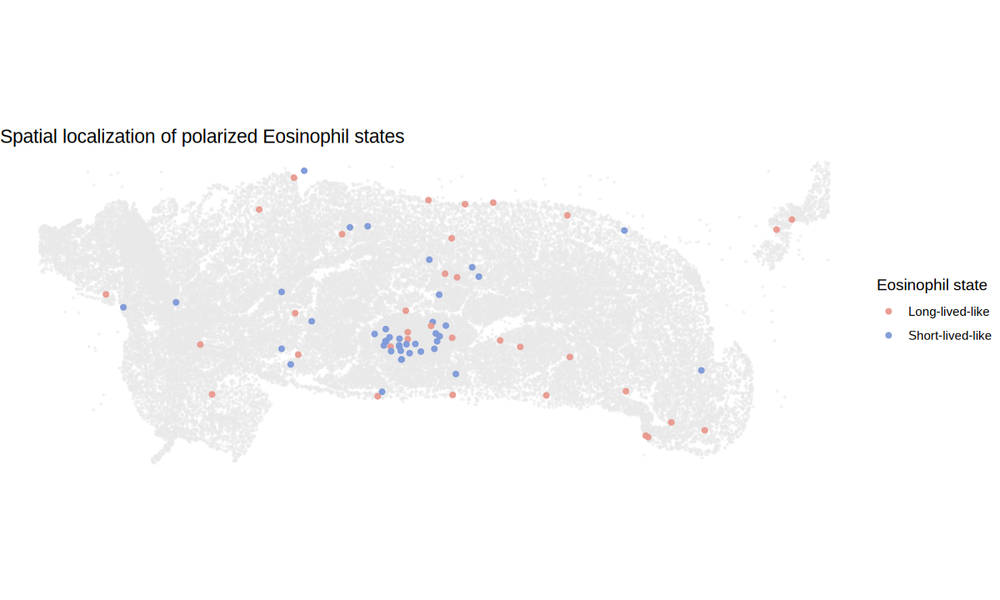

In [88]:
ggplot() +

  geom_point(
    data = coords,
    aes(x = x, y = y),
    colour = "#E8E8E8",
    size = 0.10,
    alpha = 0.45
  ) +

  geom_point(
    data = polarized_coords,
    aes(
      x = x,
      y = y,
      colour = EosState_extreme
    ),
    size = 1.2,
    alpha = 0.95
  ) +

  scale_colour_manual(
    values = c(
      "Short-lived-like" = "#7E9AD9",
      "Long-lived-like"  = "#E89A8F"
    )
  ) +

  coord_fixed() +

  labs(
    title = "Spatial localization of polarized Eosinophil states",
    colour = "Eosinophil state"
  ) +

  theme_void()

In [131]:
saveRDS(region_spatial, file.path(ANCHOR_ROOT, paste0(REGION_ID, "_spatial.rds")))